In [3]:
#0: imports

import uproot 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

from dataAnalyse import CCV1
from torch_geometric.data import DataLoader 
from torch_geometric.nn import knn_graph

import numpy as np
import time
from Imports import Aggloremative, calculate_reco_to_sim_score, calculate_sim_to_reco_score, calculate_all_event_scores

import warnings
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)

In [4]:
#1: Load Data + Model
#1.1: Load Data Through the dataloader - used for predictions
testpath = "/vols/cms/mm1221/Data/100k/5pi/test/"  
data_test = CCV1(testpath, max_events=10000, inp = 'test')
test_loader = DataLoader(data_test, batch_size=1, shuffle=False, follow_batch=['x'])



### Loading tracksters data


  0%|                                                     | 0/1 [00:00<?, ?it/s]

/vols/cms/mm1221/Data/100k/5pi/test/raw/test.root


100%|█████████████████████████████████████████████| 1/1 [01:29<00:00, 89.66s/it]
/cvmfs/sft.cern.ch/lcg/views/LCG_105a_cuda/x86_64-el9-gcc11-opt/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [ ]:
print(data_test[0].GT_ind)

In [ ]:
print(data_test)

In [31]:
# Also load explicitely, used for analysis and plots
data_path = '/vols/cms/mm1221/Data/100k/5pi/test/raw/test.root'
data_file = uproot.open(data_path)

ass = data_file['associations']['tsCLUE3D_recoToSim_CP'].array()

Track_ind = data_file['tracksters;2']['vertices_indexes'].array()
GT_ind = data_file['simtrackstersCP;3']['vertices_indexes'].array()
GT_mult = data_file['simtrackstersCP;3']['vertices_multiplicity'].array()
GT_bc = data_file['simtrackstersCP;3']['barycenter_x'].array()
energies = data_file['clusters;4']['energy'].array()
LC_x = data_file['clusters;4']['position_x'].array()
LC_y = data_file['clusters;4']['position_y'].array()
LC_z = data_file['clusters;4']['position_z'].array()
LC_eta = data_file['clusters;4']['position_eta'].array()
MT_ind = data_file['trackstersMerged;2']['vertices_indexes'].array()
single_energy = data_file['simtrackstersCP;3']['regressed_energy'].array()

noh = data_file['clusters;4']['cluster_number_of_hits'].array()


#1.3 Filter so get rid of events with 0 calo particles
skim_mask = []
for e in GT_bc:
    if 1 <= len(e) :
        skim_mask.append(True)
    else:
        skim_mask.append(False)

Track_ind = Track_ind[skim_mask]
GT_ind = GT_ind[skim_mask]
GT_mult = GT_mult[skim_mask]
energies = energies[skim_mask]
LC_x = LC_x[skim_mask]
LC_y = LC_y[skim_mask]
LC_z = LC_z[skim_mask]
LC_eta = LC_eta[skim_mask]
MT_ind = MT_ind[skim_mask]
ass = ass[skim_mask]
noh = noh[skim_mask]
single_energy = single_energy[skim_mask]

#1.3 Filter so get rid of events with 0 calo particles


skim_mask = []
for e in ass:
    if 2 <= len(e):
        skim_mask.append(True)
    else:
        skim_mask.append(False)

Track_ind = Track_ind[skim_mask]
GT_ind = GT_ind[skim_mask]
GT_mult = GT_mult[skim_mask]
energies = energies[skim_mask]
LC_x = LC_x[skim_mask]
LC_y = LC_y[skim_mask]
LC_z = LC_z[skim_mask]
LC_eta = LC_eta[skim_mask]
MT_ind = MT_ind[skim_mask]
noh = noh[skim_mask]
single_energy = single_energy[skim_mask]






In [ ]:
print(np.max(GT_mult[0][2]))

In [32]:
import awkward as ak

def filter_repeated_indexes(GT_ind, GT_mult):
    """
    Given:
       - GT_ind: an awkward array (or list of lists) of indexes for one event.
       - GT_mult: an awkward array (or list of lists) of multiplicity values (same shape as GT_ind).
    
    For any index that appears in more than one sub-array, keep only the occurrence with the
    smallest multiplicity, and set that multiplicity to 1.0. All other occurrences are removed.
    Additionally, after filtering, all remaining multiplicity values are set to 1.0.
    
    Returns:
       new_GT_ind, new_GT_mult  
         Both are returned as <class 'awkward.highlevel.Array'>.
    """
    # 1. Record all occurrences of each index.
    occurrences = {}
    for sub_i, (sub_ind, sub_mult) in enumerate(zip(GT_ind, GT_mult)):
        for pos, (val, mult) in enumerate(zip(sub_ind, sub_mult)):
            occurrences.setdefault(val, []).append((sub_i, pos, mult))
    
    # 2. Mark occurrences to remove and those to update.
    removals = set()      # (subarray_index, position) tuples that should be removed.
    update_to_one = set() # (subarray_index, position) tuples that are kept and should be set to 1.0.
    
    for index_val, occ_list in occurrences.items():
        if len(occ_list) > 1:
            # Sort occurrences by multiplicity (ascending).
            occ_list_sorted = sorted(occ_list, key=lambda x: x[2])
            kept_occ = occ_list_sorted[0]  # Keep the occurrence with the smallest multiplicity.
            update_to_one.add((kept_occ[0], kept_occ[1]))
            for occ in occ_list_sorted[1:]:
                removals.add((occ[0], occ[1]))
    
    # 3. Reconstruct new GT_ind and GT_mult by filtering out the removals.
    # Also, set every kept multiplicity to 1.0.
    new_GT_ind = []
    new_GT_mult = []
    for sub_i, (sub_ind, sub_mult) in enumerate(zip(GT_ind, GT_mult)):
        new_sub_ind = []
        new_sub_mult = []
        for pos, (val, mult) in enumerate(zip(sub_ind, sub_mult)):
            if (sub_i, pos) in removals:
                continue  # Skip removed occurrences.
            new_sub_ind.append(val)
            # Set every kept multiplicity to 1.0.
            new_sub_mult.append(1.0)
        new_GT_ind.append(new_sub_ind)
        new_GT_mult.append(new_sub_mult)
    
    # Convert the resulting lists to awkward arrays.
    return ak.Array(new_GT_ind), ak.Array(new_GT_mult)

def filter_repeated_indexes_for_events(all_GT_ind, all_GT_mult):
    """
    Given a list of events, each with its GT_ind and GT_mult (lists of sub-arrays),
    apply filter_repeated_indexes to each event.
    
    Args:
        all_GT_ind: List of events. Each event is an awkward array (or list of sub-arrays) of indexes.
        all_GT_mult: List of events. Each event is an awkward array (or list of sub-arrays) of multiplicity values.
    
    Returns:
        new_all_GT_ind, new_all_GT_mult: Awkward arrays (one per event) of filtered GT_ind and GT_mult.
    """
    new_all_GT_ind = []
    new_all_GT_mult = []
    
    # Loop over each event.
    for event_ind, event_mult in zip(all_GT_ind, all_GT_mult):
        new_event_ind, new_event_mult = filter_repeated_indexes(event_ind, event_mult)
        new_all_GT_ind.append(new_event_ind)
        new_all_GT_mult.append(new_event_mult)
    
    # Convert the list of events into awkward arrays.
    return ak.Array(new_all_GT_ind), ak.Array(new_all_GT_mult)


In [33]:
GT_ind, GT_mult = filter_repeated_indexes_for_events(GT_ind, GT_mult)

In [34]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch_geometric.data import Data
from torch_geometric.nn import knn_graph



class CustomStaticEdgeConv(nn.Module):
    def __init__(self, nn_module):
        super(CustomStaticEdgeConv, self).__init__()
        self.nn_module = nn_module

    def forward(self, x, edge_index):
        """
        Args:
            x (torch.Tensor): Node features of shape (N, F).
            edge_index (torch.Tensor): Predefined edges [2, E], where E is the number of edges.

        Returns:
            torch.Tensor: Node features after static edge aggregation.
        """
        row, col = edge_index  # Extract row (source) and col (target) nodes
        x_center = x[row]
        x_neighbor = x[col]

        # Compute edge features (relative)
        edge_features = torch.cat([x_center, x_neighbor - x_center], dim=-1)
        edge_features = self.nn_module(edge_features)

        # Aggregate features back to nodes
        num_nodes = x.size(0)
        node_features = torch.zeros(num_nodes, edge_features.size(-1), device=x.device)
        node_features.index_add_(0, row, edge_features)

        # Normalization (Divide by node degrees)
        counts = torch.bincount(row, minlength=num_nodes).clamp(min=1).view(-1, 1)
        node_features = node_features / counts

        return node_features


class CustomGATLayer(nn.Module):
    def __init__(self, in_dim, out_dim, heads=1, concat=True, dropout=0.6, alpha=0.4):
        """
        Initializes the Custom GAT Layer.

        Args:
            in_dim (int): Input feature dimension.
            out_dim (int): Output feature dimension per head.
            heads (int): Number of attention heads.
            concat (bool): Whether to concatenate the heads' output or average them.
            dropout (float): Dropout rate on attention coefficients.
            alpha (float): Negative slope for LeakyReLU.
        """
        super(CustomGATLayer, self).__init__()
        self.in_dim = in_dim
        self.out_dim = out_dim
        self.heads = heads
        self.concat = concat

        # Linear transformation for node features
        self.W = nn.Linear(in_dim, heads * out_dim, bias=False)

        # Attention mechanism: a vector for each head
        self.a_src = nn.Parameter(torch.zeros(heads, out_dim))
        self.a_tgt = nn.Parameter(torch.zeros(heads, out_dim))
        nn.init.xavier_uniform_(self.a_src.data, gain=1.414)
        nn.init.xavier_uniform_(self.a_tgt.data, gain=1.414)

        self.leakyrelu = nn.LeakyReLU(alpha)
        self.dropout = nn.Dropout(dropout)

        # Optional batch normalization
        self.batch_norm = nn.BatchNorm1d(heads * out_dim) if concat else nn.BatchNorm1d(out_dim)

    def forward(self, x, edge_index):
        """
        Forward pass of the GAT layer.

        Args:
            x (torch.Tensor): Node features of shape (N, in_dim).
            edge_index (torch.Tensor): Edge indices of shape (2, E).

        Returns:
            torch.Tensor: Updated node features after attention-based aggregation.
        """
        src, tgt = edge_index  # Source and target node indices
        N = x.size(0)

        # Apply linear transformation and reshape for multi-head attention
        h = self.W(x)  # Shape: (N, heads * out_dim)
        h = h.view(N, self.heads, self.out_dim)  # Shape: (N, heads, out_dim)

        # Gather node features for each edge
        h_src = h[src]  # Shape: (E, heads, out_dim)
        h_tgt = h[tgt]  # Shape: (E, heads, out_dim)

        # Compute attention coefficients using separate vectors for source and target
        e_src = (h_src * self.a_src).sum(dim=-1)  # Shape: (E, heads)
        e_tgt = (h_tgt * self.a_tgt).sum(dim=-1)  # Shape: (E, heads)
        e = self.leakyrelu(e_src + e_tgt)  # Shape: (E, heads)

        # Compute softmax normalization for attention coefficients
        # To ensure numerical stability
        e = e - e.max(dim=0, keepdim=True)[0]
        alpha = torch.exp(e)  # Shape: (E, heads)

        # Sum of attention coefficients for each target node and head
        alpha_sum = torch.zeros(N, self.heads, device=x.device).scatter_add_(0, tgt.unsqueeze(-1).expand(-1, self.heads), alpha)

        # Avoid division by zero
        alpha_sum = alpha_sum + 1e-16

        # Normalize attention coefficients
        alpha = alpha / alpha_sum[tgt]  # Shape: (E, heads)
        alpha = self.dropout(alpha)

        # Weighted aggregation of source node features
        h_prime = h_src * alpha.unsqueeze(-1)  # Shape: (E, heads, out_dim)

        # Initialize output tensor and aggregate
        out = torch.zeros(N, self.heads, self.out_dim, device=x.device)
        out.scatter_add_(0, tgt.unsqueeze(-1).unsqueeze(-1).expand(-1, self.heads, self.out_dim), h_prime)  # Shape: (N, heads, out_dim)

        # Concatenate or average the heads
        if self.concat:
            out = out.view(N, self.heads * self.out_dim)  # Shape: (N, heads*out_dim)
        else:
            out = out.mean(dim=1)  # Shape: (N, out_dim)

        # Apply batch normalization
        out = self.batch_norm(out)

        return out

class Net(nn.Module):
    def __init__(self, hidden_dim=64, num_layers=4, dropout=0.3, contrastive_dim=8, heads=4):
        """
        Initializes the neural network with alternating StaticEdgeConv and GAT layers.

        Args:
            hidden_dim (int): Dimension of hidden layers.
            num_layers (int): Total number of convolutional layers (both StaticEdgeConv and GAT).
            dropout (float): Dropout rate.
            contrastive_dim (int): Dimension of the contrastive output.
            heads (int): Number of attention heads in GAT layers.
        """
        super(Net, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.dropout = dropout
        self.contrastive_dim = contrastive_dim
        self.heads = heads

        # Input encoder
        self.lc_encode = nn.Sequential(
            nn.Linear(16, hidden_dim),
            nn.ELU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ELU()
        )

        # Define the network's convolutional layers, alternating between StaticEdgeConv and GAT
        self.convs = nn.ModuleList()
        for layer_idx in range(num_layers):
            # Even-indexed layers: StaticEdgeConv
            conv = CustomStaticEdgeConv(
                nn.Sequential(
                    nn.Linear(2 * hidden_dim, hidden_dim),
                    nn.ELU(),
                    nn.BatchNorm1d(hidden_dim),
                    nn.Dropout(p=dropout)
                )
            )
            self.convs.append(conv)

        # Output layer
        self.output = nn.Sequential(
            nn.Linear(hidden_dim, 64),
            nn.ELU(),
            nn.Dropout(p=dropout),
            nn.Linear(64, 32),
            nn.ELU(),
            nn.Dropout(p=dropout),
            nn.Linear(32, contrastive_dim)
        )

    def forward(self, x, edge_index, batch):
        """
        Forward pass of the network.

        Args:
            x (torch.Tensor): Input node features of shape (N, 15).
            edge_index (torch.Tensor): Edge indices of shape (2, E).
            batch (torch.Tensor): Batch vector.

        Returns:
            torch.Tensor: Output features after processing.
            torch.Tensor: Batch vector.
        """
        # Input encoding
        x_lc_enc = self.lc_encode(x)  # Shape: (N, hidden_dim)

        # Apply convolutional layers with residual connections
        feats = x_lc_enc
        for idx, conv in enumerate(self.convs):
            feats = conv(feats, edge_index) + feats  # Residual connection

        # Final output
        out = self.output(feats)
        return out, batch


model = Net(
    hidden_dim=128,
    num_layers=4,
    dropout=0.3,
    contrastive_dim=16
)
checkpoint= torch.load('/vols/cms/mm1221/hgcal/pion5New/Track/NegativeMining/resultsSECNeg/best_model.pt',  map_location=torch.device('cpu'))
model.load_state_dict(checkpoint)  
model.eval()  

Net(
  (lc_encode): Sequential(
    (0): Linear(in_features=16, out_features=128, bias=True)
    (1): ELU(alpha=1.0)
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ELU(alpha=1.0)
  )
  (convs): ModuleList(
    (0-3): 4 x CustomStaticEdgeConv(
      (nn_module): Sequential(
        (0): Linear(in_features=256, out_features=128, bias=True)
        (1): ELU(alpha=1.0)
        (2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (3): Dropout(p=0.3, inplace=False)
      )
    )
  )
  (output): Sequential(
    (0): Linear(in_features=128, out_features=64, bias=True)
    (1): ELU(alpha=1.0)
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=64, out_features=32, bias=True)
    (4): ELU(alpha=1.0)
    (5): Dropout(p=0.3, inplace=False)
    (6): Linear(in_features=32, out_features=16, bias=True)
  )
)

In [35]:
import awkward as ak

# Create new lists to store the filtered results
# This makes sure GT_ind, MT_ind, Recon_ind have the same indices
filtered_GT_ind = []
filtered_GT_mult = []
filtered_MT_ind = []


for event_idx, track_indices in enumerate(Track_ind):
    # Flatten the current event's track indices and convert to a set
    track_flat = set(ak.flatten(track_indices).tolist())  # Ensure it contains only integers
    
    # Filter GT_ind and GT_mult for the current event, preserving structure
    event_GT_ind = GT_ind[event_idx]
    event_GT_mult = GT_mult[event_idx]
    filtered_event_GT_ind = []
    filtered_event_GT_mult = []
    for sublist_ind, sublist_mult in zip(event_GT_ind, event_GT_mult):
        filtered_sublist_ind = [idx for idx in sublist_ind if idx in track_flat]
        filtered_sublist_mult = [mult for idx, mult in zip(sublist_ind, sublist_mult) if idx in track_flat]
        filtered_event_GT_ind.append(filtered_sublist_ind)
        filtered_event_GT_mult.append(filtered_sublist_mult)

    # Filter MT_ind for the current event, preserving structure
    event_MT_ind = MT_ind[event_idx]
    filtered_event_MT_ind = []
    for sublist in event_MT_ind:
        filtered_sublist = [idx for idx in sublist if idx in track_flat]
        filtered_event_MT_ind.append(filtered_sublist)

    # Append filtered results
    filtered_GT_ind.append(filtered_event_GT_ind)
    filtered_GT_mult.append(filtered_event_GT_mult)
    filtered_MT_ind.append(filtered_event_MT_ind)

# Convert the filtered results back to awkward arrays
GT_ind_filt = ak.Array(filtered_GT_ind)
GT_mult_filt = ak.Array(filtered_GT_mult)
MT_ind_filt = ak.Array(filtered_MT_ind)


In [36]:
#3: Make Predictions + Cluster -> Calculate the inference time
#3.1: Make Predictions

all_predictions = []  
total_times = []
start_time = time.time()

for i, data in enumerate(data_test):
    edge_index = knn_graph(data.x, k=16)  
    predictions = model(data.x, edge_index, 1)
    all_predictions.append(predictions[0].detach().cpu().numpy())  

all_predictions = np.array(all_predictions)

#3.2: Cluster using threshold found in Script A

all_cluster_labels = Aggloremative(all_predictions, threshold = 0.14)

end_time = time.time()

#3.3: Calculate average inference time

time_diff = end_time - start_time
inference_time = time_diff/len(all_cluster_labels)
print("average inference time:", inference_time)



average inference time: 0.011810811724038733


In [11]:
import numpy as np
import pandas as pd
from tqdm import tqdm  # For progress bar
def calculate_all_event_scores2(GT_ind, energies, recon_ind, LC_x, LC_y, LC_z, LC_eta, multi, num_events = 100):
    """
    Calculate sim-to-reco and reco-to-sim scores for all CaloParticle and ReconstructedTrackster combinations across all events.

    Parameters:
    - GT_ind: List of CaloParticle indices for all events.
    - energies: List of energy arrays for all events.
    - recon_ind: List of ReconstructedTrackster indices for all events.
    - LC_x, LC_y, LC_z, LC_eta: Lists of x, y, z positions and eta values for all DetIds across events.

    Returns:
    - DataFrame containing scores and additional features for each CaloParticle-Trackster combination across all events.
    """
    # Initialize an empty list to store results
    all_results = []

    # Loop over all events with a progress bar
    for event_index in tqdm(range(num_events)):

        caloparticles = GT_ind[event_index]  # Indices for all CaloParticles in the event
        tracksters = recon_ind[event_index]  # Indices for all ReconstructedTracksters in the event
        event_energies = energies[event_index]  # Energies for this event
        event_multi = multi[event_index]
        # Extract layer cluster positions and eta for this event
        event_x = np.array(LC_x[event_index])
        event_y = np.array(LC_y[event_index])
        event_z = np.array(LC_z[event_index])
        event_eta = np.array(LC_eta[event_index])

        # Compute barycenter for each CaloParticle
        cp_barycenters = []
        cp_avg_etas = []
        for caloparticle in caloparticles:
            print(len(event_x))
            barycenter_x = np.mean([event_x[det_id] for det_id in caloparticle])
            print(barycenter_x)
            barycenter_y = np.mean([event_y[det_id] for det_id in caloparticle])
            barycenter_z = np.mean([event_z[det_id] for det_id in caloparticle])
            cp_barycenters.append(np.array([barycenter_x, barycenter_y, barycenter_z]))
            
            # Compute average eta
            avg_eta = np.mean([event_eta[det_id] for det_id in caloparticle])
            cp_avg_etas.append(avg_eta)

        # Compute separation between two CaloParticles if at least two exist
        if len(cp_barycenters) >= 2:
            cp_separation = np.linalg.norm(cp_barycenters[0] - cp_barycenters[1])
        else:
            cp_separation = 0.0
            
        trackster_det_id_sets = [set(trackster) for trackster in tracksters]

        # Loop over all CaloParticles
        for calo_idx, caloparticle in enumerate(caloparticles):
            # Use corresponding multiplicity for this calo particle
            Calo_multi = event_multi[calo_idx]
            calo_det_ids = set(calo_id for calo_id in caloparticle)
            cp_energy = np.sum(event_energies[caloparticle] / Calo_multi)
            
            max_shared_energy = 0.0
            best_tst_idx = None
            trackster_det_id_sets = [set(trackster) for trackster in tracksters]
            # Loop over all Tracksters
            for trackster_idx, trackster in enumerate(tracksters):
                      
                trackster_det_ids = trackster_det_id_sets[trackster_idx]
                shared_det_ids = calo_det_ids.intersection(trackster_det_ids)

                if not shared_det_ids:
                    continue  # No shared detector IDs
                
                
                # Calculate shared_energy by summing energies of shared det_ids
                shared_indices = [i for i, calo_id in enumerate(calo_det_ids) if calo_id in shared_det_ids]
                Calo_multi_shared_indices = Calo_multi[shared_indices]
                
                shared_energy = np.sum(event_energies[list(shared_det_ids)] / Calo_multi_shared_indices) if shared_det_ids else 0.0
                
                
                sim_to_reco_score = calculate_sim_to_reco_score(caloparticle, event_energies, trackster, Calo_multi)
                # Calculate reco-to-sim score
                reco_to_sim_score = calculate_reco_to_sim_score(trackster, event_energies, caloparticle, Calo_multi)

                # Calculate total energy for CaloParticle and Trackster
                cp_energy_lc2 = event_energies[caloparticle] / Calo_multi
                cp_energy = np.sum(cp_energy_lc2)
                
                trackster_energy = np.sum([event_energies[det_id] for det_id in trackster])

                # Calculate energy difference ratio
                energy_diff_ratio = (trackster_energy / cp_energy if cp_energy != 0 else None)

                # Append results
                all_results.append({
                    "event_index": event_index,
                    "cp_id": calo_idx,
                    "trackster_id": trackster_idx,
                    "sim_to_reco_score": sim_to_reco_score,
                    "reco_to_sim_score": reco_to_sim_score,
                    "cp_energy": cp_energy,
                    "trackster_energy": trackster_energy,
                    "cp_avg_eta": cp_avg_etas[calo_idx],
                    "cp_separation": cp_separation,
                    "energy_ratio": energy_diff_ratio,
                    "shared_energy": shared_energy  # New column
                })

    # Convert results to a DataFrame
    df = pd.DataFrame(all_results)
    return df



In [41]:
#4: Calculate Scores and create DF for our model and TICL

#4.1: Turn the cluster labels into our reconstructed tracksters

recon_ind = []

print(len(Track_ind))
print(len(all_cluster_labels))

for event_idx, labels in enumerate(all_cluster_labels):
    event_clusters = {} 
    
    for cluster_idx, cluster_label in enumerate(labels):
        if cluster_label not in event_clusters:
            event_clusters[cluster_label] = []
        event_clusters[cluster_label].extend(Track_ind[event_idx][cluster_idx])
    
    recon_ind.append([event_clusters[label] for label in sorted(event_clusters.keys())])

#4.2 Make DF from our model and CERN


9536
9536


In [11]:
df_CL = calculate_all_event_scores2(GT_ind_filt, energies, recon_ind, LC_x, LC_y, LC_z, LC_eta, GT_mult_filt, num_events = 1000)
df_TICL = calculate_all_event_scores2(GT_ind_filt, energies, MT_ind_filt, LC_x, LC_y, LC_z, LC_eta, GT_mult_filt, num_events = 1000)

  0%|                                                  | 0/1000 [00:00<?, ?it/s]

1248
-66.53388
1248
-67.94769
1248
-62.00976
1248
-39.592518


  0%|▏                                         | 3/1000 [00:00<02:09,  7.71it/s]

499
-114.03382
499
-48.302452
499
-32.72821
469
22.937908
469
55.253845
809
156.59674
809
67.93063
809
74.31505
809
100.520744


  0%|▏                                         | 5/1000 [00:00<02:05,  7.93it/s]

831
126.86609
831
153.47513
831
158.48456
885
15.873079
885
54.472595
885
15.925508
885
47.889694
885
17.910015


  1%|▎                                         | 6/1000 [00:00<02:25,  6.83it/s]

975
-42.695335
975
-52.300716
975
-67.49003
975
-39.196926
975
-43.876762


  1%|▎                                         | 8/1000 [00:01<03:12,  5.16it/s]

961
-32.69702
961
1.6401052
961
23.052237
961
-22.848843
740
-32.51407
740
-62.169147
740
20.863922
740
20.716078


  1%|▍                                        | 10/1000 [00:01<02:42,  6.08it/s]

558
97.40324
558
142.33473
558
48.060917
558
45.602467
558
47.684345
222
53.063465
1118
-98.32401
1118
-105.19121
1118
-63.70384
1118
-141.33902
1118
-98.47703


  1%|▌                                        | 13/1000 [00:02<02:31,  6.53it/s]

1216
37.89571
1216
83.529144
1216
89.20841
1216
101.00472
1216
81.693954
304
-20.509642


  2%|▋                                        | 16/1000 [00:02<01:44,  9.44it/s]

299
-55.81102
760
-45.94265
760
31.082611
227
5.0090427
227
-24.34774
1059
56.090164
1059
48.70263
1059
-17.257666
1059
99.81971


  2%|▊                                        | 20/1000 [00:02<01:49,  8.95it/s]

98
82.31905
1090
37.700714
1090
17.397535
1090
-6.7598634
1090
18.664085


/cvmfs/sft.cern.ch/lcg/views/LCG_105a_cuda/x86_64-el9-gcc11-opt/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/cvmfs/sft.cern.ch/lcg/views/LCG_105a_cuda/x86_64-el9-gcc11-opt/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


85
-21.169096
85
-5.982775
390
nan
390
50.93758
390
103.75737
390
nan
390
22.923105


  2%|▉                                        | 22/1000 [00:02<01:57,  8.31it/s]

1030
111.93127
1030
-4.970267
1030
77.40267
1030
-2.8869653


  2%|▉                                        | 23/1000 [00:03<02:24,  6.74it/s]

1034
-52.03655
1034
-14.635694
1034
-17.928038
1034
-15.849379
1034
-51.144527


  3%|█                                        | 26/1000 [00:03<02:29,  6.49it/s]

529
-91.32384
562
-7.257235
562
nan
562
2.574513
562
9.0985
418
81.197754
418
53.868065


  3%|█▏                                       | 29/1000 [00:04<02:02,  7.93it/s]

197
-110.190895
197
-43.96704
494
55.932312
494
105.341736
494
65.643364
288
38.083675
101
-159.43132


  3%|█▎                                       | 32/1000 [00:04<01:36, 10.06it/s]

679
-60.14377
679
-44.529713
679
-78.49125
679
-115.44797
319
21.912136
207
-69.594864
207
-12.275471
211
-42.298573
211
-87.00437
211
-127.31874


  4%|█▌                                       | 37/1000 [00:04<01:12, 13.37it/s]

454
-58.03301
52
-46.95291
460
-105.57115
460
-131.60782
367
80.35179


  4%|█▋                                       | 41/1000 [00:04<01:12, 13.17it/s]

568
-140.9569
568
-144.98401
384
0.6493732
414
-102.46248
414
-79.76944
414
nan
414
-82.05642
1023
-18.064762
1023
10.97663
1023
44.16463
1023
1.7275695


  4%|█▊                                       | 45/1000 [00:05<01:36,  9.85it/s]

144
45.99792
751
-19.857697
751
-4.9970193
751
-37.23506
751
-19.525244
751
-33.995842
1019
16.816141
1019
-68.130486
1019
-80.344444
1019
-48.257618
1019
-49.480434


  5%|█▉                                       | 47/1000 [00:05<02:01,  7.84it/s]

997
61.54989
997
91.15083
997
93.94326
997
28.36973
518
11.382572
518
8.409103
518
56.82809


  5%|██                                       | 49/1000 [00:06<02:10,  7.31it/s]

974
72.51249
974
26.079945
974
24.294
974
69.22556
974
48.822586
344
-7.3629537
344
-19.309456
256
24.266811
256
-7.9704976


  5%|██▏                                      | 53/1000 [00:06<01:26, 11.01it/s]

577
-70.91282
577
-78.78816
577
-86.66584
294
70.025
294
80.05961
1255
25.631544
1255
142.53848
1255
82.48374
1255
8.869993
1255
55.29432
1144
-32.582024
1144
49.992096
1144
51.418087
1144
16.723412


  6%|██▎                                      | 55/1000 [00:06<02:16,  6.91it/s]

305
37.804825
305
46.168777
1054
93.923
1054
0.122992925
1054
62.271862
1054
45.918407


  6%|██▍                                      | 58/1000 [00:07<02:24,  6.51it/s]

1057
-63.81365
1057
9.141427
1057
12.696879
1057
-73.17668
655
37.85819
655
98.60192
655
44.03185
655
56.88675


  6%|██▍                                      | 60/1000 [00:07<02:24,  6.53it/s]

878
75.72532
878
109.19614
878
80.33384
207
67.17477
679
-144.13037
679
-156.42386
679
-150.01901


  6%|██▌                                      | 62/1000 [00:07<02:04,  7.55it/s]

442
75.61798
442
101.90071
1061
-15.8528595
1061
-16.362827
1061
16.25263
1061
36.700924
1061
-4.773199


  7%|██▋                                      | 66/1000 [00:08<01:48,  8.60it/s]

519
98.5595
519
nan
519
79.52338
392
-46.80972
392
-69.56646
392
-74.80731
392
-47.721004
392
-74.88004
312
-5.092363
312
-6.894413
987
43.975105
987
36.206684
987
63.868134
987
nan
987
104.304436


  7%|██▊                                      | 69/1000 [00:08<02:05,  7.45it/s]

815
23.232836
815
89.400375
815
21.114817
1089
-20.549416
1089
14.749453
1089
20.086803
1089
-1.1570803
1089
-55.508602


  7%|██▉                                      | 71/1000 [00:09<02:19,  6.66it/s]

868
-65.7323
868
-128.74695
868
-24.29234
868
-88.20022
96
-127.636
468
nan
468
46.180206
468
57.657574
468
37.88731


  7%|██▉                                      | 73/1000 [00:09<01:49,  8.50it/s]

953
-46.346916
953
-14.43831
953
-80.06303
953
-23.41387
953
nan


  7%|███                                      | 74/1000 [00:09<02:11,  7.03it/s]

452
21.984543
452
-44.56
886
102.87283
886
98.66547
886
80.1237


  8%|███▏                                     | 77/1000 [00:09<02:11,  7.00it/s]

863
45.903236
863
100.962715
863
70.10453
863
-0.92165774
863
40.11974
728
-88.16229
728
-114.6452
728
-91.91871


  8%|███▏                                     | 78/1000 [00:09<02:12,  6.95it/s]

223
-65.40534
170
nan
170
-39.72912
776
-43.28848
776
-57.347923
776
-15.97807


  8%|███▍                                     | 83/1000 [00:10<01:42,  8.96it/s]

238
218.20692
238
109.937996
238
183.84299
1072
-37.815483
1072
-57.547497
1072
-85.73188
1072
-112.933395
1072
-38.637527
1246
-77.42455
1246
-10.356171
1246
-45.817097
1246
-110.44329


  9%|███▌                                     | 86/1000 [00:10<01:55,  7.90it/s]

290
38.192707
949
-102.5749
949
-105.393074
949
-55.831516
647
-32.508156
647
-36.6012
647
-15.862356


  9%|███▋                                     | 89/1000 [00:11<01:55,  7.88it/s]

655
68.504684
655
62.984875
655
29.849287
770
3.088953
770
25.823605
770
47.161613
770
-35.072334


  9%|███▋                                     | 91/1000 [00:11<01:49,  8.28it/s]

480
102.638504
754
nan
754
50.884483
754
64.52712
754
110.84346
642
209.72
642
95.7734
642
210.30826
642
140.51506
642
110.150566


  9%|███▊                                     | 92/1000 [00:11<01:48,  8.34it/s]

1287
9.05231
1287
-14.771487
1287
-28.004509
1287
-23.679789
1287
-33.852562


  9%|███▊                                     | 94/1000 [00:12<02:16,  6.64it/s]

497
-15.338756
497
-14.530647
69
-98.35143
962
33.183372
962
75.67614
962
64.725136


 10%|███▉                                     | 96/1000 [00:12<01:56,  7.74it/s]

1447
75.59681
1447
48.340614
1447
48.67287
1447
51.666565
1447
54.253014


 10%|███▉                                     | 97/1000 [00:12<02:45,  5.46it/s]

1228
-7.8340487
1228
44.37783
1228
51.2014
1228
72.35732


 10%|████                                     | 99/1000 [00:12<02:38,  5.67it/s]

627
-163.48206
627
-55.358486
627
-59.125626
594
-81.166916
594
-53.191532
594
1.4118478


 10%|████                                    | 101/1000 [00:13<02:13,  6.73it/s]

473
6.02926
473
58.215866
473
64.20841
318
-100.04693
450
-43.170536


 10%|████▏                                   | 104/1000 [00:13<01:49,  8.17it/s]

1025
152.33127
1025
131.54143
1025
125.16901
1025
77.1893
1172
-6.881842
1172
44.77336
1172
-9.456854
1172
53.36759


 11%|████▏                                   | 106/1000 [00:13<02:10,  6.87it/s]

710
103.2642
710
58.803078
710
nan
325
-86.40242
325
-74.848335
1284
67.94569
1284
37.58541
1284
91.44102
1284
25.192598


 11%|████▎                                   | 109/1000 [00:14<01:54,  7.81it/s]

597
-33.869255
597
-69.95717
597
-48.51726
307
-36.64991
307
-18.13673
307
-51.55755
307
-57.52244
789
31.248379
789
57.657375
789
-26.58769
789
54.00357


 11%|████▍                                   | 112/1000 [00:14<02:03,  7.20it/s]

1334
-15.919377
1334
0.00970523
1334
-68.11553
1334
8.906494
820
-77.38471
820
-62.798122
820
-114.32122
820
-75.22277


 11%|████▌                                   | 114/1000 [00:14<01:56,  7.61it/s]

838
43.068035
838
-5.2732954
838
-30.054712
838
2.3127933
1441
67.63155
1441
50.3271
1441
60.831528
1441
63.03407
1441
29.136713


 12%|████▊                                   | 119/1000 [00:15<01:34,  9.30it/s]

782
-66.49443
782
-37.183548
67
32.627903
321
nan
321
-1.7633119
264
75.741
264
56.844166
306
3.9296122


 12%|████▊                                   | 121/1000 [00:15<01:36,  9.13it/s]

842
-0.066275224
842
82.6285
842
38.84127
842
33.918453
842
-0.74962217
337
128.21217
337
67.37923


 12%|████▉                                   | 123/1000 [00:15<01:42,  8.53it/s]

1068
-30.193832
1068
-16.022705
1068
-45.424057
1068
3.1554081
404
nan
404
-18.73096
404
-29.258593


 12%|█████                                   | 125/1000 [00:16<01:25, 10.20it/s]

220
102.56695
947
-60.473186
947
-38.877453
947
-45.29768
947
-36.107666
947
-34.84754
634
-5.3013434
634
29.062614
634
30.50893


 13%|█████▏                                  | 129/1000 [00:16<01:32,  9.38it/s]

992
-95.37189
992
-82.68737
992
-62.90421
992
-70.92067
205
22.469025
152
-13.87888
792
90.419846
792
80.5577
792
69.04463
792
68.08517
792
133.94157


 13%|█████▏                                  | 131/1000 [00:16<01:31,  9.49it/s]

341
149.06706
1463
-44.297417
1463
-145.35202
1463
-102.16696
1463
-52.171852
1463
-105.28962


 13%|█████▎                                  | 134/1000 [00:17<01:47,  8.04it/s]

735
125.26329
735
114.92635
735
141.52737
735
145.38309
381
-52.14812
927
-93.24009
927
-128.48894
927
-111.5519


 14%|█████▌                                  | 138/1000 [00:17<01:30,  9.47it/s]

238
50.299393
238
140.25107
567
108.840065
567
48.366848
298
-49.388103
355
81.28602
355
103.496475


 14%|█████▋                                  | 141/1000 [00:17<01:15, 11.40it/s]

652
-64.64296
652
-60.76203
652
-39.086468
365
127.69829
365
86.38683
925
-14.406116
925
68.89783
925
84.50252
925
103.95815
925
72.607605


 14%|█████▋                                  | 143/1000 [00:17<01:22, 10.37it/s]

783
90.86541
783
49.27735
783
nan
783
94.06974
783
103.83672
993
-24.841894
993
-41.117916
993
-32.9765


 15%|█████▊                                  | 146/1000 [00:18<01:51,  7.67it/s]

783
-35.663586
783
35.948875
783
-23.59784
950
nan
950
-4.9282203
950
-67.3949
950
-0.7686514
950
2.047639


 15%|█████▉                                  | 149/1000 [00:18<01:39,  8.58it/s]

683
140.52118
683
62.309895
683
120.340866
683
51.48188
234
95.69391
234
140.01868
234
159.74973
71
79.177086
686
-52.523193
686
-75.52233


 15%|██████▏                                 | 154/1000 [00:19<01:17, 10.88it/s]

150
-1.2873574
452
-84.02068
592
38.11541
592
-6.189553
592
47.473972
1154
21.553713
1154
26.348825
1154
24.272314
1154
-57.716328


 16%|██████▏                                 | 156/1000 [00:19<01:31,  9.26it/s]

597
-82.61596
597
-189.33546
597
-86.616104
597
-105.877
597
-184.48444
129
-7.288007
1146
16.738522
1146
28.349264
1146
47.94447
1146
117.10064
1146
85.394684


 16%|██████▎                                 | 158/1000 [00:19<01:31,  9.25it/s]

35
215.81438
446
102.93195
446
128.39073
1331
72.380104
1331
19.414839
1331
92.13662
1331
36.11077
1331
8.160436


 16%|██████▍                                 | 162/1000 [00:20<01:33,  8.98it/s]

994
52.941143
994
41.638252
994
157.5848
994
86.03476
184
-39.017967
618
nan
618
3.72709
618
74.422874
618
82.19121


 17%|██████▋                                 | 166/1000 [00:20<01:10, 11.76it/s]

216
3.7700927
216
30.84513
216
-3.8284128
291
-71.092606
291
-100.942375
381
-20.102581
159
24.89632
201
21.887495


 17%|██████▊                                 | 169/1000 [00:20<00:57, 14.49it/s]

523
-8.228018
523
-10.745099
709
-75.91932
709
-16.665854
709
7.8341913
709
-57.88032


 17%|██████▉                                 | 173/1000 [00:20<01:04, 12.80it/s]

519
144.76659
519
74.45425
519
131.47429
519
130.44093
153
90.90772
560
33.402084
560
nan
560
45.25945
1382
-70.75158
1382
-37.3177
1382
-106.70056
1382
-115.603065
1382
-60.130222


 18%|███████                                 | 177/1000 [00:21<01:31,  9.02it/s]

293
40.948555
293
17.1356
629
-5.484571
629
72.157166
378
-31.070694


 18%|███████▏                                | 179/1000 [00:21<01:19, 10.34it/s]

458
-15.772042
458
-76.71528
458
-65.238815
496
5.7442355
496
27.693762
496
-23.319422
496
nan
496
14.851249
1012
48.75352
1012
94.71754
1012
94.7366
1012
47.955547


 18%|███████▎                                | 183/1000 [00:22<01:33,  8.75it/s]

621
-91.57475
621
-56.413387
621
-78.69102
231
-93.00607
89
-4.507833
350
-49.8404
350
-77.57826


 18%|███████▍                                | 185/1000 [00:22<01:20, 10.07it/s]

1306
133.73763
1306
74.62505
1306
100.00576
1306
141.54301
1306
100.45568


 19%|███████▍                                | 187/1000 [00:22<01:45,  7.68it/s]

875
52.81235
875
44.68587
875
-9.543844
875
96.31334
875
56.394848
636
-67.36724
636
-123.661514
636
-160.07211


 19%|███████▌                                | 189/1000 [00:22<01:34,  8.61it/s]

396
85.50427
255
-72.92214
815
47.986168
815
131.21986
815
138.92159
815
nan
815
23.577198


 19%|███████▋                                | 191/1000 [00:23<01:28,  9.10it/s]

1072
-37.83973
1072
-39.368923
1072
-55.13264
1072
-34.986225


 19%|███████▊                                | 194/1000 [00:23<01:40,  7.99it/s]

584
-66.5146
584
-36.77752
584
-55.36729
393
-16.240704
393
-14.173815
393
-37.63741
1247
66.396
1247
55.161694


 20%|███████▊                                | 195/1000 [00:23<01:50,  7.27it/s]

1247
73.609825
1247
116.08085
1247
107.20284
1180
-14.546278
1180
0.48412195
1180
31.276352
1180
35.130356
1180
52.003174


 20%|███████▉                                | 198/1000 [00:24<01:43,  7.74it/s]

107
-45.101173
370
-13.102011
370
-43.763794
1184
16.321444
1184
24.697979
1184
55.748253
1184
40.92375
1184
68.52841


 20%|███████▉                                | 199/1000 [00:24<01:55,  6.92it/s]

832
139.45921
832
162.19632
832
93.54797
783
38.68774
783
-38.325535
783
32.381744
783
12.622092


 20%|████████                                | 203/1000 [00:24<01:33,  8.52it/s]

345
47.876846
492
14.2229595
492
-14.954563
492
-28.81136
419
-92.25724
419
-16.086672
1340
113.82055
1340
23.756876
1340
40.79356
1340
51.040997


 21%|████████▎                               | 208/1000 [00:25<01:21,  9.66it/s]

85
70.90525
257
43.402203
257
29.11098
652
84.49467
652
85.33478
652
90.33805
608
-15.197589
608
-12.863111


 21%|████████▍                               | 210/1000 [00:25<01:23,  9.51it/s]

1029
87.98352
1029
63.744778
1029
77.04826
1029
34.064827
783
-13.188652
783
-4.234589
783
-30.584215


 21%|████████▍                               | 212/1000 [00:25<01:21,  9.62it/s]

273
-124.053154
980
41.282417
980
29.128872
980
-17.701797
980
13.80136
653
-73.14232
653
-13.803013
653
-47.07669
653
-68.5409


 22%|████████▌                               | 215/1000 [00:26<01:43,  7.57it/s]

806
104.329895
806
33.225178
806
86.19194
806
48.90345
628
106.10714
628
92.873985


 22%|████████▋                               | 218/1000 [00:26<01:27,  8.97it/s]

471
-100.9971
471
-72.98024
421
46.670258
421
45.78591
839
57.75554
839
27.412575
839
74.47851
839
79.764244


 22%|████████▊                               | 220/1000 [00:26<01:38,  7.94it/s]

1139
-79.14916
1139
-97.94079
1139
-37.98932
1139
-99.3567
916
21.484026
916
29.085588
916
68.140785
916
nan
916
17.23255


 22%|████████▉                               | 222/1000 [00:27<02:04,  6.25it/s]

725
73.87814
725
73.790955
725
59.44778
725
86.65207
746
-34.84295
746
-21.287516


 22%|█████████                               | 225/1000 [00:27<01:34,  8.16it/s]

465
58.842266
465
109.23229
445
-41.21857
445
-50.982838
195
107.8624
963
-7.252012
963
-84.38397
963
-93.42702
963
-50.192875


 23%|█████████▏                              | 230/1000 [00:27<01:04, 11.98it/s]

227
-76.10181
324
-129.24217
324
-21.079609
92
36.864544
711
-16.022654
711
-2.0002663
711
-7.2135615


 23%|█████████▎                              | 232/1000 [00:28<01:14, 10.25it/s]

579
12.823585
579
-36.550903
579
-18.541748
1052
-73.466606
1052
-36.923103
1052
-97.669266
1052
-37.78325


 23%|█████████▎                              | 234/1000 [00:28<01:23,  9.19it/s]

257
-44.6539
321
-15.040374
877
96.636024
877
127.12921
877
91.24642
877
82.03492


 24%|█████████▍                              | 237/1000 [00:28<01:28,  8.63it/s]

736
19.8073
736
2.5336635
736
-41.582706
736
-37.760185
720
-19.820656
720
28.456411
720
-33.503613
720
-52.27042
720
-56.315434


 24%|█████████▌                              | 239/1000 [00:29<01:38,  7.75it/s]

609
-168.55888
609
-144.00717
609
-156.63666
609
-85.891235
609
-179.61937
208
-31.049412
208
-42.49296
237
-162.53918
237
-180.71567
237
-81.386986


 24%|█████████▋                              | 242/1000 [00:29<01:14, 10.22it/s]

507
-42.06128
507
-96.81072
507
-95.421715
507
-43.347267
1145
-13.862533
1145
-103.4198
1145
-74.74447
1145
-70.5088


 24%|█████████▊                              | 244/1000 [00:29<01:46,  7.08it/s]

701
-106.626495
701
-70.52721
701
-116.90698
701
-43.32723
701
-103.908
663
58.25738
663
80.853645
663
92.39066
663
153.78296


 24%|█████████▊                              | 245/1000 [00:29<01:46,  7.08it/s]

1494
-15.472928
1494
-8.873499
1494
-51.924866
1494
-10.277242
1494
-63.786987


 25%|█████████▉                              | 247/1000 [00:30<02:07,  5.90it/s]

575
36.87376
575
128.58647
575
79.12846
575
120.44015
221
-47.3285
221
-33.190342
1041
34.101326
1041
21.99035
1041
84.0622
1041
49.629642
1041
20.670332


 25%|█████████▉                              | 249/1000 [00:30<01:55,  6.50it/s]

385
-68.33825
385
1.8507787
935
62.318916
935
128.17465
935
127.995125
935
153.86717
935
74.27807


 25%|██████████                              | 253/1000 [00:31<01:36,  7.74it/s]

502
52.804646
502
83.54736
502
21.329618
345
nan
345
-47.406734
345
-95.970894
639
-27.028048
639
1.0980659
639
-29.563288
639
-28.136898


 26%|██████████▏                             | 256/1000 [00:31<01:29,  8.31it/s]

595
-107.69434
595
-52.862774
256
81.39222
497
23.236992
497
-23.453272
497
-17.068323


 26%|██████████▎                             | 258/1000 [00:31<01:41,  7.30it/s]

1147
-45.70334
1147
17.260475
1147
-16.647902
1147
39.61521
1147
-51.415794
330
-96.94948
330
-63.62729


 26%|██████████▍                             | 260/1000 [00:32<01:24,  8.72it/s]

532
123.85255
532
88.97781
532
59.573723
787
105.607216
787
96.62411
787
38.410046
787
14.656549


 26%|██████████▍                             | 262/1000 [00:32<01:27,  8.44it/s]

416
-121.88717
416
-151.95972
416
-148.12198
425
-47.29513
425
-0.9399268


 26%|██████████▌                             | 263/1000 [00:32<01:28,  8.34it/s]

948
-17.668726
948
-27.64192
948
-39.241047
948
-53.451847
948
-66.42079


 26%|██████████▌                             | 264/1000 [00:32<01:57,  6.25it/s]

373
-94.29409
373
-63.3301
373
-71.94845
590
-55.66664
590
-121.12967


 27%|██████████▋                             | 266/1000 [00:32<01:43,  7.07it/s]

1290
-10.299772
1290
-10.606635
1290
-38.051727
1290
-30.561434
1290
-15.151551


 27%|██████████▋                             | 267/1000 [00:33<01:58,  6.21it/s]

395
-77.20867
395
-32.708485
673
-55.46796
673
-82.63281


 27%|██████████▊                             | 271/1000 [00:33<01:33,  7.80it/s]

103
nan
103
-45.011505
792
-85.96351
792
-85.576355
792
-76.1888
792
-134.72337
792
-50.226006
802
-48.130302
802
-21.883865


 27%|██████████▉                             | 274/1000 [00:33<01:13,  9.87it/s]

280
58.805824
414
-4.1885934
148
59.549076
477
96.894196
477
68.66701


 28%|███████████                             | 278/1000 [00:34<00:59, 12.06it/s]

349
123.42196
349
111.74523
311
54.88407
311
189.58897
311
214.58685
834
119.859795
834
82.266365
834
129.89641
834
71.00087


 28%|███████████▎                            | 282/1000 [00:34<00:58, 12.17it/s]

552
115.84321
552
158.621
296
-59.118195
225
nan
225
93.24716
897
118.59586
897
90.9192
897
93.59354
897
110.915665


 29%|███████████▍                            | 286/1000 [00:34<01:02, 11.34it/s]

211
48.031727
350
-40.526497
350
3.9474206
350
21.816334
484
-89.86755
484
-72.78489
646
-35.86559
646
-84.710205
646
-9.732516


 29%|███████████▌                            | 288/1000 [00:34<01:05, 10.89it/s]

607
42.811974
607
108.79123
607
35.67447
607
41.44788
256
-46.244648
256
-10.144221
977
-3.9149687
977
-5.184113
977
-61.770664
977
-60.440586


 29%|███████████▌                            | 290/1000 [00:35<01:09, 10.29it/s]

1149
-35.859516
1149
-5.8891416
1149
-38.744877
1149
-36.92894
1149
-34.733196


 29%|███████████▋                            | 292/1000 [00:35<01:29,  7.88it/s]

869
54.4664
869
-26.51562
869
-35.086967
869
48.33712
869
8.15061
722
21.908386
722
74.420204
722
34.361088


 30%|███████████▊                            | 295/1000 [00:35<01:20,  8.80it/s]

393
88.02549
393
29.735836
583
82.37466
583
43.664135
583
15.970009
1068
34.149483
1068
27.694973
1068
-30.47958
1068
21.40568


 30%|███████████▉                            | 297/1000 [00:36<01:42,  6.89it/s]

962
38.834305
962
76.40108
962
55.16235
962
100.750145
382
18.54611
382
51.891182
382
90.95465
1219
110.19807
1219
103.94999
1219
96.05888
1219
51.03289
1219
107.113846


 30%|████████████                            | 300/1000 [00:36<01:52,  6.23it/s]

901
-113.771484
901
-107.728035
901
-81.31493
901
-135.54369
901
-102.680046
262
95.64697
262
27.697638
674
159.72937
674
144.63838
674
70.5946


 30%|████████████                            | 303/1000 [00:37<01:35,  7.32it/s]

1014
-164.3523
1014
-90.93206
1014
-175.35684
1014
-90.73853
1014
-142.08484
435
-58.72449
435
-118.68509
435
-83.456825
538
-8.613486
538
74.67277
538
13.943226


 31%|████████████▏                           | 306/1000 [00:37<01:22,  8.39it/s]

476
119.48712
476
129.60439
820
-17.527052
820
-44.925453
820
1.8577836
820
-16.679697
820
-23.150179


 31%|████████████▎                           | 307/1000 [00:37<01:45,  6.60it/s]

907
10.550312
907
53.411163
907
90.98191
907
58.573586
907
1.4673936


 31%|████████████▎                           | 309/1000 [00:38<01:57,  5.88it/s]

980
178.94115
980
119.5475
980
94.56413
980
102.73054
82
-26.244379
736
35.90517
736
91.9105
736
97.23416


 31%|████████████▍                           | 311/1000 [00:38<01:33,  7.40it/s]

1098
135.11539
1098
41.587326
1098
124.51686
1098
59.67378
1098
99.19222


 31%|████████████▌                           | 314/1000 [00:38<01:32,  7.44it/s]

308
103.62448
308
84.08208
308
51.447437
892
25.088999
892
-46.82751
892
-4.822836
116
-6.4254346
555
-23.761051
555
27.10232
555
-44.022503


 32%|████████████▋                           | 316/1000 [00:38<01:14,  9.19it/s]

775
103.93786
775
71.34208
775
126.92964
775
93.17727
1241
38.963226
1241
50.72127
1241
28.056087
1241
76.2275


 32%|████████████▊                           | 319/1000 [00:39<01:43,  6.61it/s]

657
27.080399
657
11.03628
657
21.975069
657
28.425934
830
-34.76821
830
-14.759296
830
-11.69736
830
-39.530384


 32%|████████████▉                           | 322/1000 [00:39<01:21,  8.32it/s]

106
-15.0302305
554
11.543632
554
26.047176
976
101.53013
976
108.57592
976
55.50501


 32%|█████████████                           | 325/1000 [00:40<01:08,  9.88it/s]

246
97.03336
683
-23.850597
683
0.9167278
683
-6.4686937
683
-35.34857
683
-47.44789
362
130.6041
362
100.4264
81
14.843292
246
46.88109
246
53.893616


 33%|█████████████                           | 328/1000 [00:40<00:52, 12.75it/s]

250
108.092766
1148
100.12682
1148
51.31606
1148
22.037403
1148
76.98794
1148
93.10418


 33%|█████████████▏                          | 330/1000 [00:40<01:01, 10.88it/s]

658
-82.21956
658
-35.692123
658
8.095705
658
-87.10066
658
-38.479355
283
58.114117


 33%|█████████████▎                          | 334/1000 [00:40<01:08,  9.70it/s]

787
-66.73254
787
-114.96334
787
-117.76013
653
-63.857685
653
-60.66581
653
30.51886


 34%|█████████████▍                          | 336/1000 [00:41<01:12,  9.17it/s]

990
-43.550583
990
18.136192
990
47.93611
990
37.267776
589
50.754086
753
-90.45814
753
-111.896904
753
-92.41208
753
-75.82605
753
-80.42588


 34%|█████████████▍                          | 337/1000 [00:41<01:17,  8.60it/s]

334
-97.19629
867
-62.415108
867
-76.09315
867
-73.23347


 34%|█████████████▌                          | 339/1000 [00:41<01:21,  8.14it/s]

140
-97.74341
1043
39.375805
1043
8.836994
1043
-11.922358
1043
19.218796
1043
27.72127


 34%|█████████████▋                          | 341/1000 [00:41<01:23,  7.89it/s]

1028
-132.15479
1028
-122.25054
1028
-66.53712
1028
-52.86191


 34%|█████████████▋                          | 343/1000 [00:42<01:32,  7.12it/s]

572
135.29753
572
166.03697
572
105.62282
236
44.85961
236
-14.4812355
696
1.1978296
696
59.763042
696
28.917814
696
-4.3862267


 35%|█████████████▊                          | 346/1000 [00:42<01:31,  7.19it/s]

866
41.820873
866
12.057797
866
35.142155
866
14.7960415
866
32.010044
998
-4.287849
998
-4.104978
998
nan


 35%|█████████████▉                          | 347/1000 [00:42<01:32,  7.05it/s]

451
22.62683
451
nan
451
56.305023
1035
6.252054
1035
10.876666
1035
19.055788
1035
-21.847187
1035
-41.822548


 35%|█████████████▉                          | 349/1000 [00:43<01:42,  6.38it/s]

1206
-82.92904
1206
-91.08829
1206
-35.080795
1206
-129.87
1206
-112.24777


 35%|██████████████                          | 352/1000 [00:43<01:21,  7.97it/s]

222
39.963787
222
64.47595
460
-70.15368
460
-80.79162
460
-69.38752
456
nan
456
49.331493
456
-16.060253
456
48.86231
999
-48.437405
999
-17.626913
999
-34.15722
999
-67.89322


 36%|██████████████▏                         | 355/1000 [00:43<01:25,  7.51it/s]

721
-23.09874
721
-35.838318
721
-16.119389
721
-32.09049
1072
-36.889454
1072
-58.609158
1072
-65.38328
1072
-113.35992
1072
-29.70044


 36%|██████████████▎                         | 358/1000 [00:44<01:20,  7.98it/s]

557
122.924126
557
65.439865
605
-27.580343
605
38.532177
161
-34.46111
161
-36.152298
257
-29.758986


 36%|██████████████▍                         | 360/1000 [00:44<01:04,  9.98it/s]

35
-219.41277
1019
-25.68402
1019
-76.62217
1019
-68.116165
1019
-44.946476


 36%|██████████████▍                         | 362/1000 [00:44<01:10,  9.02it/s]

593
39.012035
593
70.621826
593
54.14683
593
30.112232
666
-37.977005
666
22.71523


 37%|██████████████▋                         | 366/1000 [00:44<00:58, 10.88it/s]

380
122.792534
382
95.774185
382
108.702545
145
-4.04355
798
-146.16731
798
-132.03111
798
-151.62836
798
-176.12332
798
-209.15085


 37%|██████████████▋                         | 368/1000 [00:45<01:03,  9.97it/s]

990
37.251083
990
49.87689
990
126.6947
990
33.473877
990
69.28314
500
-38.884914
500
-17.405188


 37%|██████████████▉                         | 372/1000 [00:45<01:01, 10.22it/s]

569
61.47521
569
61.2771
569
65.61441
222
-142.81126
1115
-82.97463
1115
-58.685295
1115
-57.628742
1115
-76.56379


 37%|██████████████▉                         | 374/1000 [00:45<01:10,  8.84it/s]

337
-8.303682
963
-5.154255
963
13.722502
963
-1.6984316
963
3.312852
963
83.339386


 38%|███████████████                         | 376/1000 [00:46<01:15,  8.25it/s]

759
20.185837
759
71.15215
759
31.102213
298
107.28606
1371
71.62563
1371
113.43142
1371
99.61749
1371
57.06518


 38%|███████████████▏                        | 379/1000 [00:46<01:17,  8.01it/s]

804
119.36251
804
96.758835
804
39.66118
383
2.870608
383
nan
372
-108.25813
372
-74.35816
372
-28.062243


 38%|███████████████▎                        | 382/1000 [00:46<01:06,  9.34it/s]

631
60.227158
631
-2.952558
631
66.97855
686
-5.589747
686
59.521057
686
25.123741
686
20.663525
686
3.8857622


 38%|███████████████▍                        | 385/1000 [00:47<01:02,  9.88it/s]

378
102.26688
378
87.78262
554
-45.122303
244
28.526783
244
44.50289
355
42.857555
355
69.974495


 39%|███████████████▌                        | 389/1000 [00:47<00:56, 10.79it/s]

319
-81.54059
319
-72.43118
319
-36.085453
579
40.589626
579
3.8904412
579
108.824905
579
42.596447
771
-117.67796


 39%|███████████████▋                        | 393/1000 [00:47<00:54, 11.15it/s]

771
-157.89494
771
-73.95387
771
-46.68416
771
-53.183582
779
32.371838
779
95.16119
779
79.406105
779
75.61141
315
-46.721096
315
nan
315
nan
315
-11.429381
315
29.561176
185
-0.48646238


 40%|███████████████▉                        | 397/1000 [00:47<00:42, 14.21it/s]

343
-17.686413
343
48.679214
357
-76.29245
357
-35.9856
357
-96.31122
441
40.932323
441
39.119743
441
16.073755
441
-23.112375
262
-33.051437
262
-35.87301
139
-27.24732
669
17.060131
669
-0.8582123
669
-0.7933871
669
-7.7648015
669
-29.951256


 40%|███████████████▉                        | 399/1000 [00:48<00:49, 12.08it/s]

1359
47.153896
1359
62.907013
1359
90.98188
1359
5.219682
1359
-2.4761388
1235
-82.7174
1235
-67.85543
1235
-126.98152
1235
-24.431995
1235
-68.48999


 40%|████████████████                        | 403/1000 [00:48<01:03,  9.44it/s]

334
-25.486116
334
28.015484
278
nan
278
-55.14743
968
-43.84559
968
-3.638937
968
-12.769169
968
-59.151554
968
22.67946


 40%|████████████████▏                       | 405/1000 [00:49<01:04,  9.17it/s]

503
-97.08774
794
136.51317
794
138.68835
794
41.902996
794
101.44011
794
109.42936
572
38.105316
572
109.526665


 41%|████████████████▎                       | 409/1000 [00:49<01:02,  9.46it/s]

276
-38.38558
276
-62.382217
583
11.687332
583
31.631187
244
-69.30004
244
-46.00171


 41%|████████████████▌                       | 413/1000 [00:49<00:49, 11.90it/s]

276
-23.917866
276
-52.564648
208
75.07843
208
120.89924
449
-132.2483
449
-29.55129
414
-132.11183
414
-103.47652
414
-65.2703
1117
40.761173
1117
92.13084
1117
95.0206
1117
95.82059
1117
59.867176


 42%|████████████████▌                       | 415/1000 [00:49<01:02,  9.43it/s]

267
46.524963
999
-73.817764
999
-42.46043
999
-30.15527
999
-114.217995
999
-84.336914


 42%|████████████████▊                       | 419/1000 [00:50<01:09,  8.35it/s]

184
-63.311714
844
11.879764
844
-2.0023654
844
62.252407
844
72.84867
844
41.768425
938
-11.421469
938
-42.328354
938
21.403496
938
25.137238
938


 42%|████████████████▊                       | 420/1000 [00:50<01:12,  8.00it/s]

36.40001
355
-42.656414
355
-4.8404827
355
-10.5180235


 42%|████████████████▉                       | 423/1000 [00:50<01:05,  8.78it/s]

118
63.81023
1060
52.53139
1060
39.373764
1060
73.857025
1060
100.271385
1060
140.35634
510
-53.912354
510
-39.10369


 42%|█████████████████                       | 425/1000 [00:51<01:13,  7.84it/s]

951
24.87142
951
121.02157
951
73.86528
951
83.88262
951
106.78836
242
10.904279
242
31.128046
242
nan


 43%|█████████████████                       | 427/1000 [00:51<01:08,  8.42it/s]

656
-12.582669
656
-81.0197
656
-4.9198394
313
-36.127018
313
-95.07551
313
nan
108
70.915245


 43%|█████████████████▏                      | 430/1000 [00:51<01:05,  8.64it/s]

962
-58.272198
962
-146.21346
962
-166.61446
962
-155.15782
962
-83.18901
775
11.886332
775
0.74153465
775
8.82205


 43%|█████████████████▎                      | 433/1000 [00:52<00:57,  9.81it/s]

354
-91.51489
354
-122.25749
254
-26.514626
288
66.9468
288
nan
772
-152.93109
772
-120.91882


 44%|█████████████████▍                      | 435/1000 [00:52<00:54, 10.34it/s]

593
75.694275
593
22.637901
593
55.706505
998
63.01556
998
63.806984
998
105.0604


 44%|█████████████████▌                      | 438/1000 [00:52<01:10,  8.02it/s]

746
55.9311
746
33.108322
746
64.54337
526
-23.484938
526
26.469448
526
11.240675
526
-46.702972
1221
-58.167725
1221
nan
1221
-56.478188
1221
-23.942045
1221
-50.341625


 44%|█████████████████▋                      | 442/1000 [00:53<01:04,  8.62it/s]

471
177.71944
471
99.84751
307
-36.783558
307
-56.573666
564
133.107
564
142.98341
564
74.30309


 44%|█████████████████▋                      | 443/1000 [00:53<01:04,  8.58it/s]

416
51.69615
416
73.57857
416
74.47303
416
115.91221
1121
-42.19074
1121
-11.301983
1121
-80.37047
1121
-39.54603


 45%|█████████████████▉                      | 447/1000 [00:53<01:13,  7.53it/s]

475
26.090694
475
87.10378
522
50.72002
522
59.72739
562
35.513077
562
-2.381364
562
41.400936
562
32.963104


 45%|█████████████████▉                      | 449/1000 [00:54<01:07,  8.15it/s]

675
69.14396
675
62.720955
711
35.28609
711
-46.750458
711
4.515473
711
33.934692


 45%|██████████████████                      | 451/1000 [00:54<01:08,  8.07it/s]

892
55.996147
892
0.76451397
892
37.207085
892
-31.943232
445
61.224422
445
28.46672
1295
-63.309395
1295
-95.87461
1295
-74.71669
1295
-76.910965
1295
-134.4082


 45%|██████████████████▏                     | 454/1000 [00:54<01:14,  7.36it/s]

572
25.457373
572
1.8042091
572
44.022766
572
nan
431
52.1452
431
59.206745
550
-50.513165
550
-87.39667
550
-76.189445
550
-90.452484


 46%|██████████████████▏                     | 456/1000 [00:55<01:03,  8.63it/s]

367
116.718605
367
23.749247
367
48.264793
199
27.909695
894
8.800445
894
-14.1896925
894
34.736732


 46%|██████████████████▍                     | 460/1000 [00:55<01:03,  8.56it/s]

541
-36.472687
541
-48.251526
541
-137.43382
541
-51.878864
815
-46.677402
815
-14.732888
815
-27.331758


 46%|██████████████████▍                     | 461/1000 [00:55<01:14,  7.28it/s]

1211
24.742275
1211
85.96085
1211
69.57328
1211
56.823677
1211
39.278957


 46%|██████████████████▌                     | 463/1000 [00:56<01:21,  6.62it/s]

621
-38.074177
621
-62.05809
621
-87.35289
621
-16.664762
809
-67.71261
809
-137.17259
809
-95.045074
809
-88.71148
809
-38.293053


 47%|██████████████████▋                     | 466/1000 [00:56<00:58,  9.17it/s]

327
-33.056667
327
-131.97412
207
-8.022904
207
-63.569878
207
-32.48295
549
40.633
549
-17.814249
549
28.917027
549
56.89458
549
32.206676


 47%|██████████████████▋                     | 468/1000 [00:56<01:07,  7.86it/s]

784
53.52987
784
89.97914
784
46.432785
784
17.432838
784
nan
1127
-117.54735
1127
-83.51926
1127
-151.8308


 47%|██████████████████▊                     | 471/1000 [00:57<01:07,  7.89it/s]

668
142.26001
668
156.70988
668
166.74423
668
108.41127
690
-54.43527
690
-34.216183
690
18.153267
731
-49.63287
731
-117.50558


 47%|██████████████████▉                     | 473/1000 [00:57<01:14,  7.05it/s]

1215
-29.838158
1215
26.12063
1215
43.068592
1215
17.41628
507
21.37755
507
-7.6488748
507
24.634579
507
-67.9582


 48%|███████████████████                     | 475/1000 [00:57<01:18,  6.65it/s]

1275
114.41166
1275
21.4428
1275
112.515816
1275
58.277596
471
33.936165
471
27.289429
471
33.47623
471
-12.312538


 48%|███████████████████                     | 478/1000 [00:57<00:55,  9.41it/s]

518
53.74165
518
25.237099
659
-78.823975
659
-52.05314
1367
-108.92543
1367
-68.38633
1367
-121.3613
1367
-79.71814


 48%|███████████████████▏                    | 480/1000 [00:58<01:23,  6.25it/s]

781
77.82976
781
111.353745
781
116.76957
781
134.83403
781
66.1473
373
57.61214


 48%|███████████████████▍                    | 485/1000 [00:58<00:41, 12.41it/s]

122
29.998375
120
-104.17132
68
-60.30299
473
-58.359188
473
-84.123634
95
16.89821
100
51.377506
1045
-104.99822
1045
-123.04404
1045
-202.21353
1045
-153.72574


 49%|███████████████████▌                    | 490/1000 [00:59<00:46, 10.91it/s]

886
-135.90143
886
-116.10063
886
-76.697395
886
-85.56889
216
74.703156
166
23.18714
495
-29.480274


 49%|███████████████████▋                    | 493/1000 [00:59<00:39, 12.96it/s]

289
34.601288
289
35.241123
388
-114.72972
388
-83.61335
804
-91.143326
804
-64.8303
804
-43.725082


 50%|███████████████████▉                    | 497/1000 [00:59<00:38, 12.96it/s]

490
-55.842445
490
-38.353172
490
-27.916433
200
58.865612
200
13.518764
127
130.26427
660
87.069855
660
89.5888


 50%|████████████████████                    | 501/1000 [00:59<00:41, 12.11it/s]

350
-40.71916
833
-118.03155
833
-72.67388
833
-85.03113
833
-38.719154
833
-101.67595
514
-53.425358
514
32.25106


 50%|████████████████████                    | 503/1000 [01:00<00:41, 12.05it/s]

410
-51.471516
410
-40.224762
464
-15.878273
464
-66.8056
1381
61.36559
1381
33.72487
1381
-20.76405
1381
-7.8729453


 51%|████████████████████▎                   | 507/1000 [01:00<00:47, 10.32it/s]

943
-101.579025
943
-104.24785
943
-78.05513
170
-78.210304
653
-18.066746
653
-6.654289
653
-49.393894


 51%|████████████████████▎                   | 509/1000 [01:00<00:53,  9.26it/s]

540
-5.4209437
540
-0.46361992
540
-3.821038
699
-64.92039
699
-48.3785


 51%|████████████████████▍                   | 511/1000 [01:01<01:00,  8.03it/s]

897
102.453735
897
146.49815
897
75.16113
897
116.51051
486
-26.220997
486
35.200726


 51%|████████████████████▌                   | 513/1000 [01:01<01:00,  8.08it/s]

750
27.57967
750
40.43419
750
nan
750
42.38086
617
55.30114
617
14.785419
617
78.11326
617
49.07408


 52%|████████████████████▌                   | 515/1000 [01:01<01:08,  7.09it/s]

1268
56.753967
1268
51.912155
1268
90.164154
574
35.80106
574
45.92826
574
51.356068


 52%|████████████████████▉                   | 522/1000 [01:02<00:33, 14.26it/s]

282
-59.535984
282
-79.16457
384
86.02073
151
-107.16098
151
-86.20542
358
-83.257706
176
53.674355
579
-83.23077
863
-164.47438
863
-80.30281
863
-52.989384
863
-93.617424
863
-86.38419


 52%|████████████████████▉                   | 524/1000 [01:02<00:35, 13.50it/s]

432
25.803371
432
-44.157707
569
82.105156
569
83.655495
569
83.31599
569
77.014946
569
44.1225
580
46.93879
580
44.125263


 53%|█████████████████████                   | 526/1000 [01:02<00:44, 10.60it/s]

68
-37.0086
1043
57.152138
1043
42.138016
1043
96.29441
1043
89.228134
1043
91.35716


 53%|█████████████████████                   | 528/1000 [01:02<00:46, 10.13it/s]

794
48.545296
794
74.53323
794
80.05942
794
49.37159
1136
-64.43517
1136
-110.48036
1136
-54.2683
1136
-59.55333


 53%|█████████████████████▏                  | 530/1000 [01:03<00:59,  7.91it/s]

238
-66.55246
238
17.686058
881
55.35425
881
45.004894
881
72.27789
881
73.55742


 53%|█████████████████████▎                  | 533/1000 [01:03<01:02,  7.53it/s]

971
14.995854
971
-5.997252
971
14.507355
971
48.62867
971
0.6555712
1515
-52.02776
1515
-25.760862
1515
-31.94498
1515
-12.519736
1515
-48.228313


 53%|█████████████████████▎                  | 534/1000 [01:03<01:09,  6.66it/s]

446
78.18681
446
59.776405
951
-60.203396
951
-80.61753
951
-55.68295


 54%|█████████████████████▍                  | 536/1000 [01:04<01:11,  6.48it/s]

154
87.937225
960
2.0909712
960
69.51803
960
120.819984
960
124.51402
960
49.07916


 54%|█████████████████████▌                  | 539/1000 [01:04<01:09,  6.59it/s]

1026
5.44748
1026
-2.667264
1026
-32.950336
1026
22.276125
1026
41.850864
573
34.688366
573
-13.872654
573
-8.674876


 54%|█████████████████████▋                  | 542/1000 [01:04<00:57,  8.00it/s]

614
-49.40347
614
-83.91345
458
-62.714596
533
52.89457
533
81.53048


 55%|█████████████████████▊                  | 546/1000 [01:05<00:42, 10.59it/s]

209
3.2621205
209
1.4050727
75
4.4695787
587
24.840439
587
40.616585
587
42.420734
587
51.729923
587
97.900024
1242
32.83117
1242
28.110178
1242
1.7628753
1242
-0.8347707


 55%|█████████████████████▉                  | 548/1000 [01:05<00:50,  8.97it/s]

771
-77.185265
771
-76.19297
771
-29.406452
651
-62.91201
651
-76.6088
651
-32.812504
651
-37.994034
651
-58.64532


 55%|█████████████████████▉                  | 549/1000 [01:05<00:54,  8.33it/s]

916
4.8744707
916
39.26032
916
-61.296562
916
5.3731713
916
26.187763


 55%|██████████████████████                  | 550/1000 [01:05<01:05,  6.87it/s]

370
34.616764
370
25.298126
370
45.27082
886
-30.786968
886
7.542887
886
-69.53518
886
-36.53195
886
-83.2714


 55%|██████████████████████                  | 552/1000 [01:06<01:03,  7.05it/s]

1144
-55.211308
1144
-59.808887
1144
-64.13001
1144
-77.47457


 55%|██████████████████████                  | 553/1000 [01:06<01:14,  6.03it/s]

370
-6.0224805
1152
-55.580162
1152
-71.89972
1152
-3.8434348
1152
-52.80875
1152
-105.862595


 56%|██████████████████████▎                 | 557/1000 [01:06<01:02,  7.07it/s]

468
-65.956
599
nan
599
-104.26941
599
-104.50805
599
-63.214844
599
nan
991
37.401066
991
40.119198
991
53.927376
991
17.888588
991
84.92474


 56%|██████████████████████▍                 | 560/1000 [01:07<00:54,  8.01it/s]

209
-55.682384
209
8.165938
769
-60.182625
769
-90.231
769
-31.253052
769
-58.662632
307
-11.561656
307
65.05406
320
-32.822323
320
-57.022766


 56%|██████████████████████▌                 | 564/1000 [01:07<00:45,  9.51it/s]

182
122.632675
182
135.53691
955
18.182156
955
-22.46064
955
-21.436571
1081
140.21626
1081
80.01006
1081
150.61758
1081
186.96553
1081
65.122406
943
18.23537
943
50.484585
943
-15.625811
943
53.035713


 57%|██████████████████████▋                 | 568/1000 [01:08<00:49,  8.72it/s]

579
77.64932
579
-23.243855
579
35.92598
385
-120.353905
385
-88.83558
216
81.50504
631
-67.22481
631
-115.013855
631
-37.40834
631
-68.57148


 57%|██████████████████████▉                 | 572/1000 [01:08<00:37, 11.31it/s]

215
54.347843
542
-108.88473
542
-60.191174
295
67.62181
295
76.76361
333
25.081425
333
-25.121433


 57%|██████████████████████▉                 | 574/1000 [01:08<00:37, 11.40it/s]

112
-102.10071
1030
-6.9128776
1030
4.049297
1030
108.63022
1030
-12.202851
1030
105.23395


 58%|███████████████████████                 | 576/1000 [01:08<00:39, 10.63it/s]

771
30.037119
771
27.70228
771
-21.04511
771
-36.397713
706
109.59859
706
165.05066
706
115.85627


 58%|███████████████████████▏                | 580/1000 [01:09<00:43,  9.76it/s]

723
-64.955086
723
-92.49986
723
-80.30917
723
-47.25555
291
35.60425
291
32.197273
291
25.838348
489
40.775017
489
64.86049


 58%|███████████████████████▎                | 582/1000 [01:09<00:38, 10.88it/s]

358
18.573334
358
84.52993
630
54.79964
630
26.887762
630
89.11451
530
-74.98113
530
-100.35912


 59%|███████████████████████▍                | 586/1000 [01:09<00:35, 11.77it/s]

371
-102.93786
371
-76.6762
376
-50.12142
376
-11.476537
352
34.777065
352
85.98414


 59%|███████████████████████▌                | 588/1000 [01:09<00:33, 12.35it/s]

427
89.73054
427
65.82998
1290
11.377157
1290
45.48248
1290
-10.418625
1290
25.288292
1290
61.54014


 59%|███████████████████████▌                | 590/1000 [01:10<00:42,  9.68it/s]

295
-51.00519
295
-37.273617
1288
-69.402725
1288
-142.03192
1288
-87.37304
1288
-128.74861
1288
-45.315777


 59%|███████████████████████▋                | 592/1000 [01:10<00:50,  8.02it/s]

722
26.210762
722
24.579794
722
-11.225503
722
-19.512531
312
-47.71193
312
nan
312
-30.530506
312
-45.88638
59
-6.2323823


 60%|███████████████████████▊                | 595/1000 [01:10<00:39, 10.20it/s]

691
-116.39221
691
-92.967896
691
-26.760456
339
66.885086
768
68.41621
768
62.369778
768
100.813644


 60%|███████████████████████▉                | 597/1000 [01:10<00:40,  9.97it/s]

1010
-57.418163
1010
-94.18896
1010
-54.933746
1010
-102.85977
702
-154.17105
702
-123.165276
702
-94.458694
702
-115.91598


 60%|████████████████████████                | 600/1000 [01:11<00:49,  8.12it/s]

529
-36.768517
529
-79.73793
529
-40.776108
529
-53.637028
737
49.290863
737
8.137054
737
13.957043


 60%|████████████████████████                | 602/1000 [01:11<00:55,  7.16it/s]

806
53.70769
806
9.430432
806
-32.264336
806
33.20003
1767
-119.18963
1767
-52.884655
1767
-63.161556
1767
-44.550835
1767
-80.03277


 60%|████████████████████████▏               | 604/1000 [01:12<01:03,  6.26it/s]

769
nan
769
-85.438354
769
-14.993992
769
-37.806087
1074
39.822918
1074
-16.007097
1074
-14.82666


 61%|████████████████████████▏               | 606/1000 [01:12<01:05,  6.04it/s]

1103
69.93371
1103
68.57541
1103
84.77145
196
14.406676
196
-73.33655
1022
64.52028
1022
52.616478
1022
73.460686
1022


 61%|████████████████████████▎               | 608/1000 [01:12<00:59,  6.62it/s]

23.644949
113
41.959015
646
-28.7095
646
28.120338
646
28.105541


 61%|████████████████████████▍               | 612/1000 [01:13<00:45,  8.48it/s]

140
19.672375
669
38.76232
669
21.902925
669
nan
669
26.773893
1130
-36.18478
1130
52.600624
1130
47.07827
1130
-11.626145


 61%|████████████████████████▌               | 614/1000 [01:13<00:56,  6.80it/s]

1135
-64.50844
1135
-136.03908
1135
-118.94007
1135
-65.985954
1135
-129.76688
888
-90.290924
888
-112.57127
888
-141.45235
888
-146.86935


 62%|████████████████████████▋               | 617/1000 [01:13<00:41,  9.19it/s]

341
22.772362
341
36.758297
273
9.004223
273
133.1494
658
93.26947
658
83.268715
658
83.08436
658
180.9931
658
159.69043


 62%|████████████████████████▊               | 619/1000 [01:13<00:42,  8.88it/s]

395
-64.552475
395
nan
395
-24.432129
1146
-2.2417426
1146
-10.728099
1146
-8.731721
1146
-13.537571
1146
22.485704


 62%|████████████████████████▊               | 621/1000 [01:14<00:55,  6.87it/s]

993
-115.104355
993
-57.029247
993
-85.3635
993
-102.326416
993
-108.77835
1137
-46.855324
1137
-49.234413
1137
-10.141241
1137
-6.704644


 62%|████████████████████████▉               | 623/1000 [01:14<00:57,  6.60it/s]

905
-54.221725
905
nan
905
-94.88507
905
-81.86016
905
-88.608154
1039
-99.65541
1039
-106.77828
1039
-88.1275
1039
-86.511894
1039
-64.517555


 63%|█████████████████████████               | 626/1000 [01:15<00:51,  7.32it/s]

600
49.46244
600
60.476192
600
-10.313053
722
20.565514
722
-6.944947
722
-26.090958
722
-32.434277
161
-158.49403
712
93.14379
712


 63%|█████████████████████████▏              | 630/1000 [01:15<00:35, 10.51it/s]

18.81284
712
78.31435
480
96.962944
480
107.03346
243
-50.7306
101
53.643
611
53.583393
611
46.69655


 63%|█████████████████████████▎              | 633/1000 [01:15<00:30, 12.02it/s]

820
88.1765
820
84.772514
820
18.022978
820
87.846634
593
68.139595
593
79.99895
593
62.6779
536
-39.89502
536
-65.74819


 64%|█████████████████████████▍              | 637/1000 [01:15<00:32, 11.16it/s]

469
nan
469
-70.38442
469
-62.670555
252
-22.544243
252
39.781826
1097
-46.87912
1097
-47.443275
1097
-56.331226
1097
-76.66897
1209
-0.121264875
1209
-4.13691
1209
-72.793816
1209
11.504514
1209
-0.46034762


 64%|█████████████████████████▌              | 639/1000 [01:16<00:53,  6.77it/s]

858
-15.559666
858
-26.029028
858
-28.144512
858
-131.36919
858
-60.674942


 64%|█████████████████████████▋              | 642/1000 [01:16<00:52,  6.78it/s]

665
-21.794493
665
0.8024146
665
-42.980034
665
-49.297703
665
-41.939514
509
36.45274
509
5.982001
509
-37.353886
509
-11.156186
734
-59.989056
734
6.8161182
734
26.735928


 64%|█████████████████████████▊              | 644/1000 [01:17<00:55,  6.40it/s]

1097
-106.493805
1097
-55.29388
1097
-122.74245
1097
-76.51473
930
nan
930
-65.070786
930
nan
930
-47.120304
930
-41.43311


 64%|█████████████████████████▊              | 645/1000 [01:17<01:00,  5.84it/s]

1376
34.756607
1376
30.812368
1376
29.869173
1376
5.5410767
1376
1.0171448


 65%|█████████████████████████▉              | 648/1000 [01:17<00:49,  7.12it/s]

226
-50.098934
226
-26.074617
519
57.583515
519
69.075584
519
2.6099381
813
-62.148193
813
-113.54923
813
-103.55135
813
-162.84676


 65%|██████████████████████████              | 650/1000 [01:18<00:47,  7.42it/s]

789
11.327236
789
30.00205
147
41.482105
173
148.67926
173
210.1814
676
-61.72026
676
-102.31187
676
-84.27885
676
-113.81098
676
-79.02562


 65%|██████████████████████████              | 653/1000 [01:18<00:33, 10.36it/s]

510
44.038868
510
35.239105
510
64.583405
1288
58.761734
1288
12.492891
1288
-31.544994
1288
53.515682
1288
13.4543085


 66%|██████████████████████████▏             | 656/1000 [01:18<00:44,  7.76it/s]

570
17.208078
570
-28.426981
570
-91.97886
570
-58.09896
523
-25.777487
523
-42.3592
523
-53.002747


 66%|██████████████████████████▎             | 658/1000 [01:19<00:44,  7.70it/s]

570
-42.503834
570
-1.2956492
570
-37.729492
405
-32.982826
405
-32.092342


 66%|██████████████████████████▍             | 660/1000 [01:19<00:41,  8.24it/s]

469
62.26953
469
116.64943
469
108.29895
469
87.16628
259
-41.456482
259
-3.0929003
370
-18.007883


 66%|██████████████████████████▌             | 664/1000 [01:19<00:33, 10.05it/s]

468
-96.8763
468
-104.797264
468
-135.58212
559
-113.348946
559
-82.04719
559
-64.03776
558
nan
558
41.142178
558
66.11361
558
46.980133


 67%|██████████████████████████▋             | 666/1000 [01:19<00:34,  9.59it/s]

304
32.468853
304
51.016094
149
70.0751
1008
-79.38877
1008
-56.687485
1008
-35.596394
1008
-92.68665


 67%|██████████████████████████▊             | 671/1000 [01:20<00:28, 11.52it/s]

87
35.22081
238
-153.3387
489
-57.50496
489
-28.166546
650
70.72845
650
132.27306
650
63.70722
650
90.246895


 67%|██████████████████████████▉             | 673/1000 [01:20<00:27, 11.70it/s]

195
50.8958
555
-120.21785
555
-65.0452
555
-8.682539
606
104.35785
606
67.643814
606
3.7079515
606
92.57815
606
42.54262


 68%|███████████████████████████             | 675/1000 [01:20<00:30, 10.81it/s]

647
109.98001
647
116.61398
647
100.86489
647
219.60689
635
67.66038
635
18.473288


 68%|███████████████████████████             | 677/1000 [01:20<00:34,  9.32it/s]

1214
-71.625725
1214
-45.346012
1214
-100.619415
1214
-93.14268
1214
-111.99122
535
15.569986
535
50.54299


 68%|███████████████████████████▎            | 682/1000 [01:21<00:30, 10.42it/s]

90
-41.643314
344
163.88438
344
41.948555
725
-90.641716
725
-101.80291
725
-132.63248
106
167.57208
541
11.785869
541
15.015983


 68%|███████████████████████████▎            | 684/1000 [01:21<00:26, 11.82it/s]

504
60.251907
504
85.46804
504
49.834785
965
-93.49012
965
-103.370834
965
-42.749104


 69%|███████████████████████████▌            | 688/1000 [01:22<00:31, 10.03it/s]

515
-74.1616
515
-45.818977
515
-53.81995
515
-16.766079
611
-28.558142
611
-10.893137
611
81.533646
611
-14.182789
873
65.19257
873
33.187073
873
89.11231
1311
-46.100018
1311
7.3605013
1311
-48.208344
1311
1.2744985
1311
-24.376408


 69%|███████████████████████████▋            | 692/1000 [01:22<00:38,  8.07it/s]

441
-30.269855
441
1.1785504
686
-82.59547
686
-113.03761
686
-130.10579
831
-34.164734
831
-29.689903
831
-15.929554
831
-73.346664
831
-91.95212


 69%|███████████████████████████▊            | 694/1000 [01:23<00:43,  6.98it/s]

948
121.585266
948
105.927925
948
90.161865
948
110.17409
246
49.7239
197
54.021824
1371
44.039524
1371
41.615475
1371
32.334114
1371
-31.818134
1371
36.22206


 70%|███████████████████████████▉            | 699/1000 [01:23<00:34,  8.81it/s]

155
-0.2676025
155
-13.793757
782
-34.24406
782
-86.85788
782
-82.50016
782
-84.472466
782
-47.539272
630
115.5341
630
35.818066
630
80.806076
630
27.152918


 70%|████████████████████████████            | 701/1000 [01:23<00:33,  8.93it/s]

892
100.484436
892
115.650444
892
89.31154
892
85.596344
1644
43.827442
1644
74.30613
1644
1.3681221
1644
45.752316
1644
-21.701885


 70%|████████████████████████████▏           | 704/1000 [01:24<00:38,  7.71it/s]

518
-85.554665
853
-25.353067
853
-46.45785
853
nan
853
-82.487946
853
-49.82539
431
78.97733
431
84.48024


 71%|████████████████████████████▏           | 706/1000 [01:24<00:31,  9.25it/s]

303
-106.23673
303
-50.790005
303
-20.898706
919
-54.538162
919
-24.482195
919
-43.419872
919
10.253247
790
93.36045
790
128.73404
790
110.20105
790
37.78738
790
80.88076


 71%|████████████████████████████▎           | 709/1000 [01:24<00:36,  8.08it/s]

686
-55.32756
686
-6.630399
686
-51.21652
255
-108.56446
255
-24.277128
435
-95.3333
435
-52.000957


 71%|████████████████████████████▌           | 713/1000 [01:25<00:26, 11.02it/s]

292
-30.126295
292
-61.283165
478
59.369312
478
110.690895
1199
62.85529
1199
67.48766
1199
70.32621
1199
52.620567
1199
84.30194


 72%|████████████████████████████▌           | 715/1000 [01:25<00:35,  8.02it/s]

448
-8.020978
814
-45.38152
814
-4.7934155
814
-15.1267805


 72%|████████████████████████████▋           | 718/1000 [01:25<00:34,  8.21it/s]

237
-126.20937
647
-112.57703
647
-53.85284
647
-65.12446
371
-32.85561
371
-46.945885
371
-83.87979


 72%|████████████████████████████▊           | 720/1000 [01:25<00:28,  9.87it/s]

271
-46.0685
48
5.1442127
1211
-59.79405
1211
-24.006277
1211
-6.0778065
1211
7.0266385


 72%|████████████████████████████▉           | 722/1000 [01:26<00:28,  9.84it/s]

832
39.808334
832
-5.283601
832
-13.575941
832
-17.086624
786
219.44942
786
131.84454
786
136.7086


 73%|█████████████████████████████           | 726/1000 [01:26<00:24, 11.07it/s]

200
63.568024
286
-81.5486
415
-76.60782
415
-86.95885
871
56.08562
871
82.756424
871
58.48715
871
73.10846


 73%|█████████████████████████████▏          | 730/1000 [01:26<00:28,  9.59it/s]

604
71.4484
604
51.075012
604
116.53102
604
72.79933
381
153.22292
381
155.25961
484
-70.60936
484
-78.48584


 73%|█████████████████████████████▎          | 732/1000 [01:27<00:29,  8.96it/s]

437
7.2874594
437
46.411663
437
12.877705
100
151.45837
526
109.18154


 73%|█████████████████████████████▎          | 734/1000 [01:27<00:25, 10.38it/s]

527
9.264227
527
2.8661551
1255
-17.662275
1255
-24.538597
1255
-28.177639
1255
19.252504
1255
-51.08142


 74%|█████████████████████████████▌          | 738/1000 [01:27<00:25, 10.15it/s]

199
31.682833
787
-143.9101
787
-148.43472
787
-12.937203
787
-45.46442
787
-91.16104
318
32.219093
768
79.196754
768
-18.262028
768
69.432365


 74%|█████████████████████████████▋          | 742/1000 [01:28<00:23, 11.05it/s]

315
-75.002556
315
-128.67471
840
35.024994
840
45.424408
840
15.186948
840
91.9006
840
51.100845
1601
66.52426
1601
94.259674
1601
82.6946
1601
108.96161
1601
83.409454


 74%|█████████████████████████████▊          | 744/1000 [01:28<00:25,  9.88it/s]

141
27.820456
141
10.310333
35
-25.2618
726
-77.281006
726
-91.109924
726
-85.41181


 75%|█████████████████████████████▊          | 746/1000 [01:28<00:24, 10.37it/s]

679
76.598694
679
13.155565
679
45.356327
679
9.819492
679
21.585085
1010
-95.65231
1010
-58.00287
1010
-49.16841
1010
-55.755917
1010
-91.447754


 75%|██████████████████████████████          | 750/1000 [01:28<00:26,  9.61it/s]

33
16.98949
458
-32.63349
458
24.482115
458
-17.837893
1305
-91.02895
1305
-83.10143
1305
-170.62218
1305
-86.48831
1305
-79.872375


 75%|██████████████████████████████          | 752/1000 [01:29<00:36,  6.73it/s]

841
-22.467136
841
-39.266277
841
14.288938
841
-11.176352
222
4.5649714
222
-16.67909
178
44.699497
445
-12.920041
445
-29.791716
445
-52.00528
445
-24.708286


 76%|██████████████████████████████▏         | 755/1000 [01:29<00:29,  8.28it/s]

692
36.721592
692
21.704378
692
-18.012352
692
28.52502
692
-3.4677382
1008
35.42902
1008
4.701455
1008
-17.179737
1008
51.44208
1008
-30.329622


 76%|██████████████████████████████▎         | 757/1000 [01:29<00:30,  7.85it/s]

415
-31.35178
415
-37.497986
415
-45.171745
1082
-56.547157
1082
-10.814276
1082
-75.19565
1082
-24.525465


 76%|██████████████████████████████▎         | 759/1000 [01:30<00:34,  7.08it/s]

936
65.59238
936
69.58924
936
34.50596
936
34.628067


 76%|██████████████████████████████▍         | 762/1000 [01:30<00:32,  7.39it/s]

278
-80.38736
278
-20.719236
778
-92.10841
778
-109.28769
778
-110.35382
848
23.712093
848
11.923058
848
27.291264


 76%|██████████████████████████████▌         | 764/1000 [01:31<00:32,  7.24it/s]

724
-24.19255
724
30.543282
724
-86.01322
529
-42.772057
529
-38.752113
529
-8.597116
529
0.72698915
1146
94.62949
1146
121.86136
1146
20.808252
1146
139.21304


 77%|██████████████████████████████▋         | 767/1000 [01:31<00:36,  6.33it/s]

1226
22.885326
1226
34.83907
1226
78.0815
1226
132.26596
1226
97.645836
476
6.2021
476
nan
476
4.9082313


 77%|██████████████████████████████▊         | 769/1000 [01:31<00:32,  7.03it/s]

707
16.911243
707
46.09179
707
21.885078
707
5.8267894
173
166.11055
173
192.81863
395
-39.1266
395
-41.60833


 77%|██████████████████████████████▉         | 773/1000 [01:32<00:23,  9.63it/s]

527
34.27196
527
60.139664
804
89.630035
804
87.67969
804
69.1239
786
33.70321
786
3.2161694
786
33.996906


 78%|███████████████████████████████         | 775/1000 [01:32<00:27,  8.24it/s]

733
-96.590164
733
-46.90467
733
nan
733
-49.07206
624
-20.791752
624
-24.292616
624
71.93416


 78%|███████████████████████████████         | 776/1000 [01:32<00:26,  8.48it/s]

687
-41.83801
687
-75.21727
687
-84.77793
1261
-106.1236
1261
-128.52681
1261
-107.321815
1261
-127.356964
1261
-132.13905


 78%|███████████████████████████████         | 778/1000 [01:32<00:28,  7.78it/s]

309
-24.046661
1324
-28.370903
1324
-57.3272
1324
-99.4013
1324
-78.33417


 78%|███████████████████████████████▏        | 781/1000 [01:33<00:30,  7.15it/s]

874
39.64158
874
130.12389
874
109.7122
874
92.758644
874
146.74084
500
89.11112


 79%|███████████████████████████████▍        | 786/1000 [01:33<00:17, 12.23it/s]

317
102.69311
192
-117.01201
192
nan
258
-56.864292
269
-14.418005
394
88.66793
394
48.651577
394
54.368626


 79%|███████████████████████████████▌        | 788/1000 [01:33<00:17, 12.22it/s]

488
62.104996
488
91.63591
1079
-136.75514
1079
-112.73169
1079
-115.72165
1079
-129.15468
1079
-100.22587


 79%|███████████████████████████████▌        | 790/1000 [01:34<00:23,  8.92it/s]

666
91.44989
666
69.08928
666
107.42751
186
18.237791
186
9.662934
812
28.152658
812
74.18754
812
2.1531456
812
109.30638


 79%|███████████████████████████████▊        | 794/1000 [01:34<00:23,  8.86it/s]

783
-152.86497
783
-66.20488
783
-67.55504
523
114.03176
523
139.17621
523
51.373493
523
44.5029
817
94.07645
817
49.08246
817
52.421024
817
96.471245
817
90.59493


 80%|███████████████████████████████▊        | 795/1000 [01:34<00:24,  8.53it/s]

694
41.859142
694
-23.367168
694
1.5910269
1019
34.35229
1019
24.510319
1019
16.971186


 80%|███████████████████████████████▉        | 799/1000 [01:35<00:20,  9.73it/s]

387
79.79446
387
75.14782
201
-54.91584
389
55.001568
389
57.102547
389
134.34032
950
-6.067079
950
-18.391317
950
-10.240566
950
-16.30943


 80%|████████████████████████████████        | 801/1000 [01:35<00:20,  9.56it/s]

984
-131.51454
984
-142.89432
984
-61.60814
736
-39.693253
736
-7.6750307
736
37.034637
736
47.04106
736
6.4948783


 80%|████████████████████████████████        | 803/1000 [01:35<00:25,  7.86it/s]

439
28.191225
439
-39.646496
906
94.52349
906
72.09251
906
108.55874
906
68.55476


 81%|████████████████████████████████▎       | 807/1000 [01:36<00:22,  8.59it/s]

461
-91.64138
835
45.643707
835
18.460514
835
87.665115
835
96.88712
554
22.800852
554
nan
554
84.73122
554
33.031548


 81%|████████████████████████████████▎       | 809/1000 [01:36<00:22,  8.35it/s]

815
-75.140205
815
-93.16186
815
-97.471634
978
-94.0021
978
-130.16798
978
-131.19328
978
-135.46622
978
-95.22332


 81%|████████████████████████████████▍       | 812/1000 [01:36<00:20,  9.28it/s]

259
-19.459679
265
71.4676
664
93.90284
664
129.91937
664
65.92363
664
32.82676


 81%|████████████████████████████████▌       | 814/1000 [01:36<00:20,  8.94it/s]

524
-49.213257
524
-44.951416
524
-63.509598
294
-117.74004
302
29.64011
302
55.892536
302
43.641502


 82%|████████████████████████████████▋       | 818/1000 [01:37<00:16, 11.34it/s]

393
-160.71779
393
-138.39548
448
32.825367
448
58.8882
448
47.356827
153
58.687054
153
149.21617
879
18.91266
879
8.568053
879
nan
879
35.548134


 82%|████████████████████████████████▊       | 820/1000 [01:37<00:18,  9.84it/s]

796
23.808264
796
9.694662
849
-82.393105
849
-116.73947
849
-43.397938
849
-105.00254


 82%|████████████████████████████████▉       | 822/1000 [01:37<00:20,  8.54it/s]

303
33.68367
1121
74.08249
1121
55.300064
1121
48.08389
1121
70.87083
1121
70.22134


 82%|████████████████████████████████▉       | 824/1000 [01:37<00:21,  8.21it/s]

1524
81.60784
1524
67.15494
1524
102.32387
1524
108.10271
1524
112.92124


 83%|█████████████████████████████████       | 826/1000 [01:38<00:27,  6.42it/s]

512
21.966116
512
13.686161
512
-41.789066
512
-43.64873
606
62.977
606
62.87801
606
29.027933


 83%|█████████████████████████████████▏      | 829/1000 [01:38<00:20,  8.17it/s]

455
81.36082
455
108.903984
455
64.45808
529
115.06749
529
26.06468
529
78.14056
529
98.48196
198
-26.172495
198
-53.598602
1309
-32.811966
1309
13.271454
1309
-20.484346
1309
-29.95843
1309
6.8372035


 83%|█████████████████████████████████▎      | 832/1000 [01:39<00:23,  7.17it/s]

574
139.9298
574
nan
574
37.681988
574
34.512943
166
-43.18406
34
-30.27326
1138
29.531599
1138
36.30749
1138
35.513634
1138
93.42271


 84%|█████████████████████████████████▍      | 837/1000 [01:39<00:16, 10.17it/s]

416
-72.39877
416
-138.63217
348
103.50033
348
nan
847
83.867294
847
76.89712
847
-11.35399
847
-3.5544987


 84%|█████████████████████████████████▌      | 839/1000 [01:39<00:18,  8.93it/s]

516
-30.60377
516
-55.587826
516
-78.8356
680
116.30044
680
42.931145
680
28.698828
208
-45.995808


 84%|█████████████████████████████████▋      | 841/1000 [01:39<00:15, 10.42it/s]

783
-5.9190254
783
6.571515
783
-7.2621903
783
27.221172
264
-43.245388
264
-39.473633


 84%|█████████████████████████████████▊      | 845/1000 [01:40<00:16,  9.56it/s]

227
-119.10593
1031
-28.399023
1031
-15.967566
1031
-57.875183
1031
-27.796816
314
47.58789
741
-10.762603
741


 85%|█████████████████████████████████▉      | 847/1000 [01:40<00:14, 10.76it/s]

68.72308
596
-12.318248
596
6.3466687
596
-73.47975
766
116.092476
766
77.846275
766
168.75165


 85%|█████████████████████████████████▉      | 849/1000 [01:40<00:15, 10.04it/s]

511
-42.18742
511
nan
511
nan
511
-20.196447
595
-90.3555
595
-48.42317


 85%|██████████████████████████████████      | 853/1000 [01:41<00:16,  8.97it/s]

195
-34.009357
1303
-74.02518
1303
-56.799965
1303
-89.52851
1303
-129.9959
1303
-33.534344
758
-132.86865
758
-101.96965
758
-101.83294
758
-131.6576


 86%|██████████████████████████████████▏     | 855/1000 [01:41<00:16,  9.00it/s]

767
31.822641
767
-23.6077
767
-40.415916
202
-85.56526
202
-74.070335
320
-7.3942494
320
12.779113


 86%|██████████████████████████████████▎     | 857/1000 [01:41<00:13, 10.97it/s]

726
-112.603355
726
-67.71191
726
-66.17315
884
-39.043537
884
35.548306
884
18.682865


 86%|██████████████████████████████████▍     | 861/1000 [01:42<00:13, 10.26it/s]

511
-151.09729
511
-100.80752
573
-160.02959
573
-143.30804
799
38.059265
799
121.10061
799
76.24328


 86%|██████████████████████████████████▌     | 863/1000 [01:42<00:12, 10.60it/s]

590
-46.70926
105
22.349995
1225
-91.81848
1225
-16.673504
1225
-100.61577
1225
-38.560627
1225
-67.75923


 87%|██████████████████████████████████▋     | 868/1000 [01:42<00:10, 12.31it/s]

177
-33.511227
396
-98.02167
396
-102.97562
323
-39.099182
323
40.43693
136
-38.66028
1045
90.7709
1045
8.497192
1045
34.197777
1045
55.940617


 87%|██████████████████████████████████▊     | 870/1000 [01:42<00:12, 10.72it/s]

795
-30.320105
795
-8.004945
795
-85.91238
795
-4.795803


 87%|██████████████████████████████████▉     | 872/1000 [01:43<00:15,  8.14it/s]

1025
-103.848625
1025
-65.16544
1025
-124.73853
1025
-138.73505
1354
128.41046
1354
67.85028
1354
41.28043
1354
95.22507


 87%|██████████████████████████████████▉     | 873/1000 [01:43<00:17,  7.21it/s]

1462
-21.73183
1462
-45.508232
1462
-25.034328
1462
9.972956
1462
-28.205793


 87%|██████████████████████████████████▉     | 874/1000 [01:43<00:22,  5.65it/s]

1248
9.974577
1248
18.82497
1248
18.716953
1248
45.986057


 88%|███████████████████████████████████     | 875/1000 [01:44<00:25,  4.83it/s]

229
-65.096855
387
71.26737
387
205.43637
387
122.23106
1075
-87.04526
1075
-108.59655
1075
-61.548798
1075
-125.47641
1075
-38.343502


 88%|███████████████████████████████████     | 878/1000 [01:44<00:19,  6.33it/s]

1198
13.456585
1198
41.404186
1198
32.441475
1198
84.831154
1198
32.899685


 88%|███████████████████████████████████▎    | 882/1000 [01:44<00:15,  7.59it/s]

369
-97.40645
369
-72.93223
156
65.81982
884
-2.9426458
884
-5.879324
884
-46.025528
884
35.487663
568
1.3457968
568
-17.982412


 88%|███████████████████████████████████▎    | 884/1000 [01:45<00:15,  7.72it/s]

773
140.00024
773
80.501686
773
63.993305
773
92.461174
1088
67.898224


 88%|███████████████████████████████████▍    | 885/1000 [01:45<00:16,  6.85it/s]

1088
64.258
1088
78.3148
1088
57.78414
425
90.824974
425
107.57878
1401
-62.027843
1401
-12.024586
1401
21.453138
1401
30.360779
1401
22.780487


 89%|███████████████████████████████████▌    | 889/1000 [01:45<00:15,  7.36it/s]

354
125.86859
354
121.16644
793
-54.054348
793
-7.1860714
793
-12.203641
793
-41.422665
209
61.23339


 89%|███████████████████████████████████▊    | 894/1000 [01:46<00:09, 11.34it/s]

760
-30.425323
760
-74.49424
236
83.20133
134
3.3159118
134
32.550873
405
24.263361
405
76.133766
405
55.812828
958
nan
958
105.47012
958
62.69


 90%|███████████████████████████████████▊    | 896/1000 [01:46<00:09, 10.77it/s]

102
-61.640892
102
-84.06954
873
nan
873
-27.926071
873
-103.89846
873
-65.981094
873
-92.001076
888
-40.961407
888
-40.143955
888
-41.838146
888
-29.709867
888
-61.098316


 90%|███████████████████████████████████▉    | 898/1000 [01:46<00:11,  8.91it/s]

803
45.29371
803
67.207115
803
4.47285
377
-48.253807
377
-30.527086


 90%|████████████████████████████████████    | 901/1000 [01:47<00:11,  8.26it/s]

870
-95.550644
870
-83.47959
870
-44.74896
870
-87.957886
291
-60.918472
291
-45.172104
291
-72.793846
291
2.2733092
291
4.01535


 90%|████████████████████████████████████    | 903/1000 [01:47<00:09, 10.09it/s]

231
16.866343
552
11.796955
552
8.059242
552
43.797512
965
53.2001
965
31.130793
965
43.677647
965
64.94674


 90%|████████████████████████████████████▏   | 905/1000 [01:47<00:10,  8.95it/s]

516
15.506218
516
22.093588
516
69.24316
1077
78.743614
1077
87.142395
1077
92.78222
1077
51.75703


 91%|████████████████████████████████████▎   | 909/1000 [01:47<00:09, 10.03it/s]

293
-55.76527
293
-77.85443
392
-121.68811
415
75.12067
415
112.036644
415
79.06437
308
-16.005964
308
30.452606


 91%|████████████████████████████████████▍   | 911/1000 [01:48<00:07, 11.41it/s]

957
11.690397
957
83.60137
957
67.10664
957
39.01576
406
9.34909
406
1.2150573


 91%|████████████████████████████████████▌   | 913/1000 [01:48<00:08, 10.37it/s]

1688
7.2389655
1688
-13.079826
1688
-56.53894
1688
26.242033
1688
-10.556791


 92%|████████████████████████████████████▌   | 915/1000 [01:48<00:11,  7.35it/s]

877
11.1789465
877
35.104004
877
-12.861448
877
-33.97825
164
-51.319733
839
59.343582
839
39.62262
839
73.32197
839
49.813175


 92%|████████████████████████████████████▋   | 918/1000 [01:49<00:11,  7.24it/s]

846
11.79051
846
37.273182
846
63.827522
846
-12.131121
627
-135.85909
627
-87.59386
627
-68.9319


 92%|████████████████████████████████████▊   | 920/1000 [01:49<00:10,  7.61it/s]

752
-73.12285
752
-58.96639
752
-80.409996
752
-77.57874
752
-95.302
481
-5.326613
481
-10.457399
481
-41.215786


 92%|████████████████████████████████████▉   | 922/1000 [01:49<00:09,  7.98it/s]

658
-28.486013
658
-41.26079
658
-67.57206
340
-100.44052
340
-58.232758


 92%|████████████████████████████████████▉   | 924/1000 [01:49<00:08,  9.40it/s]

481
-20.174505
493
-83.646835
493
-80.19752
154
-32.330193
551
48.489216
551
49.776913
551
8.6011915


 93%|█████████████████████████████████████▏  | 929/1000 [01:50<00:06, 11.27it/s]

470
73.66346
470
69.06376
372
22.304758
372
32.459038
884
-14.411042
884
8.497875
884
86.93181
884
-19.939606


 93%|█████████████████████████████████████▏  | 931/1000 [01:50<00:07,  9.66it/s]

681
nan
681
-43.300278
681
-60.211792
681
30.942825
155
-57.100655
229
42.19259
229
nan
585
-53.908485
585
-46.08772


 93%|█████████████████████████████████████▎  | 934/1000 [01:50<00:06, 10.79it/s]

1081
-99.51068
1081
-92.37602
1081
-84.88559
1081
-47.831894
339
18.38196
339
48.35039


 94%|█████████████████████████████████████▌  | 939/1000 [01:51<00:05, 11.49it/s]

160
46.680576
160
6.711203
167
-110.3587
368
38.795208
368
-32.381813
1029
18.632019
1029
27.174374
1029
-39.35995
1029
-1.7360098
1029
39.75179
1184
-98.154915
1184
-85.0454
1184
-84.354744
1184
-30.668097


 94%|█████████████████████████████████████▊  | 944/1000 [01:51<00:05, 10.97it/s]

116
-20.858952
244
-84.50807
559
61.705585
559
8.792787
172
-54.42505
316
131.0668
316
129.46928
316
79.08587
816
83.637764
816
145.87978
816
133.56853


 95%|█████████████████████████████████████▉  | 949/1000 [01:52<00:04, 11.22it/s]

711
-56.311733
711
-84.40352
711
-63.90986
109
-48.23988
109
34.96627
538
99.44847
538
91.93493


 95%|██████████████████████████████████████  | 951/1000 [01:52<00:04, 10.72it/s]

528
-75.11493
528
-72.19024
528
-52.774525
245
-24.821846
1370
8.579607
1370
-79.11231
1370
-67.70753
1370
-18.891022
1370
-37.950016


 96%|██████████████████████████████████████▏ | 955/1000 [01:52<00:04,  9.79it/s]

232
28.221132
232
114.0437
707
-94.888824
707
-83.39043
707
-98.918564
1054
70.7986
1054
45.775394
1054
103.84342


 96%|██████████████████████████████████████▎ | 957/1000 [01:53<00:05,  8.44it/s]

878
-16.17746
878
70.810295
878
40.71811
878
28.632576
467
4.5247993
467
62.8433
467
37.779285


 96%|██████████████████████████████████████▎ | 959/1000 [01:53<00:04,  8.40it/s]

887
37.808464
887
13.19482
887
101.711044
887
50.672646
564
-90.22627
564
-96.41159


 96%|██████████████████████████████████████▍ | 962/1000 [01:53<00:04,  9.30it/s]

264
119.49566
264
43.89759
498
-26.287834
498
-36.172558
211
24.269451
257
-62.138115
257
-44.87535
257
nan


 97%|██████████████████████████████████████▋ | 966/1000 [01:53<00:02, 12.28it/s]

412
-138.17712
412
-207.53772
412
-84.03719
424
121.09611
424
124.0205
962
-55.21921
962
-63.444138
962
-37.203735
962
-16.847542
962
-52.952106


 97%|██████████████████████████████████████▋ | 968/1000 [01:54<00:02, 10.81it/s]

711
-53.41035
711
12.238842
66
67.25706
464
-71.53934
464
-30.527569


 97%|██████████████████████████████████████▉ | 972/1000 [01:54<00:02, 13.33it/s]

579
-39.533638
579
-11.543127
579
36.267063
152
33.91999
152
-16.171152
756
-59.66103
756
-70.9358
756
-121.48137
756
-143.6214
756
-130.33469


 97%|██████████████████████████████████████▉ | 974/1000 [01:54<00:02, 11.33it/s]

664
57.122307
664
21.434778
664
0.1956819
705
7.3205047
705
-26.921635
705
-43.403843
705
-55.509598


 98%|███████████████████████████████████████ | 976/1000 [01:54<00:02,  9.30it/s]

745
-31.792427
745
-63.665497
745
-7.1789384
745
-14.134985
737
72.01838
737
51.208195


 98%|███████████████████████████████████████ | 978/1000 [01:55<00:02,  8.97it/s]

262
-184.09802
262
-141.54445
262
-173.17145
262
-111.55597
397
-67.91791
397
5.644127
412
-28.193766


 98%|███████████████████████████████████████▎| 982/1000 [01:55<00:01, 11.84it/s]

366
nan
366
-38.308567
112
21.11079
665
-45.060394
665
6.14657
665
15.750432
601
153.3714
601
150.0899
601
75.17552
601
86.259605
601
74.66143


 98%|███████████████████████████████████████▎| 984/1000 [01:55<00:01, 11.11it/s]

263
-85.42108
263
-129.23389
845
-22.677996
845
-45.4335
845
-57.889545


 99%|███████████████████████████████████████▌| 988/1000 [01:55<00:01, 10.23it/s]

607
nan
607
46.983574
607
74.15979
607
32.350018
240
69.43822
674
-101.49219
674
-31.256506
674
-87.34932
674
-16.629456


 99%|███████████████████████████████████████▌| 990/1000 [01:56<00:01,  9.31it/s]

866
10.76078
866
-19.944513
866
-14.276936
578
-119.03994
578
-82.02053
578
-61.586372
578
-86.34852


 99%|███████████████████████████████████████▋| 992/1000 [01:56<00:00, 10.62it/s]

201
-28.62948
1355
-0.005966349
1355
44.248867
1355
-21.815788
1355
26.238125
1355
57.033115


 99%|███████████████████████████████████████▊| 994/1000 [01:56<00:00,  8.82it/s]

388
-82.93062
388
-75.044
221
-53.2237
221
-46.881546
619
34.800667
619
12.019401
619
-5.4774604


100%|███████████████████████████████████████▊| 996/1000 [01:56<00:00,  9.20it/s]

1021
50.454227
1021
31.070742
1021
128.39548
1021
112.87881
1021
153.56335
521
60.19749
521
55.205944
521
88.91682
521
nan


100%|███████████████████████████████████████| 1000/1000 [01:57<00:00,  8.52it/s]

867
59.254597
867
73.35787
867
93.90857
867
68.769646
867
53.271
278
nan
278
48.02479
278
41.575745



  0%|                                                  | 0/1000 [00:00<?, ?it/s]

1248
-66.53388
1248
-67.94769
1248
-62.00976
1248
-39.592518


  0%|▏                                         | 3/1000 [00:00<02:39,  6.26it/s]

499
-114.03382
499
-48.302452
499
-32.72821
469
22.937908
469
55.253845
809
156.59674
809
67.93063
809
74.31505
809
100.520744


  0%|▏                                         | 5/1000 [00:00<02:22,  7.00it/s]

831
126.86609
831
153.47513
831
158.48456
885
15.873079
885
54.472595
885
15.925508
885
47.889694
885
17.910015


  1%|▎                                         | 6/1000 [00:01<02:48,  5.92it/s]

975
-42.695335
975
-52.300716
975
-67.49003
975
-39.196926
975
-43.876762


  1%|▎                                         | 8/1000 [00:01<03:22,  4.89it/s]

961
-32.69702
961
1.6401052
961
23.052237
961
-22.848843
740
-32.51407
740
-62.169147
740
20.863922
740
20.716078


  1%|▍                                        | 10/1000 [00:01<02:55,  5.65it/s]

558
97.40324
558
142.33473
558
48.060917
558
45.602467
558
47.684345
222
53.063465
1118
-98.32401
1118
-105.19121
1118
-63.70384
1118
-141.33902
1118
-98.47703


  1%|▍                                        | 12/1000 [00:02<02:35,  6.37it/s]

1216
37.89571
1216
83.529144
1216
89.20841
1216
101.00472
1216
81.693954


  2%|▌                                        | 15/1000 [00:02<02:03,  7.98it/s]

304
-20.509642
299
-55.81102
760
-45.94265
760
31.082611
227
5.0090427
227
-24.34774


  2%|▋                                        | 17/1000 [00:02<01:46,  9.23it/s]

1059
56.090164
1059
48.70263
1059
-17.257666
1059
99.81971


  2%|▊                                        | 19/1000 [00:02<01:52,  8.74it/s]

98
82.31905
1090
37.700714
1090
17.397535
1090
-6.7598634
1090
18.664085


  2%|▊                                        | 20/1000 [00:03<02:17,  7.11it/s]/cvmfs/sft.cern.ch/lcg/views/LCG_105a_cuda/x86_64-el9-gcc11-opt/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/cvmfs/sft.cern.ch/lcg/views/LCG_105a_cuda/x86_64-el9-gcc11-opt/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
  2%|▉                                        | 22/1000 [00:03<01:52,  8.71it/s]

85
-21.169096
85
-5.982775
390
nan
390
50.93758
390
103.75737
390
nan
390
22.923105
1030
111.93127
1030
-4.970267
1030
77.40267
1030
-2.8869653


  2%|▉                                        | 24/1000 [00:03<02:47,  5.84it/s]

1034
-52.03655
1034
-14.635694
1034
-17.928038
1034
-15.849379
1034
-51.144527
529
-91.32384


  3%|█                                        | 26/1000 [00:04<02:48,  5.77it/s]

562
-7.257235
562
nan
562
2.574513
562
9.0985
418
81.197754
418
53.868065


  3%|█▏                                       | 29/1000 [00:04<02:00,  8.04it/s]

197
-110.190895
197
-43.96704
494
55.932312
494
105.341736
494
65.643364
288
38.083675
101
-159.43132


  3%|█▎                                       | 32/1000 [00:04<01:34, 10.24it/s]

679
-60.14377
679
-44.529713
679
-78.49125
679
-115.44797
319
21.912136
207
-69.594864
207
-12.275471
211
-42.298573
211
-87.00437
211
-127.31874


  4%|█▌                                       | 37/1000 [00:04<01:20, 12.00it/s]

454
-58.03301
52
-46.95291
460
-105.57115
460
-131.60782
367
80.35179


  4%|█▋                                       | 41/1000 [00:05<01:18, 12.23it/s]

568
-140.9569
568
-144.98401
384
0.6493732
414
-102.46248
414
-79.76944
414
nan
414
-82.05642
1023
-18.064762
1023
10.97663
1023
44.16463
1023
1.7275695


  4%|█▊                                       | 45/1000 [00:05<01:44,  9.10it/s]

144
45.99792
751
-19.857697
751
-4.9970193
751
-37.23506
751
-19.525244
751
-33.995842
1019
16.816141
1019
-68.130486
1019
-80.344444
1019
-48.257618
1019
-49.480434


  5%|█▉                                       | 47/1000 [00:06<02:08,  7.40it/s]

997
61.54989
997
91.15083
997
93.94326
997
28.36973
518
11.382572
518
8.409103
518
56.82809


  5%|██                                       | 49/1000 [00:06<02:24,  6.59it/s]

974
72.51249
974
26.079945
974
24.294
974
69.22556
974
48.822586
344
-7.3629537
344
-19.309456
256
24.266811


  5%|██▏                                      | 53/1000 [00:06<01:37,  9.70it/s]

256
-7.9704976
577
-70.91282
577
-78.78816
577
-86.66584
294
70.025
294
80.05961
1255
25.631544
1255
142.53848
1255
82.48374
1255
8.869993
1255
55.29432
1144
-32.582024
1144
49.992096
1144
51.418087
1144
16.723412


  6%|██▎                                      | 55/1000 [00:07<02:53,  5.44it/s]

305
37.804825
305
46.168777
1054
93.923
1054
0.122992925
1054
62.271862
1054
45.918407


  6%|██▍                                      | 58/1000 [00:08<02:59,  5.26it/s]

1057
-63.81365
1057
9.141427
1057
12.696879
1057
-73.17668
655
37.85819
655
98.60192
655
44.03185
655
56.88675


  6%|██▍                                      | 60/1000 [00:08<02:56,  5.31it/s]

878
75.72532
878
109.19614
878
80.33384
207
67.17477
679
-144.13037
679
-156.42386
679
-150.01901


  6%|██▌                                      | 62/1000 [00:08<02:36,  5.99it/s]

442
75.61798
442
101.90071
1061
-15.8528595
1061
-16.362827
1061
16.25263
1061
36.700924
1061
-4.773199


  6%|██▋                                      | 65/1000 [00:09<02:20,  6.66it/s]

519
98.5595
519
nan
519
79.52338
392
-46.80972
392
-69.56646
392
-74.80731
392
-47.721004
392
-74.88004
312
-5.092363
312
-6.894413


  7%|██▋                                      | 67/1000 [00:09<01:55,  8.09it/s]

987
43.975105
987
36.206684
987
63.868134
987
nan
987
104.304436


  7%|██▊                                      | 69/1000 [00:09<02:38,  5.88it/s]

815
23.232836
815
89.400375
815
21.114817
1089
-20.549416
1089
14.749453
1089
20.086803
1089
-1.1570803
1089
-55.508602


  7%|██▉                                      | 71/1000 [00:10<02:48,  5.50it/s]

868
-65.7323
868
-128.74695
868
-24.29234
868
-88.20022
96
-127.636
468
nan
468
46.180206
468
57.657574
468
37.88731


  7%|██▉                                      | 73/1000 [00:10<02:12,  7.02it/s]

953
-46.346916
953
-14.43831
953
-80.06303
953
-23.41387
953
nan


  8%|███                                      | 76/1000 [00:10<02:20,  6.58it/s]

452
21.984543
452
-44.56
886
102.87283
886
98.66547
886
80.1237
863
45.903236
863
100.962715
863
70.10453
863
-0.92165774
863
40.11974


  8%|███▏                                     | 77/1000 [00:11<02:40,  5.75it/s]

728
-88.16229
728
-114.6452
728
-91.91871


  8%|███▎                                     | 80/1000 [00:11<01:55,  7.97it/s]

223
-65.40534
170
nan
170
-39.72912
776
-43.28848
776
-57.347923
776
-15.97807


  8%|███▍                                     | 83/1000 [00:11<02:04,  7.36it/s]

238
218.20692
238
109.937996
238
183.84299
1072
-37.815483
1072
-57.547497
1072
-85.73188
1072
-112.933395
1072
-38.637527
1246
-77.42455
1246
-10.356171
1246
-45.817097
1246
-110.44329


  8%|███▍                                     | 84/1000 [00:12<02:22,  6.45it/s]

290
38.192707
949
-102.5749
949
-105.393074
949
-55.831516


  9%|███▌                                     | 87/1000 [00:12<02:22,  6.40it/s]

647
-32.508156
647
-36.6012
647
-15.862356
655
68.504684
655
62.984875
655
29.849287


  9%|███▋                                     | 89/1000 [00:12<02:10,  7.00it/s]

770
3.088953
770
25.823605
770
47.161613
770
-35.072334
480
102.638504
754
nan
754
50.884483
754
64.52712
754
110.84346


  9%|███▊                                     | 92/1000 [00:13<02:05,  7.25it/s]

642
209.72
642
95.7734
642
210.30826
642
140.51506
642
110.150566
1287
9.05231
1287
-14.771487
1287
-28.004509
1287
-23.679789
1287
-33.852562


  9%|███▊                                     | 94/1000 [00:13<02:51,  5.28it/s]

497
-15.338756
497
-14.530647
69
-98.35143
962
33.183372
962
75.67614
962
64.725136


 10%|███▉                                     | 96/1000 [00:14<02:22,  6.33it/s]

1447
75.59681
1447
48.340614
1447
48.67287
1447
51.666565
1447
54.253014


 10%|███▉                                     | 97/1000 [00:14<03:25,  4.39it/s]

1228
-7.8340487
1228
44.37783
1228
51.2014
1228
72.35732


 10%|████                                     | 99/1000 [00:14<03:16,  4.58it/s]

627
-163.48206
627
-55.358486
627
-59.125626
594
-81.166916
594
-53.191532
594
1.4118478


 10%|████                                    | 101/1000 [00:15<02:39,  5.64it/s]

473
6.02926
473
58.215866
473
64.20841
318
-100.04693
450
-43.170536


 10%|████▏                                   | 104/1000 [00:15<02:09,  6.92it/s]

1025
152.33127
1025
131.54143
1025
125.16901
1025
77.1893
1172
-6.881842
1172
44.77336
1172
-9.456854
1172
53.36759


 11%|████▏                                   | 106/1000 [00:16<03:01,  4.92it/s]

710
103.2642
710
58.803078
710
nan
325
-86.40242
325
-74.848335
1284
67.94569
1284
37.58541
1284
91.44102
1284
25.192598


 11%|████▎                                   | 109/1000 [00:16<02:31,  5.87it/s]

597
-33.869255
597
-69.95717
597
-48.51726
307
-36.64991
307
-18.13673
307
-51.55755
307
-57.52244
789
31.248379
789
57.657375
789
-26.58769
789
54.00357


 11%|████▍                                   | 111/1000 [00:16<02:16,  6.53it/s]

1334
-15.919377
1334
0.00970523
1334
-68.11553
1334
8.906494


 11%|████▍                                   | 112/1000 [00:17<02:30,  5.92it/s]

820
-77.38471
820
-62.798122
820
-114.32122
820
-75.22277
838
43.068035
838
-5.2732954
838
-30.054712
838
2.3127933


 11%|████▌                                   | 114/1000 [00:17<02:14,  6.59it/s]

1441
67.63155
1441
50.3271
1441
60.831528
1441
63.03407
1441
29.136713


 12%|████▋                                   | 118/1000 [00:18<02:01,  7.24it/s]

782
-66.49443
782
-37.183548
67
32.627903
321
nan
321
-1.7633119
264
75.741
264
56.844166


 12%|████▊                                   | 120/1000 [00:18<01:40,  8.79it/s]

306
3.9296122
842
-0.066275224
842
82.6285
842
38.84127
842
33.918453
842
-0.74962217


 12%|████▉                                   | 122/1000 [00:18<01:43,  8.44it/s]

337
128.21217
337
67.37923
1068
-30.193832
1068
-16.022705
1068
-45.424057
1068
3.1554081


 12%|████▉                                   | 124/1000 [00:18<01:58,  7.41it/s]

404
nan
404
-18.73096
404
-29.258593
220
102.56695
947
-60.473186
947
-38.877453
947
-45.29768
947
-36.107666
947
-34.84754


 13%|█████                                   | 127/1000 [00:19<01:54,  7.61it/s]

634
-5.3013434
634
29.062614
634
30.50893
992
-95.37189
992
-82.68737
992
-62.90421
992
-70.92067


 13%|█████                                   | 128/1000 [00:19<02:03,  7.04it/s]

205
22.469025
152
-13.87888
792
90.419846
792
80.5577
792
69.04463
792
68.08517
792
133.94157


 13%|█████▏                                  | 131/1000 [00:19<01:40,  8.62it/s]

341
149.06706
1463
-44.297417
1463
-145.35202
1463
-102.16696
1463
-52.171852
1463
-105.28962


 13%|█████▎                                  | 134/1000 [00:20<01:57,  7.37it/s]

735
125.26329
735
114.92635
735
141.52737
735
145.38309
381
-52.14812
927
-93.24009
927
-128.48894
927
-111.5519


 14%|█████▌                                  | 138/1000 [00:20<01:40,  8.54it/s]

238
50.299393
238
140.25107
567
108.840065
567
48.366848
298
-49.388103
355
81.28602
355
103.496475


 14%|█████▋                                  | 141/1000 [00:20<01:22, 10.36it/s]

652
-64.64296
652
-60.76203
652
-39.086468
365
127.69829
365
86.38683
925
-14.406116
925
68.89783
925
84.50252
925
103.95815
925
72.607605


 14%|█████▊                                  | 144/1000 [00:21<01:46,  8.05it/s]

783
90.86541
783
49.27735
783
nan
783
94.06974
783
103.83672
993
-24.841894
993
-41.117916
993
-32.9765


 15%|█████▊                                  | 146/1000 [00:21<02:39,  5.34it/s]

783
-35.663586
783
35.948875
783
-23.59784
950
nan
950
-4.9282203
950
-67.3949
950
-0.7686514
950
2.047639


 15%|█████▉                                  | 148/1000 [00:22<02:31,  5.62it/s]

683
140.52118
683
62.309895
683
120.340866
683
51.48188
234
95.69391
234
140.01868
234
159.74973
71
79.177086
686
-52.523193
686
-75.52233


 15%|██████                                  | 151/1000 [00:22<01:48,  7.79it/s]

150
-1.2873574
452
-84.02068
592
38.11541
592
-6.189553
592
47.473972


 15%|██████▏                                 | 154/1000 [00:22<01:33,  9.03it/s]

1154
21.553713
1154
26.348825
1154
24.272314
1154
-57.716328
597
-82.61596
597
-189.33546
597
-86.616104
597
-105.877
597
-184.48444


 16%|██████▎                                 | 158/1000 [00:23<01:31,  9.22it/s]

129
-7.288007
1146
16.738522
1146
28.349264
1146
47.94447
1146
117.10064
1146
85.394684
35
215.81438
446
102.93195
446
128.39073
1331
72.380104
1331
19.414839
1331
92.13662
1331
36.11077
1331
8.160436


 16%|██████▍                                 | 162/1000 [00:23<01:38,  8.50it/s]

994
52.941143
994
41.638252
994
157.5848
994
86.03476
184
-39.017967
618
nan
618
3.72709
618
74.422874
618
82.19121


 17%|██████▋                                 | 166/1000 [00:23<01:15, 11.07it/s]

216
3.7700927
216
30.84513
216
-3.8284128
291
-71.092606
291
-100.942375
381
-20.102581
159
24.89632


 17%|██████▊                                 | 170/1000 [00:24<01:17, 10.76it/s]

201
21.887495
523
-8.228018
523
-10.745099
709
-75.91932
709
-16.665854
709
7.8341913
709
-57.88032


 17%|██████▉                                 | 174/1000 [00:24<01:15, 10.93it/s]

519
144.76659
519
74.45425
519
131.47429
519
130.44093
153
90.90772
560
33.402084
560
nan
560
45.25945
1382
-70.75158
1382
-37.3177


 18%|███████                                 | 176/1000 [00:25<01:55,  7.11it/s]

1382
-106.70056
1382
-115.603065
1382
-60.130222
293
40.948555
293
17.1356
629
-5.484571
629
72.157166


 18%|███████▏                                | 179/1000 [00:25<01:33,  8.74it/s]

378
-31.070694
458
-15.772042
458
-76.71528
458
-65.238815
496
5.7442355
496
27.693762
496
-23.319422
496
nan
496
14.851249
1012
48.75352
1012
94.71754
1012
94.7366
1012
47.955547


 18%|███████▎                                | 182/1000 [00:25<01:57,  6.96it/s]

621
-91.57475
621
-56.413387
621
-78.69102
231
-93.00607
89
-4.507833


 18%|███████▍                                | 185/1000 [00:26<01:24,  9.68it/s]

350
-49.8404
350
-77.57826
1306
133.73763
1306
74.62505
1306
100.00576
1306
141.54301
1306
100.45568


 19%|███████▍                                | 187/1000 [00:26<01:50,  7.38it/s]

875
52.81235
875
44.68587
875
-9.543844
875
96.31334
875
56.394848
636
-67.36724
636
-123.661514
636
-160.07211


 19%|███████▌                                | 189/1000 [00:26<01:35,  8.53it/s]

396
85.50427
255
-72.92214
815
47.986168
815
131.21986
815
138.92159
815
nan
815
23.577198


 19%|███████▋                                | 191/1000 [00:26<01:27,  9.22it/s]

1072
-37.83973
1072
-39.368923
1072
-55.13264
1072
-34.986225


 19%|███████▋                                | 193/1000 [00:27<01:50,  7.30it/s]

584
-66.5146
584
-36.77752
584
-55.36729
393
-16.240704
393
-14.173815
393
-37.63741


 20%|███████▊                                | 195/1000 [00:27<02:00,  6.70it/s]

1247
66.396
1247
55.161694
1247
73.609825
1247
116.08085
1247
107.20284
1180
-14.546278
1180
0.48412195
1180
31.276352
1180
35.130356
1180
52.003174


 20%|███████▉                                | 198/1000 [00:28<01:51,  7.21it/s]

107
-45.101173
370
-13.102011
370
-43.763794
1184
16.321444
1184
24.697979
1184
55.748253
1184
40.92375
1184
68.52841


 20%|███████▉                                | 199/1000 [00:28<02:01,  6.61it/s]

832
139.45921
832
162.19632
832
93.54797
783
38.68774
783
-38.325535
783
32.381744
783
12.622092


 20%|████████                                | 203/1000 [00:28<01:34,  8.40it/s]

345
47.876846
492
14.2229595
492
-14.954563
492
-28.81136
419
-92.25724
419
-16.086672
1340
113.82055
1340
23.756876
1340
40.79356
1340
51.040997


 21%|████████▎                               | 208/1000 [00:29<01:25,  9.28it/s]

85
70.90525
257
43.402203
257
29.11098
652
84.49467
652
85.33478
652
90.33805
608
-15.197589
608
-12.863111


 21%|████████▍                               | 210/1000 [00:29<01:26,  9.08it/s]

1029
87.98352
1029
63.744778
1029
77.04826
1029
34.064827
783
-13.188652
783
-4.234589
783
-30.584215


 21%|████████▌                               | 213/1000 [00:29<01:36,  8.19it/s]

273
-124.053154
980
41.282417
980
29.128872
980
-17.701797
980
13.80136
653
-73.14232
653
-13.803013
653
-47.07669
653
-68.5409


 22%|████████▌                               | 215/1000 [00:30<01:56,  6.71it/s]

806
104.329895
806
33.225178
806
86.19194
806
48.90345
628
106.10714
628
92.873985


 22%|████████▋                               | 218/1000 [00:30<01:36,  8.14it/s]

471
-100.9971
471
-72.98024
421
46.670258
421
45.78591
839
57.75554
839
27.412575
839
74.47851
839
79.764244


 22%|████████▊                               | 220/1000 [00:30<01:44,  7.50it/s]

1139
-79.14916
1139
-97.94079
1139
-37.98932
1139
-99.3567
916
21.484026
916
29.085588
916
68.140785
916
nan
916
17.23255


 22%|████████▉                               | 222/1000 [00:31<02:17,  5.64it/s]

725
73.87814
725
73.790955
725
59.44778
725
86.65207
746
-34.84295
746
-21.287516


 22%|█████████                               | 225/1000 [00:31<01:48,  7.17it/s]

465
58.842266
465
109.23229
445
-41.21857
445
-50.982838
195
107.8624
963
-7.252012
963
-84.38397
963
-93.42702
963
-50.192875


 23%|█████████▏                              | 229/1000 [00:31<01:15, 10.25it/s]

227
-76.10181
324
-129.24217
324
-21.079609
92
36.864544
711
-16.022654
711
-2.0002663
711
-7.2135615


 23%|█████████▏                              | 231/1000 [00:32<01:15, 10.20it/s]

579
12.823585
579
-36.550903
579
-18.541748
1052
-73.466606
1052
-36.923103
1052
-97.669266
1052
-37.78325


 24%|█████████▍                              | 235/1000 [00:32<01:21,  9.37it/s]

257
-44.6539
321
-15.040374
877
96.636024
877
127.12921
877
91.24642
877
82.03492


 24%|█████████▍                              | 237/1000 [00:32<01:27,  8.73it/s]

736
19.8073
736
2.5336635
736
-41.582706
736
-37.760185
720
-19.820656
720
28.456411
720
-33.503613
720
-52.27042
720
-56.315434


 24%|█████████▌                              | 239/1000 [00:33<01:37,  7.77it/s]

609
-168.55888
609
-144.00717
609
-156.63666
609
-85.891235
609
-179.61937
208
-31.049412
208
-42.49296


 24%|█████████▋                              | 242/1000 [00:33<01:14, 10.18it/s]

237
-162.53918
237
-180.71567
237
-81.386986
507
-42.06128
507
-96.81072
507
-95.421715
507
-43.347267
1145
-13.862533
1145
-103.4198
1145
-74.74447
1145
-70.5088
701
-106.626495
701
-70.52721
701
-116.90698
701
-43.32723
701
-103.908


 24%|█████████▊                              | 245/1000 [00:33<01:46,  7.09it/s]

663
58.25738
663
80.853645
663
92.39066
663
153.78296
1494
-15.472928
1494
-8.873499
1494
-51.924866
1494
-10.277242
1494
-63.786987


 25%|█████████▉                              | 247/1000 [00:34<01:59,  6.28it/s]

575
36.87376
575
128.58647
575
79.12846
575
120.44015
221
-47.3285
221
-33.190342
1041
34.101326
1041
21.99035
1041
84.0622
1041
49.629642
1041
20.670332


 25%|█████████▉                              | 249/1000 [00:34<01:52,  6.67it/s]

385
-68.33825
385
1.8507787
935
62.318916
935
128.17465
935
127.995125
935
153.86717
935
74.27807


 25%|██████████                              | 253/1000 [00:35<01:40,  7.43it/s]

502
52.804646
502
83.54736
502
21.329618
345
nan
345
-47.406734
345
-95.970894
639
-27.028048
639
1.0980659
639
-29.563288
639
-28.136898


 26%|██████████▏                             | 256/1000 [00:35<01:36,  7.74it/s]

595
-107.69434
595
-52.862774
256
81.39222
497
23.236992
497
-23.453272
497
-17.068323


 26%|██████████▎                             | 258/1000 [00:35<01:49,  6.79it/s]

1147
-45.70334
1147
17.260475
1147
-16.647902
1147
39.61521
1147
-51.415794
330
-96.94948
330
-63.62729


 26%|██████████▍                             | 260/1000 [00:36<01:30,  8.17it/s]

532
123.85255
532
88.97781
532
59.573723
787
105.607216
787
96.62411
787
38.410046
787
14.656549


 26%|██████████▌                             | 263/1000 [00:36<01:25,  8.66it/s]

416
-121.88717
416
-151.95972
416
-148.12198
425
-47.29513
425
-0.9399268
948
-17.668726
948
-27.64192
948
-39.241047
948
-53.451847
948
-66.42079


 26%|██████████▌                             | 265/1000 [00:36<01:40,  7.33it/s]

373
-94.29409
373
-63.3301
373
-71.94845
590
-55.66664
590
-121.12967


 27%|██████████▋                             | 266/1000 [00:36<01:38,  7.45it/s]

1290
-10.299772
1290
-10.606635
1290
-38.051727
1290
-30.561434
1290
-15.151551


 27%|██████████▋                             | 267/1000 [00:37<02:01,  6.06it/s]

395
-77.20867
395
-32.708485
673
-55.46796
673
-82.63281


 27%|██████████▊                             | 269/1000 [00:37<01:45,  6.96it/s]

103
nan
103
-45.011505
792
-85.96351
792
-85.576355
792
-76.1888
792
-134.72337
792
-50.226006


 27%|██████████▉                             | 274/1000 [00:37<01:12,  9.95it/s]

802
-48.130302
802
-21.883865
280
58.805824
414
-4.1885934
148
59.549076
477
96.894196
477
68.66701


 28%|███████████                             | 278/1000 [00:38<01:01, 11.83it/s]

349
123.42196
349
111.74523
311
54.88407
311
189.58897
311
214.58685
834
119.859795
834
82.266365
834
129.89641
834
71.00087


 28%|███████████▏                            | 280/1000 [00:38<01:10, 10.28it/s]

552
115.84321
552
158.621
296
-59.118195
225
nan
225
93.24716


 28%|███████████▎                            | 284/1000 [00:38<01:09, 10.35it/s]

897
118.59586
897
90.9192
897
93.59354
897
110.915665
211
48.031727
350
-40.526497
350
3.9474206
350
21.816334


 29%|███████████▍                            | 286/1000 [00:38<01:10, 10.17it/s]

484
-89.86755
484
-72.78489
646
-35.86559
646
-84.710205
646
-9.732516


 29%|███████████▌                            | 288/1000 [00:39<01:11,  9.97it/s]

607
42.811974
607
108.79123
607
35.67447
607
41.44788
256
-46.244648
256
-10.144221
977
-3.9149687
977
-5.184113
977
-61.770664
977
-60.440586


 29%|███████████▌                            | 290/1000 [00:39<01:12,  9.74it/s]

1149
-35.859516
1149
-5.8891416
1149
-38.744877
1149
-36.92894
1149
-34.733196
869
54.4664
869
-26.51562
869
-35.086967
869
48.33712


 29%|███████████▋                            | 292/1000 [00:39<01:30,  7.82it/s]

869
8.15061
722
21.908386
722
74.420204
722
34.361088


 30%|███████████▊                            | 295/1000 [00:40<01:22,  8.57it/s]

393
88.02549
393
29.735836
583
82.37466
583
43.664135
583
15.970009
1068
34.149483
1068
27.694973
1068
-30.47958
1068
21.40568


 30%|███████████▉                            | 297/1000 [00:40<01:49,  6.40it/s]

962
38.834305
962
76.40108
962
55.16235
962
100.750145
382
18.54611
382
51.891182
382
90.95465
1219
110.19807
1219
103.94999
1219
96.05888
1219
51.03289
1219
107.113846


 30%|████████████                            | 300/1000 [00:41<01:57,  5.97it/s]

901
-113.771484
901
-107.728035
901
-81.31493
901
-135.54369
901
-102.680046
262
95.64697
262
27.697638


 30%|████████████                            | 302/1000 [00:41<01:39,  7.04it/s]

674
159.72937
674
144.63838
674
70.5946
1014
-164.3523
1014
-90.93206
1014
-175.35684
1014
-90.73853
1014
-142.08484


 30%|████████████▏                           | 305/1000 [00:41<01:26,  8.04it/s]

435
-58.72449
435
-118.68509
435
-83.456825
538
-8.613486
538
74.67277
538
13.943226
476
119.48712
476
129.60439


 31%|████████████▏                           | 306/1000 [00:41<01:26,  8.07it/s]

820
-17.527052
820
-44.925453
820
1.8577836
820
-16.679697
820
-23.150179


 31%|████████████▎                           | 307/1000 [00:42<01:54,  6.07it/s]

907
10.550312
907
53.411163
907
90.98191
907
58.573586
907
1.4673936


 31%|████████████▎                           | 309/1000 [00:42<02:05,  5.49it/s]

980
178.94115
980
119.5475
980
94.56413
980
102.73054
82
-26.244379
736
35.90517
736
91.9105
736
97.23416


 31%|████████████▍                           | 312/1000 [00:42<01:59,  5.76it/s]

1098
135.11539
1098
41.587326
1098
124.51686
1098
59.67378
1098
99.19222
308
103.62448
308
84.08208
308
51.447437


 31%|████████████▌                           | 314/1000 [00:43<01:51,  6.14it/s]

892
25.088999
892
-46.82751
892
-4.822836
116
-6.4254346


 32%|████████████▋                           | 317/1000 [00:43<01:29,  7.64it/s]

555
-23.761051
555
27.10232
555
-44.022503
775
103.93786
775
71.34208
775
126.92964
775
93.17727
1241
38.963226
1241
50.72127
1241
28.056087
1241
76.2275


 32%|████████████▊                           | 319/1000 [00:44<02:13,  5.10it/s]

657
27.080399
657
11.03628
657
21.975069
657
28.425934
830
-34.76821
830
-14.759296
830
-11.69736
830
-39.530384


 32%|████████████▉                           | 322/1000 [00:44<01:37,  6.96it/s]

106
-15.0302305
554
11.543632
554
26.047176
976
101.53013
976
108.57592
976
55.50501


 32%|█████████████                           | 325/1000 [00:44<01:15,  8.94it/s]

246
97.03336
683
-23.850597
683
0.9167278
683
-6.4686937
683
-35.34857
683
-47.44789
362
130.6041
362
100.4264
81
14.843292
246
46.88109
246
53.893616


 33%|█████████████                           | 328/1000 [00:44<01:00, 11.15it/s]

250
108.092766
1148
100.12682
1148
51.31606
1148
22.037403
1148
76.98794
1148
93.10418


 33%|█████████████▎                          | 332/1000 [00:45<01:15,  8.81it/s]

658
-82.21956
658
-35.692123
658
8.095705
658
-87.10066
658
-38.479355
283
58.114117
787
-66.73254


 33%|█████████████▎                          | 334/1000 [00:45<01:20,  8.24it/s]

787
-114.96334
787
-117.76013
653
-63.857685
653
-60.66581
653
30.51886
990
-43.550583
990
18.136192
990
47.93611
990
37.267776


 34%|█████████████▍                          | 335/1000 [00:45<01:24,  7.85it/s]

589
50.754086
753
-90.45814
753
-111.896904
753
-92.41208
753
-75.82605
753
-80.42588


 34%|█████████████▍                          | 337/1000 [00:46<01:25,  7.72it/s]

334
-97.19629
867
-62.415108
867
-76.09315
867
-73.23347


 34%|█████████████▌                          | 339/1000 [00:46<01:30,  7.32it/s]

140
-97.74341
1043
39.375805
1043
8.836994
1043
-11.922358
1043
19.218796
1043
27.72127


 34%|█████████████▋                          | 341/1000 [00:46<01:34,  6.94it/s]

1028
-132.15479
1028
-122.25054
1028
-66.53712
1028
-52.86191


 34%|█████████████▋                          | 343/1000 [00:47<01:49,  5.98it/s]

572
135.29753
572
166.03697
572
105.62282
236
44.85961
236
-14.4812355
696
1.1978296
696
59.763042
696
28.917814
696
-4.3862267


 34%|█████████████▊                          | 345/1000 [00:47<01:39,  6.56it/s]

866
41.820873
866
12.057797
866
35.142155
866
14.7960415
866
32.010044


 35%|█████████████▉                          | 347/1000 [00:47<01:50,  5.90it/s]

998
-4.287849
998
-4.104978
998
nan
451
22.62683
451
nan
451
56.305023


 35%|█████████████▉                          | 348/1000 [00:48<01:46,  6.14it/s]

1035
6.252054
1035
10.876666
1035
19.055788
1035
-21.847187
1035
-41.822548


 35%|█████████████▉                          | 349/1000 [00:48<02:08,  5.07it/s]

1206
-82.92904
1206
-91.08829
1206
-35.080795
1206
-129.87
1206
-112.24777


 35%|██████████████                          | 352/1000 [00:48<01:34,  6.84it/s]

222
39.963787
222
64.47595
460
-70.15368
460
-80.79162
460
-69.38752
456
nan
456
49.331493
456
-16.060253
456
48.86231


 35%|██████████████▏                         | 354/1000 [00:49<01:41,  6.39it/s]

999
-48.437405
999
-17.626913
999
-34.15722
999
-67.89322
721
-23.09874
721
-35.838318
721
-16.119389
721
-32.09049


 36%|██████████████▏                         | 356/1000 [00:49<01:54,  5.61it/s]

1072
-36.889454
1072
-58.609158
1072
-65.38328
1072
-113.35992
1072
-29.70044
557
122.924126
557
65.439865


 36%|██████████████▎                         | 358/1000 [00:49<01:38,  6.51it/s]

605
-27.580343
605
38.532177
161
-34.46111
161
-36.152298
257
-29.758986


 36%|██████████████▍                         | 360/1000 [00:49<01:13,  8.72it/s]

35
-219.41277
1019
-25.68402
1019
-76.62217
1019
-68.116165
1019
-44.946476


 36%|██████████████▌                         | 363/1000 [00:50<01:21,  7.82it/s]

593
39.012035
593
70.621826
593
54.14683
593
30.112232
666
-37.977005
666
22.71523


 36%|██████████████▌                         | 365/1000 [00:50<01:07,  9.47it/s]

380
122.792534
382
95.774185
382
108.702545
145
-4.04355
798
-146.16731
798
-132.03111
798
-151.62836
798
-176.12332
798
-209.15085


 37%|██████████████▊                         | 369/1000 [00:50<01:21,  7.73it/s]

990
37.251083
990
49.87689
990
126.6947
990
33.473877
990
69.28314
500
-38.884914
500
-17.405188


 37%|██████████████▊                         | 371/1000 [00:51<01:14,  8.50it/s]

569
61.47521
569
61.2771
569
65.61441
222
-142.81126
1115
-82.97463
1115
-58.685295
1115
-57.628742
1115
-76.56379


 37%|██████████████▉                         | 373/1000 [00:51<01:16,  8.23it/s]

337
-8.303682
963
-5.154255
963
13.722502
963
-1.6984316
963
3.312852
963
83.339386


 38%|███████████████                         | 376/1000 [00:51<01:20,  7.77it/s]

759
20.185837
759
71.15215
759
31.102213
298
107.28606
1371
71.62563
1371
113.43142
1371
99.61749
1371
57.06518


 38%|███████████████▏                        | 379/1000 [00:52<01:22,  7.49it/s]

804
119.36251
804
96.758835
804
39.66118
383
2.870608
383
nan


 38%|███████████████▎                        | 382/1000 [00:52<01:15,  8.18it/s]

372
-108.25813
372
-74.35816
372
-28.062243
631
60.227158
631
-2.952558
631
66.97855
686
-5.589747
686
59.521057
686
25.123741
686
20.663525
686
3.8857622


 38%|███████████████▎                        | 383/1000 [00:52<01:22,  7.44it/s]

378
102.26688
378
87.78262
554
-45.122303


 39%|███████████████▍                        | 387/1000 [00:52<00:56, 10.79it/s]

244
28.526783
244
44.50289
355
42.857555
355
69.974495
319
-81.54059
319
-72.43118
319
-36.085453
579
40.589626
579
3.8904412
579
108.824905
579
42.596447


 39%|███████████████▌                        | 389/1000 [00:53<01:04,  9.49it/s]

771
-117.67796
771
-157.89494
771
-73.95387
771
-46.68416
771
-53.183582
779
32.371838
779
95.16119
779
79.406105
779
75.61141


 39%|███████████████▋                        | 393/1000 [00:53<01:04,  9.37it/s]

315
-46.721096
315
nan
315
nan
315
-11.429381
315
29.561176
185
-0.48646238
343
-17.686413
343
48.679214
357
-76.29245
357
-35.9856
357
-96.31122


 40%|███████████████▉                        | 397/1000 [00:53<00:49, 12.26it/s]

441
40.932323
441
39.119743
441
16.073755
441
-23.112375
262
-33.051437
262
-35.87301
139
-27.24732
669
17.060131
669
-0.8582123
669
-0.7933871
669
-7.7648015
669
-29.951256


 40%|███████████████▉                        | 399/1000 [00:54<01:02,  9.63it/s]

1359
47.153896
1359
62.907013
1359
90.98188
1359
5.219682
1359
-2.4761388
1235
-82.7174
1235
-67.85543
1235
-126.98152
1235
-24.431995
1235
-68.48999


 40%|████████████████                        | 403/1000 [00:54<01:15,  7.89it/s]

334
-25.486116
334
28.015484
278
nan
278
-55.14743
968
-43.84559
968
-3.638937
968
-12.769169
968
-59.151554
968
22.67946


 40%|████████████████▏                       | 405/1000 [00:55<01:20,  7.40it/s]

503
-97.08774
794
136.51317
794
138.68835
794
41.902996
794
101.44011
794
109.42936


 41%|████████████████▎                       | 407/1000 [00:55<01:23,  7.09it/s]

572
38.105316
572
109.526665
276
-38.38558
276
-62.382217
583
11.687332
583
31.631187


 41%|████████████████▍                       | 411/1000 [00:55<01:06,  8.82it/s]

244
-69.30004
244
-46.00171
276
-23.917866
276
-52.564648
208
75.07843
208
120.89924
449
-132.2483
449
-29.55129


 41%|████████████████▌                       | 413/1000 [00:56<01:01,  9.51it/s]

414
-132.11183
414
-103.47652
414
-65.2703
1117
40.761173
1117
92.13084
1117
95.0206
1117
95.82059
1117
59.867176


 42%|████████████████▌                       | 415/1000 [00:56<01:12,  8.01it/s]

267
46.524963
999
-73.817764
999
-42.46043
999
-30.15527
999
-114.217995
999
-84.336914


 42%|████████████████▊                       | 419/1000 [00:57<01:16,  7.56it/s]

184
-63.311714
844
11.879764
844
-2.0023654
844
62.252407
844
72.84867
844
41.768425
938
-11.421469
938
-42.328354
938
21.403496
938
25.137238
938
36.40001


 42%|████████████████▊                       | 421/1000 [00:57<01:19,  7.28it/s]

355
-42.656414
355
-4.8404827
355
-10.5180235
118
63.81023
1060
52.53139
1060
39.373764
1060
73.857025
1060
100.271385
1060
140.35634


 42%|████████████████▉                       | 423/1000 [00:57<01:16,  7.56it/s]

510
-53.912354
510
-39.10369
951
24.87142
951
121.02157
951
73.86528
951
83.88262
951
106.78836


 43%|█████████████████                       | 427/1000 [00:58<01:18,  7.33it/s]

242
10.904279
242
31.128046
242
nan
656
-12.582669
656
-81.0197
656
-4.9198394
313
-36.127018
313
-95.07551
313


 43%|█████████████████                       | 428/1000 [00:58<01:14,  7.70it/s]

nan
108
70.915245
962
-58.272198
962
-146.21346
962
-166.61446
962
-155.15782
962
-83.18901


 43%|█████████████████▏                      | 431/1000 [00:58<01:21,  6.97it/s]

775
11.886332
775
0.74153465
775
8.82205
354
-91.51489
354
-122.25749


 43%|█████████████████▎                      | 433/1000 [00:58<01:04,  8.78it/s]

254
-26.514626
288
66.9468
288
nan
772
-152.93109
772
-120.91882


 44%|█████████████████▍                      | 436/1000 [00:59<01:03,  8.90it/s]

593
75.694275
593
22.637901
593
55.706505
998
63.01556
998
63.806984
998
105.0604


 44%|█████████████████▍                      | 437/1000 [00:59<01:10,  7.98it/s]

746
55.9311
746
33.108322
746
64.54337


 44%|█████████████████▌                      | 438/1000 [00:59<01:26,  6.52it/s]

526
-23.484938
526
26.469448
526
11.240675
526
-46.702972
1221
-58.167725
1221
nan
1221
-56.478188
1221
-23.942045
1221
-50.341625


 44%|█████████████████▋                      | 442/1000 [01:00<01:19,  7.04it/s]

471
177.71944
471
99.84751
307
-36.783558
307
-56.573666
564
133.107
564
142.98341
564
74.30309


 44%|█████████████████▋                      | 443/1000 [01:00<01:19,  7.03it/s]

416
51.69615
416
73.57857
416
74.47303
416
115.91221
1121
-42.19074
1121
-11.301983
1121
-80.37047
1121
-39.54603


 44%|█████████████████▊                      | 445/1000 [01:00<01:40,  5.53it/s]

475
26.090694
475
87.10378
522
50.72002
522
59.72739


 45%|█████████████████▉                      | 448/1000 [01:01<01:25,  6.47it/s]

562
35.513077
562
-2.381364
562
41.400936
562
32.963104
675
69.14396
675
62.720955


 45%|██████████████████                      | 450/1000 [01:01<01:25,  6.43it/s]

711
35.28609
711
-46.750458
711
4.515473
711
33.934692
892
55.996147
892
0.76451397
892
37.207085
892
-31.943232


 45%|██████████████████                      | 451/1000 [01:01<01:20,  6.79it/s]

445
61.224422
445
28.46672
1295
-63.309395
1295
-95.87461
1295
-74.71669
1295
-76.910965
1295
-134.4082


 45%|██████████████████▏                     | 454/1000 [01:02<01:28,  6.16it/s]

572
25.457373
572
1.8042091
572
44.022766
572
nan
431
52.1452
431
59.206745
550
-50.513165
550
-87.39667
550
-76.189445
550
-90.452484


 46%|██████████████████▎                     | 458/1000 [01:02<00:59,  9.12it/s]

367
116.718605
367
23.749247
367
48.264793
199
27.909695
894
8.800445
894
-14.1896925
894
34.736732


 46%|██████████████████▍                     | 460/1000 [01:02<01:21,  6.59it/s]

541
-36.472687
541
-48.251526
541
-137.43382
541
-51.878864
815
-46.677402
815
-14.732888
815
-27.331758


 46%|██████████████████▍                     | 461/1000 [01:03<01:36,  5.58it/s]

1211
24.742275
1211
85.96085
1211
69.57328
1211
56.823677
1211
39.278957


 46%|██████████████████▌                     | 463/1000 [01:03<01:39,  5.40it/s]

621
-38.074177
621
-62.05809
621
-87.35289
621
-16.664762
809
-67.71261
809
-137.17259
809
-95.045074
809
-88.71148
809
-38.293053


 47%|██████████████████▋                     | 466/1000 [01:03<01:08,  7.84it/s]

327
-33.056667
327
-131.97412
207
-8.022904
207
-63.569878
207
-32.48295
549
40.633
549
-17.814249
549
28.917027
549
56.89458
549
32.206676


 47%|██████████████████▋                     | 468/1000 [01:04<01:18,  6.77it/s]

784
53.52987
784
89.97914
784
46.432785
784
17.432838
784
nan
1127
-117.54735
1127
-83.51926
1127
-151.8308


 47%|██████████████████▊                     | 470/1000 [01:04<01:19,  6.65it/s]

668
142.26001
668
156.70988
668
166.74423
668
108.41127
690
-54.43527
690
-34.216183
690
18.153267


 47%|██████████████████▉                     | 472/1000 [01:04<01:14,  7.06it/s]

731
-49.63287
731
-117.50558
1215
-29.838158
1215
26.12063
1215
43.068592
1215
17.41628


 47%|██████████████████▉                     | 474/1000 [01:05<01:18,  6.67it/s]

507
21.37755
507
-7.6488748
507
24.634579
507
-67.9582
1275
114.41166
1275
21.4428
1275
112.515816
1275
58.277596


 48%|███████████████████                     | 476/1000 [01:05<01:21,  6.40it/s]

471
33.936165
471
27.289429
471
33.47623
471
-12.312538
518
53.74165
518
25.237099


 48%|███████████████████                     | 478/1000 [01:05<00:59,  8.72it/s]

659
-78.823975
659
-52.05314
1367
-108.92543
1367
-68.38633
1367
-121.3613
1367
-79.71814


 48%|███████████████████▏                    | 480/1000 [01:06<01:26,  6.01it/s]

781
77.82976
781
111.353745
781
116.76957
781
134.83403
781
66.1473


 48%|███████████████████▍                    | 485/1000 [01:06<00:44, 11.54it/s]

373
57.61214
122
29.998375
120
-104.17132
68
-60.30299
473
-58.359188
473
-84.123634
95
16.89821
100
51.377506
1045
-104.99822
1045
-123.04404
1045
-202.21353
1045
-153.72574


 49%|███████████████████▌                    | 488/1000 [01:06<00:46, 11.12it/s]

886
-135.90143
886
-116.10063
886
-76.697395
886
-85.56889
216
74.703156


 49%|███████████████████▋                    | 493/1000 [01:07<00:44, 11.27it/s]

166
23.18714
495
-29.480274
289
34.601288
289
35.241123
388
-114.72972
388
-83.61335


 50%|███████████████████▊                    | 495/1000 [01:07<00:45, 11.07it/s]

804
-91.143326
804
-64.8303
804
-43.725082
490
-55.842445
490
-38.353172
490
-27.916433


 50%|███████████████████▉                    | 497/1000 [01:07<00:43, 11.45it/s]

200
58.865612
200
13.518764
127
130.26427
660
87.069855
660
89.5888
350
-40.71916


 50%|████████████████████                    | 500/1000 [01:07<00:41, 12.16it/s]

833
-118.03155
833
-72.67388
833
-85.03113
833
-38.719154
833
-101.67595
514
-53.425358
514
32.25106


 50%|████████████████████▏                   | 504/1000 [01:08<00:46, 10.67it/s]

410
-51.471516
410
-40.224762
464
-15.878273
464
-66.8056
1381
61.36559
1381
33.72487
1381
-20.76405
1381
-7.8729453


 51%|████████████████████▏                   | 506/1000 [01:08<01:01,  8.02it/s]

943
-101.579025
943
-104.24785
943
-78.05513
170
-78.210304
653
-18.066746
653
-6.654289
653
-49.393894


 51%|████████████████████▎                   | 508/1000 [01:08<01:02,  7.83it/s]

540
-5.4209437
540
-0.46361992
540
-3.821038
699
-64.92039
699
-48.3785


 51%|████████████████████▍                   | 510/1000 [01:09<01:02,  7.83it/s]

897
102.453735
897
146.49815
897
75.16113
897
116.51051


 51%|████████████████████▍                   | 511/1000 [01:09<01:13,  6.67it/s]

486
-26.220997
486
35.200726
750
27.57967
750
40.43419
750
nan
750
42.38086


 51%|████████████████████▌                   | 514/1000 [01:09<01:12,  6.67it/s]

617
55.30114
617
14.785419
617
78.11326
617
49.07408
1268
56.753967
1268
51.912155
1268
90.164154


 52%|████████████████████▋                   | 516/1000 [01:10<01:23,  5.79it/s]

574
35.80106
574
45.92826
574
51.356068
282
-59.535984
282
-79.16457
384
86.02073


 52%|████████████████████▉                   | 522/1000 [01:10<00:36, 13.05it/s]

151
-107.16098
151
-86.20542
358
-83.257706
176
53.674355
579
-83.23077
863
-164.47438
863
-80.30281
863
-52.989384
863
-93.617424
863
-86.38419


 52%|████████████████████▉                   | 524/1000 [01:10<00:38, 12.30it/s]

432
25.803371
432
-44.157707
569
82.105156
569
83.655495
569
83.31599
569
77.014946
569
44.1225
580
46.93879
580
44.125263


 53%|█████████████████████                   | 526/1000 [01:10<00:51,  9.22it/s]

68
-37.0086
1043
57.152138
1043
42.138016
1043
96.29441
1043
89.228134
1043
91.35716


 53%|█████████████████████                   | 528/1000 [01:11<00:51,  9.11it/s]

794
48.545296
794
74.53323
794
80.05942
794
49.37159


 53%|█████████████████████▏                  | 530/1000 [01:11<01:08,  6.85it/s]

1136
-64.43517
1136
-110.48036
1136
-54.2683
1136
-59.55333
238
-66.55246
238
17.686058
881
55.35425
881
45.004894
881
72.27789
881
73.55742


 53%|█████████████████████▎                  | 533/1000 [01:12<01:12,  6.43it/s]

971
14.995854
971
-5.997252
971
14.507355
971
48.62867
971
0.6555712
1515
-52.02776
1515
-25.760862
1515
-31.94498
1515
-12.519736
1515
-48.228313


 54%|█████████████████████▍                  | 535/1000 [01:12<01:13,  6.37it/s]

446
78.18681
446
59.776405
951
-60.203396
951
-80.61753
951
-55.68295


 54%|█████████████████████▍                  | 536/1000 [01:12<01:18,  5.92it/s]

154
87.937225
960
2.0909712
960
69.51803
960
120.819984
960
124.51402
960
49.07916


 54%|█████████████████████▌                  | 539/1000 [01:13<01:18,  5.86it/s]

1026
5.44748
1026
-2.667264
1026
-32.950336
1026
22.276125
1026
41.850864
573
34.688366
573
-13.872654
573
-8.674876


 54%|█████████████████████▋                  | 541/1000 [01:13<01:18,  5.85it/s]

614
-49.40347
614
-83.91345
458
-62.714596
533
52.89457
533
81.53048


 55%|█████████████████████▊                  | 546/1000 [01:13<00:48,  9.36it/s]

209
3.2621205
209
1.4050727
75
4.4695787
587
24.840439
587
40.616585
587
42.420734
587
51.729923
587
97.900024
1242
32.83117
1242
28.110178
1242
1.7628753
1242
-0.8347707


 55%|█████████████████████▉                  | 548/1000 [01:14<00:57,  7.81it/s]

771
-77.185265
771
-76.19297
771
-29.406452
651
-62.91201
651
-76.6088
651
-32.812504
651
-37.994034
651
-58.64532


 55%|██████████████████████                  | 550/1000 [01:14<01:04,  6.98it/s]

916
4.8744707
916
39.26032
916
-61.296562
916
5.3731713
916
26.187763
370
34.616764
370
25.298126
370
45.27082


 55%|██████████████████████                  | 552/1000 [01:14<01:03,  7.07it/s]

886
-30.786968
886
7.542887
886
-69.53518
886
-36.53195
886
-83.2714
1144
-55.211308
1144
-59.808887
1144
-64.13001
1144
-77.47457


 55%|██████████████████████                  | 553/1000 [01:15<01:15,  5.90it/s]

370
-6.0224805
1152
-55.580162
1152
-71.89972
1152
-3.8434348
1152
-52.80875
1152
-105.862595


 56%|██████████████████████▏                 | 555/1000 [01:15<01:15,  5.88it/s]

468
-65.956
599
nan
599
-104.26941
599
-104.50805
599
-63.214844
599
nan


 56%|██████████████████████▎                 | 557/1000 [01:15<01:07,  6.59it/s]

991
37.401066
991
40.119198
991
53.927376
991
17.888588
991
84.92474


 56%|██████████████████████▍                 | 560/1000 [01:16<01:04,  6.87it/s]

209
-55.682384
209
8.165938
769
-60.182625
769
-90.231
769
-31.253052
769
-58.662632
307
-11.561656
307
65.05406
320
-32.822323
320
-57.022766


 56%|██████████████████████▍                 | 562/1000 [01:16<00:52,  8.39it/s]

182
122.632675
182
135.53691
955
18.182156
955
-22.46064
955
-21.436571


 56%|██████████████████████▌                 | 565/1000 [01:16<01:01,  7.04it/s]

1081
140.21626
1081
80.01006
1081
150.61758
1081
186.96553
1081
65.122406
943
18.23537
943
50.484585
943
-15.625811
943
53.035713


 57%|██████████████████████▋                 | 568/1000 [01:17<00:56,  7.63it/s]

579
77.64932
579
-23.243855
579
35.92598
385
-120.353905
385
-88.83558
216
81.50504
631
-67.22481
631
-115.013855
631
-37.40834
631
-68.57148


 57%|██████████████████████▉                 | 572/1000 [01:17<00:42, 10.07it/s]

215
54.347843
542
-108.88473
542
-60.191174
295
67.62181
295
76.76361


 57%|██████████████████████▉                 | 574/1000 [01:17<00:42, 10.06it/s]

333
25.081425
333
-25.121433
112
-102.10071
1030
-6.9128776
1030
4.049297
1030
108.63022
1030
-12.202851
1030
105.23395


 58%|███████████████████████                 | 577/1000 [01:18<00:48,  8.70it/s]

771
30.037119
771
27.70228
771
-21.04511
771
-36.397713
706
109.59859
706
165.05066
706
115.85627


 58%|███████████████████████▏                | 579/1000 [01:18<00:54,  7.68it/s]

723
-64.955086
723
-92.49986
723
-80.30917
723
-47.25555
291
35.60425
291
32.197273
291
25.838348


 58%|███████████████████████▎                | 582/1000 [01:18<00:42,  9.81it/s]

489
40.775017
489
64.86049
358
18.573334
358
84.52993
630
54.79964
630
26.887762
630
89.11451


 59%|███████████████████████▍                | 586/1000 [01:19<00:38, 10.74it/s]

530
-74.98113
530
-100.35912
371
-102.93786
371
-76.6762
376
-50.12142
376
-11.476537
352
34.777065
352
85.98414


 59%|███████████████████████▌                | 588/1000 [01:19<00:37, 11.05it/s]

427
89.73054
427
65.82998
1290
11.377157
1290
45.48248
1290
-10.418625
1290
25.288292
1290
61.54014


 59%|███████████████████████▌                | 590/1000 [01:19<00:51,  7.99it/s]

295
-51.00519
295
-37.273617
1288
-69.402725
1288
-142.03192
1288
-87.37304
1288
-128.74861
1288
-45.315777


 59%|███████████████████████▋                | 592/1000 [01:19<00:57,  7.06it/s]

722
26.210762
722
24.579794
722
-11.225503
722
-19.512531
312
-47.71193
312
nan
312
-30.530506
312
-45.88638
59
-6.2323823


 60%|███████████████████████▊                | 596/1000 [01:20<00:39, 10.18it/s]

691
-116.39221
691
-92.967896
691
-26.760456
339
66.885086
768
68.41621
768
62.369778
768
100.813644
1010
-57.418163
1010
-94.18896
1010
-54.933746
1010
-102.85977


 60%|███████████████████████▉                | 599/1000 [01:20<00:54,  7.43it/s]

702
-154.17105
702
-123.165276
702
-94.458694
702
-115.91598
529
-36.768517
529
-79.73793
529
-40.776108
529
-53.637028


 60%|████████████████████████                | 601/1000 [01:21<01:01,  6.44it/s]

737
49.290863
737
8.137054
737
13.957043
806
53.70769
806
9.430432
806
-32.264336
806
33.20003


 60%|████████████████████████                | 602/1000 [01:21<01:08,  5.81it/s]

1767
-119.18963
1767
-52.884655
1767
-63.161556
1767
-44.550835
1767
-80.03277


 60%|████████████████████████▏               | 604/1000 [01:21<01:18,  5.05it/s]

769
nan
769
-85.438354
769
-14.993992
769
-37.806087
1074
39.822918
1074
-16.007097
1074
-14.82666


 60%|████████████████████████▏               | 605/1000 [01:22<01:11,  5.52it/s]

1103
69.93371
1103
68.57541
1103
84.77145


 61%|████████████████████████▏               | 606/1000 [01:22<01:18,  5.01it/s]

196
14.406676
196
-73.33655
1022
64.52028
1022
52.616478
1022
73.460686
1022
23.644949


 61%|████████████████████████▍               | 610/1000 [01:22<00:56,  6.88it/s]

113
41.959015
646
-28.7095
646
28.120338
646
28.105541
140
19.672375
669
38.76232
669
21.902925
669
nan
669
26.773893


 61%|████████████████████████▍               | 612/1000 [01:23<00:53,  7.23it/s]

1130
-36.18478
1130
52.600624
1130
47.07827
1130
-11.626145


 61%|████████████████████████▌               | 613/1000 [01:23<00:58,  6.56it/s]

1135
-64.50844
1135
-136.03908
1135
-118.94007
1135
-65.985954
1135
-129.76688


 62%|████████████████████████▌               | 615/1000 [01:23<01:03,  6.06it/s]

888
-90.290924
888
-112.57127
888
-141.45235
888
-146.86935
341
22.772362
341
36.758297


 62%|████████████████████████▋               | 617/1000 [01:23<00:49,  7.77it/s]

273
9.004223
273
133.1494
658
93.26947
658
83.268715
658
83.08436
658
180.9931
658
159.69043


 62%|████████████████████████▋               | 618/1000 [01:23<00:53,  7.13it/s]

395
-64.552475
395
nan
395
-24.432129
1146
-2.2417426
1146
-10.728099
1146
-8.731721
1146
-13.537571
1146
22.485704


 62%|████████████████████████▊               | 621/1000 [01:24<00:59,  6.40it/s]

993
-115.104355
993
-57.029247
993
-85.3635
993
-102.326416
993
-108.77835
1137
-46.855324
1137
-49.234413
1137
-10.141241
1137
-6.704644


 62%|████████████████████████▉               | 623/1000 [01:24<01:01,  6.12it/s]

905
-54.221725
905
nan
905
-94.88507
905
-81.86016
905
-88.608154
1039
-99.65541
1039
-106.77828
1039
-88.1275
1039
-86.511894
1039
-64.517555


 62%|█████████████████████████               | 625/1000 [01:25<00:58,  6.36it/s]

600
49.46244
600
60.476192
600
-10.313053
722
20.565514
722
-6.944947
722
-26.090958
722
-32.434277


 63%|█████████████████████████               | 628/1000 [01:25<00:48,  7.74it/s]

161
-158.49403
712
93.14379
712
18.81284
712
78.31435
480
96.962944
480
107.03346


 63%|█████████████████████████▏              | 630/1000 [01:25<00:40,  9.05it/s]

243
-50.7306
101
53.643
611
53.583393
611
46.69655
820
88.1765
820
84.772514
820
18.022978
820
87.846634


 64%|█████████████████████████▍              | 635/1000 [01:26<00:33, 10.84it/s]

593
68.139595
593
79.99895
593
62.6779
536
-39.89502
536
-65.74819
469
nan
469
-70.38442
469
-62.670555


 64%|█████████████████████████▍              | 637/1000 [01:26<00:39,  9.20it/s]

252
-22.544243
252
39.781826
1097
-46.87912
1097
-47.443275
1097
-56.331226
1097
-76.66897


 64%|█████████████████████████▌              | 638/1000 [01:26<00:56,  6.42it/s]

1209
-0.121264875
1209
-4.13691
1209
-72.793816
1209
11.504514
1209
-0.46034762


 64%|█████████████████████████▌              | 639/1000 [01:27<01:09,  5.23it/s]

858
-15.559666
858
-26.029028
858
-28.144512
858
-131.36919
858
-60.674942


 64%|█████████████████████████▋              | 641/1000 [01:27<01:14,  4.80it/s]

665
-21.794493
665
0.8024146
665
-42.980034
665
-49.297703
665
-41.939514
509
36.45274
509
5.982001
509
-37.353886
509
-11.156186


 64%|█████████████████████████▋              | 643/1000 [01:27<01:00,  5.88it/s]

734
-59.989056
734
6.8161182
734
26.735928
1097
-106.493805
1097
-55.29388
1097
-122.74245
1097
-76.51473


 64%|█████████████████████████▊              | 645/1000 [01:28<01:09,  5.09it/s]

930
nan
930
-65.070786
930
nan
930
-47.120304
930
-41.43311
1376
34.756607
1376
30.812368
1376
29.869173
1376
5.5410767
1376
1.0171448


 65%|█████████████████████████▉              | 648/1000 [01:28<01:03,  5.56it/s]

226
-50.098934
226
-26.074617
519
57.583515
519
69.075584
519
2.6099381
813
-62.148193
813
-113.54923
813
-103.55135
813
-162.84676


 65%|██████████████████████████              | 650/1000 [01:29<00:58,  6.02it/s]

789
11.327236
789
30.00205
147
41.482105
173
148.67926
173
210.1814


 65%|██████████████████████████              | 653/1000 [01:29<00:38,  8.95it/s]

676
-61.72026
676
-102.31187
676
-84.27885
676
-113.81098
676
-79.02562
510
44.038868
510
35.239105
510
64.583405


 65%|██████████████████████████▏             | 654/1000 [01:29<00:43,  7.97it/s]

1288
58.761734
1288
12.492891
1288
-31.544994
1288
53.515682
1288
13.4543085


 66%|██████████████████████████▏             | 656/1000 [01:29<00:54,  6.26it/s]

570
17.208078
570
-28.426981
570
-91.97886
570
-58.09896
523
-25.777487
523
-42.3592
523
-53.002747


 66%|██████████████████████████▎             | 658/1000 [01:30<00:55,  6.21it/s]

570
-42.503834
570
-1.2956492
570
-37.729492
405
-32.982826
405
-32.092342


 66%|██████████████████████████▍             | 660/1000 [01:30<00:48,  6.96it/s]

469
62.26953
469
116.64943
469
108.29895
469
87.16628
259
-41.456482
259
-3.0929003
370
-18.007883


 66%|██████████████████████████▍             | 662/1000 [01:30<00:41,  8.21it/s]

468
-96.8763
468
-104.797264
468
-135.58212
559
-113.348946
559
-82.04719
559
-64.03776


 66%|██████████████████████████▌             | 665/1000 [01:31<00:44,  7.46it/s]

558
nan
558
41.142178
558
66.11361
558
46.980133
304
32.468853
304
51.016094
149
70.0751
1008
-79.38877
1008
-56.687485
1008
-35.596394
1008
-92.68665


 67%|██████████████████████████▊             | 671/1000 [01:31<00:32,  9.98it/s]

87
35.22081
238
-153.3387
489
-57.50496
489
-28.166546
650
70.72845
650
132.27306
650
63.70722
650
90.246895


 67%|██████████████████████████▉             | 673/1000 [01:31<00:32, 10.22it/s]

195
50.8958
555
-120.21785
555
-65.0452
555
-8.682539


 68%|███████████████████████████             | 675/1000 [01:32<00:37,  8.77it/s]

606
104.35785
606
67.643814
606
3.7079515
606
92.57815
606
42.54262
647
109.98001
647
116.61398
647
100.86489
647
219.60689


 68%|███████████████████████████             | 677/1000 [01:32<00:44,  7.28it/s]

635
67.66038
635
18.473288
1214
-71.625725
1214
-45.346012
1214
-100.619415
1214
-93.14268
1214
-111.99122


 68%|███████████████████████████▏            | 679/1000 [01:32<00:49,  6.44it/s]

535
15.569986
535
50.54299
90
-41.643314
344
163.88438
344
41.948555


 68%|███████████████████████████▎            | 682/1000 [01:33<00:33,  9.38it/s]

725
-90.641716
725
-101.80291
725
-132.63248
106
167.57208
541
11.785869
541
15.015983
504
60.251907
504
85.46804
504
49.834785


 68%|███████████████████████████▍            | 685/1000 [01:33<00:27, 11.48it/s]

965
-93.49012
965
-103.370834
965
-42.749104
515
-74.1616
515
-45.818977
515
-53.81995
515
-16.766079


 69%|███████████████████████████▍            | 687/1000 [01:33<00:33,  9.27it/s]

611
-28.558142
611
-10.893137
611
81.533646
611
-14.182789
873
65.19257
873
33.187073
873
89.11231


 69%|███████████████████████████▌            | 689/1000 [01:33<00:37,  8.19it/s]

1311
-46.100018
1311
7.3605013
1311
-48.208344
1311
1.2744985
1311
-24.376408


 69%|███████████████████████████▋            | 692/1000 [01:34<00:43,  7.09it/s]

441
-30.269855
441
1.1785504
686
-82.59547
686
-113.03761
686
-130.10579
831
-34.164734
831
-29.689903
831
-15.929554
831
-73.346664
831
-91.95212


 69%|███████████████████████████▊            | 694/1000 [01:34<00:47,  6.44it/s]

948
121.585266
948
105.927925
948
90.161865
948
110.17409
246
49.7239
197
54.021824
1371
44.039524
1371
41.615475
1371
32.334114
1371
-31.818134
1371
36.22206


 70%|███████████████████████████▉            | 699/1000 [01:35<00:37,  8.07it/s]

155
-0.2676025
155
-13.793757
782
-34.24406
782
-86.85788
782
-82.50016
782
-84.472466
782
-47.539272
630
115.5341
630
35.818066
630
80.806076
630
27.152918


 70%|████████████████████████████            | 701/1000 [01:35<00:39,  7.57it/s]

892
100.484436
892
115.650444
892
89.31154
892
85.596344
1644
43.827442
1644
74.30613
1644
1.3681221
1644
45.752316
1644
-21.701885


 70%|████████████████████████████▏           | 704/1000 [01:36<00:43,  6.87it/s]

518
-85.554665
853
-25.353067
853
-46.45785
853
nan
853
-82.487946
853
-49.82539
431
78.97733
431
84.48024


 71%|████████████████████████████▎           | 707/1000 [01:36<00:35,  8.25it/s]

303
-106.23673
303
-50.790005
303
-20.898706
919
-54.538162
919
-24.482195
919
-43.419872
919
10.253247
790
93.36045
790
128.73404
790
110.20105
790
37.78738
790
80.88076


 71%|████████████████████████████▎           | 709/1000 [01:36<00:41,  7.01it/s]

686
-55.32756
686
-6.630399
686
-51.21652
255
-108.56446
255
-24.277128
435
-95.3333
435
-52.000957


 71%|████████████████████████████▌           | 713/1000 [01:37<00:29,  9.62it/s]

292
-30.126295
292
-61.283165
478
59.369312
478
110.690895
1199
62.85529
1199
67.48766
1199
70.32621
1199
52.620567
1199
84.30194


 72%|████████████████████████████▌           | 715/1000 [01:37<00:39,  7.15it/s]

448
-8.020978
814
-45.38152
814
-4.7934155
814
-15.1267805


 72%|████████████████████████████▋           | 718/1000 [01:37<00:37,  7.62it/s]

237
-126.20937
647
-112.57703
647
-53.85284
647
-65.12446
371
-32.85561
371
-46.945885
371
-83.87979


 72%|████████████████████████████▊           | 719/1000 [01:37<00:35,  7.92it/s]

271
-46.0685
48
5.1442127
1211
-59.79405
1211
-24.006277
1211
-6.0778065
1211
7.0266385


 72%|████████████████████████████▉           | 723/1000 [01:38<00:31,  8.90it/s]

832
39.808334
832
-5.283601
832
-13.575941
832
-17.086624
786
219.44942
786
131.84454
786
136.7086


 73%|█████████████████████████████           | 726/1000 [01:38<00:25, 10.55it/s]

200
63.568024
286
-81.5486
415
-76.60782
415
-86.95885
871
56.08562
871
82.756424
871
58.48715
871
73.10846


 73%|█████████████████████████████▏          | 730/1000 [01:39<00:30,  8.75it/s]

604
71.4484
604
51.075012
604
116.53102
604
72.79933
381
153.22292
381
155.25961
484
-70.60936
484
-78.48584


 73%|█████████████████████████████▎          | 732/1000 [01:39<00:33,  8.10it/s]

437
7.2874594
437
46.411663
437
12.877705
100
151.45837
526
109.18154


 73%|█████████████████████████████▎          | 734/1000 [01:39<00:27,  9.54it/s]

527
9.264227
527
2.8661551
1255
-17.662275
1255
-24.538597
1255
-28.177639
1255
19.252504
1255
-51.08142


 74%|█████████████████████████████▌          | 738/1000 [01:40<00:27,  9.58it/s]

199
31.682833
787
-143.9101
787
-148.43472
787
-12.937203
787
-45.46442
787
-91.16104
318
32.219093
768
79.196754
768
-18.262028
768
69.432365


 74%|█████████████████████████████▋          | 742/1000 [01:40<00:25, 10.18it/s]

315
-75.002556
315
-128.67471
840
35.024994
840
45.424408
840
15.186948
840
91.9006
840
51.100845
1601
66.52426
1601
94.259674
1601
82.6946
1601
108.96161
1601
83.409454


 74%|█████████████████████████████▊          | 744/1000 [01:40<00:37,  6.79it/s]

141
27.820456
141
10.310333
35
-25.2618
726
-77.281006
726
-91.109924
726
-85.41181


 75%|█████████████████████████████▉          | 747/1000 [01:41<00:33,  7.61it/s]

679
76.598694
679
13.155565
679
45.356327
679
9.819492
679
21.585085
1010
-95.65231
1010
-58.00287
1010
-49.16841
1010
-55.755917
1010
-91.447754


 75%|██████████████████████████████          | 750/1000 [01:41<00:33,  7.44it/s]

33
16.98949
458
-32.63349
458
24.482115
458
-17.837893
1305
-91.02895
1305
-83.10143
1305
-170.62218
1305
-86.48831
1305
-79.872375


 75%|██████████████████████████████          | 752/1000 [01:42<00:45,  5.51it/s]

841
-22.467136
841
-39.266277
841
14.288938
841
-11.176352
222
4.5649714
222
-16.67909
178
44.699497


 76%|██████████████████████████████▏         | 755/1000 [01:42<00:34,  7.14it/s]

445
-12.920041
445
-29.791716
445
-52.00528
445
-24.708286
692
36.721592
692
21.704378
692
-18.012352
692
28.52502
692
-3.4677382


 76%|██████████████████████████████▎         | 757/1000 [01:42<00:37,  6.53it/s]

1008
35.42902
1008
4.701455
1008
-17.179737
1008
51.44208
1008
-30.329622
415
-31.35178
415
-37.497986
415
-45.171745
1082
-56.547157
1082
-10.814276
1082
-75.19565
1082
-24.525465


 76%|██████████████████████████████▎         | 759/1000 [01:43<00:43,  5.56it/s]

936
65.59238
936
69.58924
936
34.50596
936
34.628067


 76%|██████████████████████████████▍         | 762/1000 [01:43<00:37,  6.26it/s]

278
-80.38736
278
-20.719236
778
-92.10841
778
-109.28769
778
-110.35382
848
23.712093
848
11.923058
848
27.291264


 76%|██████████████████████████████▌         | 764/1000 [01:44<00:37,  6.21it/s]

724
-24.19255
724
30.543282
724
-86.01322
529
-42.772057
529
-38.752113
529
-8.597116
529
0.72698915


 76%|██████████████████████████████▌         | 765/1000 [01:44<00:35,  6.56it/s]

1146
94.62949
1146
121.86136
1146
20.808252
1146
139.21304


 77%|██████████████████████████████▋         | 767/1000 [01:44<00:43,  5.30it/s]

1226
22.885326
1226
34.83907
1226
78.0815
1226
132.26596
1226
97.645836
476
6.2021
476
nan
476
4.9082313


 77%|██████████████████████████████▊         | 769/1000 [01:44<00:36,  6.33it/s]

707
16.911243
707
46.09179
707
21.885078
707
5.8267894
173
166.11055
173
192.81863
395
-39.1266
395
-41.60833


 77%|██████████████████████████████▉         | 773/1000 [01:45<00:26,  8.72it/s]

527
34.27196
527
60.139664
804
89.630035
804
87.67969
804
69.1239
786
33.70321
786
3.2161694
786
33.996906


 78%|███████████████████████████████         | 775/1000 [01:45<00:31,  7.15it/s]

733
-96.590164
733
-46.90467
733
nan
733
-49.07206
624
-20.791752
624
-24.292616
624
71.93416


 78%|███████████████████████████████         | 776/1000 [01:45<00:29,  7.60it/s]

687
-41.83801
687
-75.21727
687
-84.77793
1261
-106.1236
1261
-128.52681
1261
-107.321815
1261
-127.356964
1261
-132.13905


 78%|███████████████████████████████         | 778/1000 [01:46<00:32,  6.90it/s]

309
-24.046661
1324
-28.370903
1324
-57.3272
1324
-99.4013
1324
-78.33417


 78%|███████████████████████████████▏        | 781/1000 [01:46<00:35,  6.23it/s]

874
39.64158
874
130.12389
874
109.7122
874
92.758644
874
146.74084
500
89.11112
317
102.69311


 79%|███████████████████████████████▍        | 786/1000 [01:46<00:18, 11.53it/s]

192
-117.01201
192
nan
258
-56.864292
269
-14.418005
394
88.66793
394
48.651577
394
54.368626


 79%|███████████████████████████████▌        | 788/1000 [01:47<00:19, 10.68it/s]

488
62.104996
488
91.63591
1079
-136.75514
1079
-112.73169
1079
-115.72165
1079
-129.15468
1079
-100.22587


 79%|███████████████████████████████▌        | 790/1000 [01:47<00:27,  7.74it/s]

666
91.44989
666
69.08928
666
107.42751
186
18.237791
186
9.662934
812
28.152658
812
74.18754
812
2.1531456
812
109.30638


 79%|███████████████████████████████▋        | 792/1000 [01:47<00:26,  7.91it/s]

783
-152.86497
783
-66.20488
783
-67.55504


 79%|███████████████████████████████▋        | 793/1000 [01:48<00:31,  6.63it/s]

523
114.03176
523
139.17621
523
51.373493
523
44.5029
817
94.07645
817
49.08246
817
52.421024
817
96.471245
817
90.59493


 80%|███████████████████████████████▊        | 796/1000 [01:48<00:26,  7.67it/s]

694
41.859142
694
-23.367168
694
1.5910269
1019
34.35229
1019
24.510319
1019
16.971186


 80%|███████████████████████████████▉        | 798/1000 [01:48<00:27,  7.42it/s]

387
79.79446
387
75.14782
201
-54.91584
389
55.001568
389
57.102547
389
134.34032


 80%|████████████████████████████████        | 800/1000 [01:48<00:20,  9.87it/s]

950
-6.067079
950
-18.391317
950
-10.240566
950
-16.30943
984
-131.51454
984
-142.89432
984
-61.60814


 80%|████████████████████████████████        | 803/1000 [01:49<00:30,  6.52it/s]

736
-39.693253
736
-7.6750307
736
37.034637
736
47.04106
736
6.4948783
439
28.191225
439
-39.646496


 80%|████████████████████████████████▏       | 805/1000 [01:49<00:29,  6.51it/s]

906
94.52349
906
72.09251
906
108.55874
906
68.55476
461
-91.64138


 81%|████████████████████████████████▎       | 807/1000 [01:49<00:25,  7.52it/s]

835
45.643707
835
18.460514
835
87.665115
835
96.88712
554
22.800852
554
nan
554
84.73122
554
33.031548


 81%|████████████████████████████████▎       | 809/1000 [01:50<00:26,  7.28it/s]

815
-75.140205
815
-93.16186
815
-97.471634
978
-94.0021
978
-130.16798
978
-131.19328
978
-135.46622
978
-95.22332


 81%|████████████████████████████████▍       | 812/1000 [01:50<00:21,  8.65it/s]

259
-19.459679
265
71.4676
664
93.90284
664
129.91937
664
65.92363
664
32.82676


 81%|████████████████████████████████▌       | 814/1000 [01:50<00:24,  7.62it/s]

524
-49.213257
524
-44.951416
524
-63.509598
294
-117.74004
302
29.64011
302
55.892536
302
43.641502


 82%|████████████████████████████████▋       | 818/1000 [01:51<00:17, 10.20it/s]

393
-160.71779
393
-138.39548
448
32.825367
448
58.8882
448
47.356827
153
58.687054
153
149.21617
879
18.91266
879
8.568053
879
nan
879
35.548134


 82%|████████████████████████████████▊       | 821/1000 [01:51<00:21,  8.46it/s]

796
23.808264
796
9.694662
849
-82.393105
849
-116.73947
849
-43.397938
849
-105.00254


 82%|████████████████████████████████▉       | 822/1000 [01:51<00:27,  6.48it/s]

303
33.68367
1121
74.08249
1121
55.300064
1121
48.08389
1121
70.87083
1121
70.22134


 82%|████████████████████████████████▉       | 824/1000 [01:52<00:26,  6.58it/s]

1524
81.60784
1524
67.15494
1524
102.32387
1524
108.10271
1524
112.92124


 83%|█████████████████████████████████       | 826/1000 [01:52<00:33,  5.24it/s]

512
21.966116
512
13.686161
512
-41.789066
512
-43.64873
606
62.977
606


 83%|█████████████████████████████████▏      | 829/1000 [01:52<00:24,  6.92it/s]

62.87801
606
29.027933
455
81.36082
455
108.903984
455
64.45808
529
115.06749
529
26.06468
529
78.14056
529
98.48196
198
-26.172495
198
-53.598602
1309
-32.811966
1309
13.271454
1309
-20.484346
1309
-29.95843
1309
6.8372035


 83%|█████████████████████████████████▎      | 832/1000 [01:53<00:29,  5.73it/s]

574
139.9298
574
nan
574
37.681988
574
34.512943
166
-43.18406
34
-30.27326
1138
29.531599
1138
36.30749
1138
35.513634
1138
93.42271


 84%|█████████████████████████████████▍      | 837/1000 [01:54<00:19,  8.56it/s]

416
-72.39877
416
-138.63217
348
103.50033
348
nan
847
83.867294
847
76.89712
847
-11.35399
847
-3.5544987


 84%|█████████████████████████████████▌      | 840/1000 [01:54<00:19,  8.42it/s]

516
-30.60377
516
-55.587826
516
-78.8356
680
116.30044
680
42.931145
680
28.698828
208
-45.995808
783
-5.9190254
783
6.571515
783
-7.2621903
783
27.221172


 84%|█████████████████████████████████▋      | 843/1000 [01:54<00:18,  8.54it/s]

264
-43.245388
264
-39.473633
227
-119.10593
1031
-28.399023
1031
-15.967566
1031
-57.875183
1031
-27.796816


 85%|█████████████████████████████████▉      | 847/1000 [01:55<00:15, 10.13it/s]

314
47.58789
741
-10.762603
741
68.72308
596
-12.318248
596
6.3466687
596
-73.47975


 85%|█████████████████████████████████▉      | 849/1000 [01:55<00:16,  8.94it/s]

766
116.092476
766
77.846275
766
168.75165
511
-42.18742
511
nan
511
nan
511
-20.196447


 85%|██████████████████████████████████      | 851/1000 [01:55<00:17,  8.52it/s]

595
-90.3555
595
-48.42317
195
-34.009357
1303
-74.02518
1303
-56.799965
1303
-89.52851
1303
-129.9959
1303
-33.534344


 85%|██████████████████████████████████▏     | 854/1000 [01:56<00:20,  7.28it/s]

758
-132.86865
758
-101.96965
758
-101.83294
758
-131.6576
767
31.822641
767
-23.6077
767
-40.415916


 86%|██████████████████████████████████▎     | 857/1000 [01:56<00:16,  8.80it/s]

202
-85.56526
202
-74.070335
320
-7.3942494
320
12.779113
726
-112.603355
726
-67.71191
726
-66.17315


 86%|██████████████████████████████████▎     | 858/1000 [01:56<00:15,  8.93it/s]

884
-39.043537
884
35.548306
884
18.682865


 86%|██████████████████████████████████▍     | 861/1000 [01:56<00:15,  8.85it/s]

511
-151.09729
511
-100.80752
573
-160.02959
573
-143.30804
799
38.059265
799
121.10061
799
76.24328


 86%|██████████████████████████████████▌     | 864/1000 [01:57<00:12, 10.60it/s]

590
-46.70926
105
22.349995
1225
-91.81848
1225
-16.673504
1225
-100.61577
1225
-38.560627
1225
-67.75923


 87%|██████████████████████████████████▋     | 868/1000 [01:57<00:12, 10.34it/s]

177
-33.511227
396
-98.02167
396
-102.97562
323
-39.099182
323
40.43693
136
-38.66028
1045
90.7709
1045
8.497192
1045
34.197777
1045
55.940617


 87%|██████████████████████████████████▊     | 870/1000 [01:57<00:14,  8.77it/s]

795
-30.320105
795
-8.004945
795
-85.91238
795
-4.795803


 87%|██████████████████████████████████▉     | 872/1000 [01:58<00:19,  6.52it/s]

1025
-103.848625
1025
-65.16544
1025
-124.73853
1025
-138.73505
1354
128.41046
1354
67.85028
1354
41.28043
1354
95.22507


 87%|██████████████████████████████████▉     | 873/1000 [01:58<00:21,  6.01it/s]

1462
-21.73183
1462
-45.508232
1462
-25.034328
1462
9.972956
1462
-28.205793


 87%|██████████████████████████████████▉     | 874/1000 [01:58<00:29,  4.33it/s]

1248
9.974577
1248
18.82497
1248
18.716953
1248
45.986057


 88%|███████████████████████████████████     | 875/1000 [01:59<00:33,  3.69it/s]

229
-65.096855
387
71.26737
387
205.43637
387
122.23106
1075
-87.04526
1075
-108.59655
1075
-61.548798
1075
-125.47641
1075
-38.343502


 88%|███████████████████████████████████     | 878/1000 [01:59<00:22,  5.49it/s]

1198
13.456585
1198
41.404186
1198
32.441475
1198
84.831154
1198
32.899685


 88%|███████████████████████████████████▏    | 879/1000 [01:59<00:24,  4.84it/s]

369
-97.40645
369
-72.93223
156
65.81982
884
-2.9426458
884
-5.879324
884
-46.025528
884
35.487663


 88%|███████████████████████████████████▎    | 883/1000 [02:00<00:17,  6.59it/s]

568
1.3457968
568
-17.982412
773
140.00024
773
80.501686
773
63.993305
773
92.461174


 88%|███████████████████████████████████▎    | 884/1000 [02:00<00:17,  6.54it/s]

1088
67.898224
1088
64.258
1088
78.3148
1088
57.78414


 88%|███████████████████████████████████▍    | 885/1000 [02:00<00:19,  5.81it/s]

425
90.824974
425
107.57878
1401
-62.027843
1401
-12.024586
1401
21.453138
1401
30.360779
1401
22.780487


 89%|███████████████████████████████████▍    | 887/1000 [02:01<00:19,  5.88it/s]

354
125.86859
354
121.16644
793
-54.054348
793
-7.1860714
793
-12.203641
793
-41.422665


 89%|███████████████████████████████████▋    | 891/1000 [02:01<00:14,  7.37it/s]

209
61.23339
760
-30.425323
760
-74.49424
236
83.20133
134
3.3159118
134
32.550873
405
24.263361
405
76.133766
405
55.812828


 89%|███████████████████████████████████▊    | 894/1000 [02:01<00:10,  9.86it/s]

958
nan
958
105.47012
958
62.69


 90%|███████████████████████████████████▊    | 896/1000 [02:02<00:11,  9.14it/s]

102
-61.640892
102
-84.06954
873
nan
873
-27.926071
873
-103.89846
873
-65.981094
873
-92.001076
888
-40.961407
888
-40.143955
888
-41.838146
888
-29.709867
888
-61.098316


 90%|███████████████████████████████████▉    | 899/1000 [02:02<00:13,  7.23it/s]

803
45.29371
803
67.207115
803
4.47285
377
-48.253807
377
-30.527086


 90%|████████████████████████████████████    | 901/1000 [02:02<00:13,  7.56it/s]

870
-95.550644
870
-83.47959
870
-44.74896
870
-87.957886
291
-60.918472
291
-45.172104
291
-72.793846
291
2.2733092
291
4.01535


 90%|████████████████████████████████████    | 903/1000 [02:02<00:10,  9.18it/s]

231
16.866343
552
11.796955
552
8.059242
552
43.797512
965
53.2001
965
31.130793
965
43.677647
965
64.94674


 91%|████████████████████████████████████▏   | 906/1000 [02:03<00:11,  8.19it/s]

516
15.506218
516
22.093588
516
69.24316
1077
78.743614
1077
87.142395
1077
92.78222
1077
51.75703


 91%|████████████████████████████████████▎   | 909/1000 [02:03<00:10,  8.76it/s]

293
-55.76527
293
-77.85443
392
-121.68811
415
75.12067
415
112.036644
415
79.06437
308
-16.005964
308
30.452606


 91%|████████████████████████████████████▍   | 911/1000 [02:03<00:08,  9.98it/s]

957
11.690397
957
83.60137
957
67.10664
957
39.01576
406
9.34909
406
1.2150573


 91%|████████████████████████████████████▌   | 913/1000 [02:04<00:09,  8.75it/s]

1688
7.2389655
1688
-13.079826
1688
-56.53894
1688
26.242033
1688
-10.556791


 92%|████████████████████████████████████▌   | 915/1000 [02:04<00:13,  6.26it/s]

877
11.1789465
877
35.104004
877
-12.861448
877
-33.97825
164
-51.319733
839
59.343582
839
39.62262
839
73.32197
839
49.813175


 92%|████████████████████████████████████▋   | 918/1000 [02:05<00:12,  6.40it/s]

846
11.79051
846
37.273182
846
63.827522
846
-12.131121
627
-135.85909
627
-87.59386
627
-68.9319


 92%|████████████████████████████████████▊   | 920/1000 [02:05<00:11,  6.73it/s]

752
-73.12285
752
-58.96639
752
-80.409996
752
-77.57874
752
-95.302
481
-5.326613
481
-10.457399
481
-41.215786


 92%|████████████████████████████████████▉   | 922/1000 [02:05<00:11,  6.88it/s]

658
-28.486013
658
-41.26079
658
-67.57206
340
-100.44052
340
-58.232758


 93%|█████████████████████████████████████   | 926/1000 [02:05<00:07, 10.50it/s]

481
-20.174505
493
-83.646835
493
-80.19752
154
-32.330193
551
48.489216
551
49.776913
551
8.6011915


 93%|█████████████████████████████████████   | 928/1000 [02:06<00:06, 10.70it/s]

470
73.66346
470
69.06376
372
22.304758
372
32.459038
884
-14.411042
884
8.497875
884
86.93181
884
-19.939606


 93%|█████████████████████████████████████▎  | 932/1000 [02:06<00:06, 10.07it/s]

681
nan
681
-43.300278
681
-60.211792
681
30.942825
155
-57.100655
229
42.19259
229
nan


 93%|█████████████████████████████████████▎  | 934/1000 [02:06<00:06,  9.47it/s]

585
-53.908485
585
-46.08772
1081
-99.51068
1081
-92.37602
1081
-84.88559
1081
-47.831894


 94%|█████████████████████████████████████▍  | 936/1000 [02:07<00:07,  8.02it/s]

339
18.38196
339
48.35039
160
46.680576
160
6.711203
167
-110.3587
368
38.795208
368
-32.381813


 94%|█████████████████████████████████████▌  | 939/1000 [02:07<00:06,  9.50it/s]

1029
18.632019
1029
27.174374
1029
-39.35995
1029
-1.7360098
1029
39.75179
1184
-98.154915
1184
-85.0454
1184
-84.354744
1184
-30.668097


 94%|█████████████████████████████████████▊  | 944/1000 [02:07<00:06,  8.95it/s]

116
-20.858952
244
-84.50807
559
61.705585
559
8.792787
172
-54.42505


 95%|█████████████████████████████████████▉  | 947/1000 [02:08<00:05,  9.85it/s]

316
131.0668
316
129.46928
316
79.08587
816
83.637764
816
145.87978
816
133.56853
711
-56.311733
711
-84.40352
711
-63.90986


 95%|█████████████████████████████████████▉  | 949/1000 [02:08<00:05,  9.23it/s]

109
-48.23988
109
34.96627
538
99.44847
538
91.93493
528
-75.11493
528
-72.19024
528
-52.774525


 95%|██████████████████████████████████████  | 951/1000 [02:08<00:05,  9.15it/s]

245
-24.821846
1370
8.579607
1370
-79.11231
1370
-67.70753
1370
-18.891022
1370
-37.950016


 96%|██████████████████████████████████████▏ | 955/1000 [02:09<00:05,  8.49it/s]

232
28.221132
232
114.0437
707
-94.888824
707
-83.39043
707
-98.918564
1054
70.7986
1054
45.775394
1054
103.84342


 96%|██████████████████████████████████████▎ | 957/1000 [02:09<00:05,  7.43it/s]

878
-16.17746
878
70.810295
878
40.71811
878
28.632576
467
4.5247993
467
62.8433
467
37.779285


 96%|██████████████████████████████████████▎ | 959/1000 [02:09<00:06,  6.70it/s]

887
37.808464
887
13.19482
887
101.711044
887
50.672646
564
-90.22627
564
-96.41159


 96%|██████████████████████████████████████▍ | 962/1000 [02:10<00:04,  8.36it/s]

264
119.49566
264
43.89759
498
-26.287834
498
-36.172558
211
24.269451


 97%|██████████████████████████████████████▋ | 966/1000 [02:10<00:02, 11.41it/s]

257
-62.138115
257
-44.87535
257
nan
412
-138.17712
412
-207.53772
412
-84.03719
424
121.09611
424
124.0205
962
-55.21921
962
-63.444138
962
-37.203735
962
-16.847542
962
-52.952106


 97%|██████████████████████████████████████▋ | 968/1000 [02:10<00:03,  9.35it/s]

711
-53.41035
711
12.238842
66
67.25706
464
-71.53934
464
-30.527569


 97%|██████████████████████████████████████▉ | 972/1000 [02:10<00:02, 12.03it/s]

579
-39.533638
579
-11.543127
579
36.267063
152
33.91999
152
-16.171152
756
-59.66103
756
-70.9358
756
-121.48137
756
-143.6214
756
-130.33469


 97%|██████████████████████████████████████▉ | 974/1000 [02:11<00:02, 10.14it/s]

664
57.122307
664
21.434778
664
0.1956819
705
7.3205047
705
-26.921635
705
-43.403843
705
-55.509598


 98%|███████████████████████████████████████ | 976/1000 [02:11<00:02,  8.01it/s]

745
-31.792427
745
-63.665497
745
-7.1789384
745
-14.134985
737
72.01838
737
51.208195


 98%|███████████████████████████████████████▏| 979/1000 [02:11<00:02,  8.92it/s]

262
-184.09802
262
-141.54445
262
-173.17145
262
-111.55597
397
-67.91791
397
5.644127
412
-28.193766


 98%|███████████████████████████████████████▏| 981/1000 [02:12<00:02,  8.73it/s]

366
nan
366
-38.308567
112
21.11079
665
-45.060394
665
6.14657
665
15.750432


 98%|███████████████████████████████████████▍| 985/1000 [02:12<00:01, 10.49it/s]

601
153.3714
601
150.0899
601
75.17552
601
86.259605
601
74.66143
263
-85.42108
263
-129.23389
845
-22.677996
845
-45.4335
845
-57.889545


 99%|███████████████████████████████████████▍| 987/1000 [02:12<00:01,  7.07it/s]

607
nan
607
46.983574
607
74.15979
607
32.350018
240
69.43822


 99%|███████████████████████████████████████▌| 989/1000 [02:13<00:01,  7.76it/s]

674
-101.49219
674
-31.256506
674
-87.34932
674
-16.629456
866
10.76078
866
-19.944513
866
-14.276936


 99%|███████████████████████████████████████▋| 991/1000 [02:13<00:01,  7.64it/s]

578
-119.03994
578
-82.02053
578
-61.586372
578
-86.34852
201
-28.62948
1355
-0.005966349
1355
44.248867
1355
-21.815788
1355
26.238125
1355
57.033115


100%|███████████████████████████████████████▊| 995/1000 [02:13<00:00,  9.21it/s]

388
-82.93062
388
-75.044
221
-53.2237
221
-46.881546
619
34.800667
619
12.019401
619
-5.4774604


100%|███████████████████████████████████████▉| 997/1000 [02:14<00:00,  7.45it/s]

1021
50.454227
1021
31.070742
1021
128.39548
1021
112.87881
1021
153.56335
521
60.19749
521
55.205944
521
88.91682
521
nan


100%|███████████████████████████████████████| 1000/1000 [02:14<00:00,  7.43it/s]

867
59.254597
867
73.35787
867
93.90857
867
68.769646
867
53.271
278
nan
278
48.02479
278
41.575745


In [37]:
df_CL = pd.read_csv('df_scores_noRepeats.csv')
df_TICL = pd.read_csv('df_CERN_noRepeats.csv')

In [ ]:
df_CL[df_CL]

In [ ]:
df_CL[df_CL['event_index']==21]

In [38]:
#5: Print metrics

def calculate_metrics(df, model_name):
    # ----- Efficiency Calculation -----
    # Step 1: Filter out rows where 'cp_id' is NaN
    cp_valid = df.dropna(subset=['cp_id']).copy()

    # Step 2: Group by 'event_index' and 'cp_id' to proess each CaloParticle individually
    cp_grouped = cp_valid.groupby(['event_index', 'cp_id'])

    # Step 3: For each CaloParticle, check if any 'shared_energy' >= 50% of 'cp_energy'
    def is_cp_associated(group):
        cp_energy = group['cp_energy'].iloc[0]  # Assuming 'cp_energy' is consistent within the group
        threshold = 0.5 * cp_energy
        return (group['shared_energy'] >= threshold).any()

    # Apply the association function to each group
    cp_associated = cp_grouped.apply(is_cp_associated)

    # Step 4: Calculate the number of associated CaloParticles and total CaloParticles
    num_associated_cp = cp_associated.sum()
    total_cp = cp_associated.count()
    efficiency = num_associated_cp / total_cp if total_cp > 0 else 0

    # ----- Purity Calculation -----
    tst_valid = df.dropna(subset=['trackster_id']).copy()
    tst_grouped = tst_valid.groupby(['event_index', 'trackster_id'])
    tst_associated = tst_grouped['reco_to_sim_score'].min() < 0.2
    num_associated_tst = tst_associated.sum()
    total_tst = tst_associated.count()
    purity = num_associated_tst / total_tst if total_tst > 0 else 0
    
        # ----- Containment Calculation -----
    cp_valid_cont = df.dropna(subset=['cp_id']).copy()
    cp_grouped_cont = cp_valid_cont.groupby(['event_index', 'cp_id'])
    cp_associated_cont = cp_grouped_cont['sim_to_reco_score'].min() < 0.2
    num_associated_cp_cont = cp_associated_cont.sum()
    total_cp_cont = cp_associated_cont.count()
    containment = num_associated_cp_cont / total_cp_cont if total_cp_cont > 0 else 0


    # Print results for the model
    print(f"\nModel: {model_name}")
    print(f"Efficiency: {efficiency:.4f} ({num_associated_cp} associated CPs out of {total_cp} total CPs)")
    print(f"Containment: {containment:.4f} ({num_associated_cp_cont} associated CPs out of {total_cp_cont} total CPs)")
    print(f"Purity: {purity:.4f} ({num_associated_tst} associated Tracksters out of {total_tst} total Tracksters)")
    print(f"Num tracksters ratio: {total_tst / total_cp if total_cp > 0 else 0:.4f}")

    return {
        'efficiency': efficiency,
        'purity': purity
    }

# Example usage
our_model_metrics = calculate_metrics(df_CL, "Our Model")
cern_model_metrics = calculate_metrics(df_TICL, "CERN Model")


Model: Our Model
Efficiency: 0.8057 (22320 associated CPs out of 27702 total CPs)
Containment: 0.6402 (17735 associated CPs out of 27702 total CPs)
Purity: 0.9694 (26883 associated Tracksters out of 27731 total Tracksters)
Num tracksters ratio: 1.0010

Model: CERN Model
Efficiency: 0.6899 (19098 associated CPs out of 27684 total CPs)
Containment: 0.5712 (15812 associated CPs out of 27684 total CPs)
Purity: 0.9865 (49611 associated Tracksters out of 50291 total Tracksters)
Num tracksters ratio: 1.8166


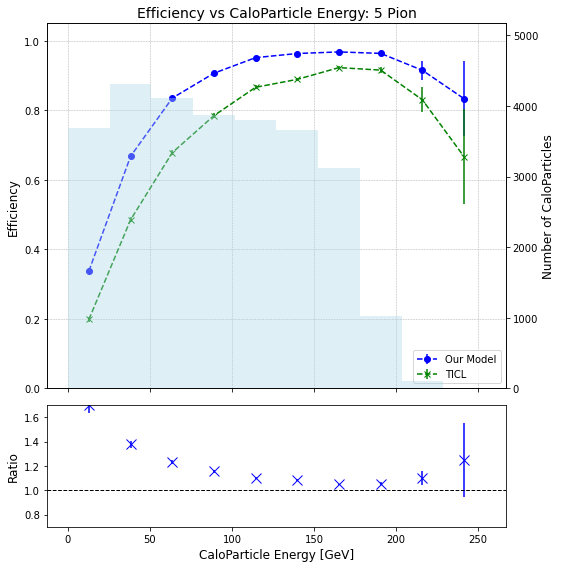

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_CL and df_TICL are your two DataFrames
# Replace the following with your actual data loading mechanism
# df_CL = pd.read_csv('df_CL.csv')
# df_TICL = pd.read_csv('df_TICL.csv')

# ----- Preprocessing -----
# Convert relevant columns to numeric.
for df in [df_CL, df_TICL]:
    df['cp_id'] = pd.to_numeric(df['cp_id'], errors='coerce')
    df['shared_energy'] = pd.to_numeric(df['shared_energy'], errors='coerce')  # New Column
    df['cp_energy'] = pd.to_numeric(df['cp_energy'], errors='coerce')

def prepare_cp_data(df):
    """
    Group the DataFrame by ['event_index', 'cp_id'] so that each caloparticle is counted once.
    For each group:
      - Take the first cp_energy (they are identical).
      - Take the maximum shared_energy to check if any shared_energy >= 50% of cp_energy.
      - Mark the caloparticle as 'reconstructed' if any shared_energy >= 50% of cp_energy.
    """
    grouped = df.groupby(['event_index', 'cp_id']).agg({
        'cp_energy': 'first',          
        'shared_energy': 'max'        # Use max to determine if any shared_energy meets the threshold
    }).reset_index()
    
    # Mark as reconstructed if any shared_energy >= 50% of cp_energy.
    grouped['reco'] = (grouped['shared_energy'] >= 0.5 * grouped['cp_energy']).astype(int)
    return grouped

# Prepare the caloparticle data for both DataFrames.
df_CL_cp = prepare_cp_data(df_CL)
df_TICL_cp = prepare_cp_data(df_TICL)

# ----- Bin Caloparticles by Energy -----
# Define energy bins based on the range of cp_energy from df_CL.
min_energy = df_CL_cp['cp_energy'].min()
max_energy = df_CL_cp['cp_energy'].max()
n_bins = 10
energy_bins = np.linspace(min_energy, max_energy, n_bins + 1)

# Assign each caloparticle to an energy bin.
df_CL_cp['energy_bin'] = pd.cut(df_CL_cp['cp_energy'], bins=energy_bins, labels=False, include_lowest=True)
df_TICL_cp['energy_bin'] = pd.cut(df_TICL_cp['cp_energy'], bins=energy_bins, labels=False, include_lowest=True)

# ----- Calculate Efficiency per Energy Bin -----
def aggregate_efficiency(df):
    """
    For each energy bin, calculate:
      - The total number of caloparticles in the bin.
      - The number of reconstructed caloparticles.
      - Efficiency = (number of reconstructed) / (total number).
    """
    agg = df.groupby('energy_bin').agg(
        total_cp=('cp_energy', 'count'),
        reco_cp=('reco', 'sum')
    ).reset_index()
    agg['efficiency'] = agg['reco_cp'] / agg['total_cp']
    
    agg['eff_error'] = np.sqrt(agg['efficiency'] * (1 - agg['efficiency']) / agg['total_cp'])
    return agg

agg_CL = aggregate_efficiency(df_CL_cp)
agg_TICL = aggregate_efficiency(df_TICL_cp)

# ----- Plot Efficiency vs Energy with Histogram Overlay -----
# Compute bin centers for plotting: average of adjacent bin edges.
bin_centers = (energy_bins[:-1] + energy_bins[1:]) / 2
bar_width = energy_bins[1] - energy_bins[0]

eff_ratio = agg_CL['efficiency'] / agg_TICL['efficiency']
eff_ratio_error = eff_ratio * np.sqrt(
    (agg_CL['eff_error'] / agg_CL['efficiency'])**2 + 
    (agg_TICL['eff_error'] / agg_TICL['efficiency'])**2
)


# Create a figure with two y-axes.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [3, 1]}, sharex=True)


# Plot Efficiency
ax1.errorbar(bin_centers, agg_CL['efficiency'], yerr=agg_CL['eff_error'], marker='o',linestyle ='--',  color='blue', label='Our Model')
ax1.errorbar(bin_centers, agg_TICL['efficiency'], yerr=agg_TICL['eff_error'],   marker='x', linestyle ='--', color='green', label='TICL')
ax1.set_ylabel('Efficiency', fontsize=12)
ax1.set_ylim(0, 1.05)
ax1.legend(loc='lower right', fontsize=10)
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)



# ----- Histogram for Number of CaloParticles -----
ax1_hist = ax1.twinx()  # Create secondary y-axis for histogram
ax1_hist.bar(bin_centers, agg_CL['total_cp'], width=bar_width, color='lightblue', alpha=0.4)
ax1_hist.set_ylabel('Number of CaloParticles', fontsize=12)
ax1_hist.set_ylim(0, agg_CL['total_cp'].max() * 1.2)

# ----- Ratio Plot -----
ax2.errorbar(bin_centers, eff_ratio, yerr=eff_ratio_error, fmt='x', color='blue', markersize=10)
ax2.axhline(1.0, color='black', linestyle='--', linewidth=1)
ax2.set_xlabel('CaloParticle Energy [GeV]', fontsize=12)
ax2.set_ylabel('Ratio', fontsize=12)
ax2.set_ylim(0.7, 1.7)

# Update Title to Reflect New Efficiency Definition
plt.title(r'Efficiency vs CaloParticle Energy: 5 Pion', fontsize=14)
plt.tight_layout()
plt.savefig("plots/efficiency.png")
plt.show()



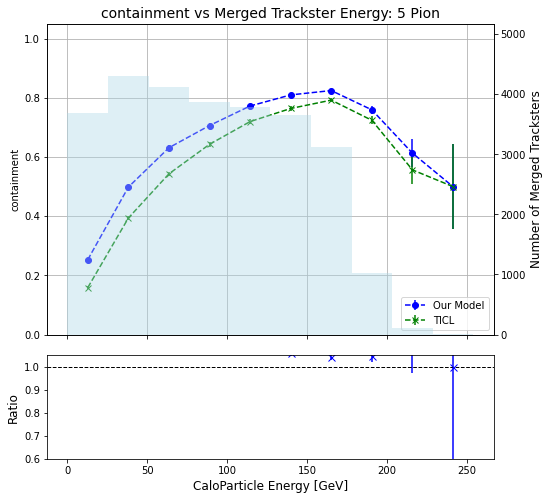

In [15]:

# Convert relevant columns to numeric.
for df in [df_CL, df_TICL]:
    df['cp_id'] = pd.to_numeric(df['cp_id'], errors='coerce')
    df['sim_to_reco_score'] = pd.to_numeric(df['sim_to_reco_score'], errors='coerce')
    df['cp_energy'] = pd.to_numeric(df['cp_energy'], errors='coerce')

# -----------------------------
# Prepare Trackster-Level Data for containment
# -----------------------------
def prepare_cont_data(df):
    """
    Group the DataFrame by ['event_index', 'trackster_id'] so that each trackster is counted once.
    For each group:
      - Take the first cp_energy,
      - Take the minimum reco_to_sim_score,
      - Mark the trackster as 'associated' if the minimum reco_to_sim_score is < 0.2.
    """
    grouped = df.groupby(['event_index', 'cp_id']).agg({
        'cp_energy': 'first',       # Use the first cp_energy value.
        'sim_to_reco_score': 'min'           # Minimum score among the rows for that trackster.
    }).reset_index()
    
    # Mark as associated if reco_to_sim_score is < 0.2.
    grouped['assoc'] = (grouped['sim_to_reco_score'] < 0.2).astype(int)
    return grouped

# Prepare the trackster-level data for both DataFrames.
df_CL_cont = prepare_cont_data(df_CL)
df_TICL_cont   = prepare_cont_data(df_TICL)

# -----------------------------
# Bin Tracksters by Energy
# -----------------------------
# Define energy bins based on the range of cp_energy from df_CL.
min_energy_cont = df_CL_cont['cp_energy'].min()
max_energy_cont = df_CL_cont['cp_energy'].max()
n_bins_cont = 10  # Adjust the number of bins if desired.
energy_bins_cont = np.linspace(min_energy_cont, max_energy_cont, n_bins_cont + 1)

# Assign each trackster to an energy bin.
df_CL_cont['energy_bin'] = pd.cut(df_CL_cont['cp_energy'],
                                    bins=energy_bins_cont, labels=False, include_lowest=True)
df_TICL_cont['energy_bin']   = pd.cut(df_TICL_cont['cp_energy'],
                                    bins=energy_bins_cont, labels=False, include_lowest=True)

# -----------------------------
# Calculate containment per Energy Bin
# -----------------------------
def aggregate_containment(df):
    """
    For each energy bin, calculate:
      - Total number of tracksters,
      - Number of associated tracksters (with reco_to_sim_score < 0.2),
      - containment = (number of associated tracksters) / (total number).
    """
    agg = df.groupby('energy_bin').agg(
        total_cont = ('cp_energy', 'count'),
        assoc_cont = ('assoc', 'sum')
    ).reset_index()
    agg['containment'] = agg['assoc_cont'] / agg['total_cont']
    
    agg['containment_error'] = np.sqrt(agg['containment'] * (1 - agg['containment']) / agg['total_cont'])
    return agg

agg_CL_cont = aggregate_containment(df_CL_cont)
agg_TICL_cont   = aggregate_containment(df_TICL_cont)

# Reindex both aggregated DataFrames so that they have one row per energy bin (0 to n_bins_cont-1)
agg_CL_cont = agg_CL_cont.set_index('energy_bin').reindex(range(n_bins_cont), fill_value=np.nan).reset_index()
agg_TICL_cont   = agg_TICL_cont.set_index('energy_bin').reindex(range(n_bins_cont), fill_value=np.nan).reset_index()

# -----------------------------
# Plot containment vs Trackster Energy with Histogram Overlay
# -----------------------------
# Compute bin centers for plotting: average of adjacent bin edges.
bin_centers_cont = (energy_bins_cont[:-1] + energy_bins_cont[1:]) / 2
bar_width_cont = energy_bins_cont[1] - energy_bins_cont[0]

containment_ratio = agg_CL_cont['containment'] / agg_TICL_cont['containment']
containment_ratio_error = containment_ratio * np.sqrt(
    (agg_CL_cont['containment_error'] / agg_CL_cont['containment'])**2 +
    (agg_TICL_cont['containment_error'] / agg_TICL_cont['containment'])**2
)

# Create a figure with two y-axes.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [3, 1]}, sharex=True)

plt.subplots_adjust(hspace=0.1)  # Set spacing to zero

# Plot containment curves on the primary y-axis.
ax1.errorbar(bin_centers_cont, agg_CL_cont['containment'], yerr=agg_CL_cont['containment_error'], marker='o', linestyle='--', color = 'blue', label='Our Model')
ax1.errorbar(bin_centers_cont, agg_TICL_cont['containment'], yerr = agg_TICL_cont['containment_error'], marker='x', linestyle='--', color = 'green', label='TICL')
ax1.set_ylabel('containment')
ax1.set_ylim(0, 1.05)
ax1.legend(loc='lower right')
ax1.grid(True)

# Plot histogram (trackster count per energy bin) on the secondary y-axis.
ax1_hist = ax1.twinx()  # Create secondary y-axis for histogram
ax1_hist.bar(bin_centers_cont, agg_CL_cont['total_cont'], width=bar_width_cont, color='lightblue', alpha=0.4)
ax1_hist.set_ylabel('Number of Merged Tracksters', fontsize=12)
ax1_hist.set_ylim(0, agg_CL_cont['total_cont'].max() * 1.2)

ax2.errorbar(bin_centers_cont, containment_ratio, yerr=containment_ratio_error, fmt='x', color='blue', markersize=7)
ax2.axhline(1.0, color='black', linestyle='--', linewidth=1)
ax2.set_xlabel('CaloParticle Energy [GeV]', fontsize=12)
ax2.set_ylabel('Ratio', fontsize=12)
ax2.set_ylim(0.6, 1.05)

plt.title(r'containment vs Merged Trackster Energy: 5 Pion', fontsize=14)
plt.savefig("plots/containment.png")
plt.show()

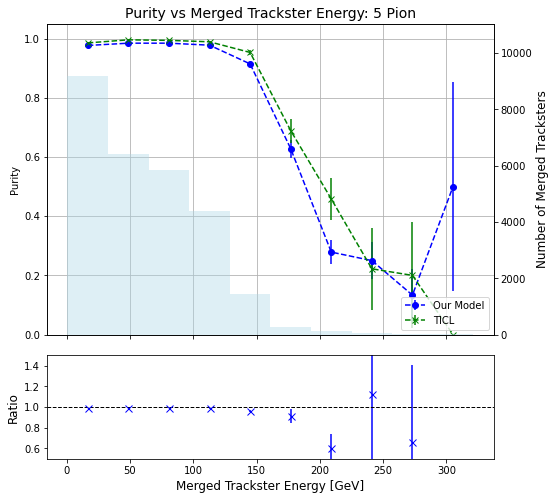

In [46]:

# Convert relevant columns to numeric.
for df in [df_CL, df_TICL]:
    df['trackster_id'] = pd.to_numeric(df['trackster_id'], errors='coerce')
    df['reco_to_sim_score'] = pd.to_numeric(df['reco_to_sim_score'], errors='coerce')
    df['trackster_energy'] = pd.to_numeric(df['trackster_energy'], errors='coerce')

# -----------------------------
# Prepare Trackster-Level Data for Purity
# -----------------------------
def prepare_trackster_data(df):
    """
    Group the DataFrame by ['event_index', 'trackster_id'] so that each trackster is counted once.
    For each group:
      - Take the first trackster_energy,
      - Take the minimum reco_to_sim_score,
      - Mark the trackster as 'associated' if the minimum reco_to_sim_score is < 0.2.
    """
    grouped = df.groupby(['event_index', 'trackster_id']).agg({
        'trackster_energy': 'first',       # Use the first trackster_energy value.
        'reco_to_sim_score': 'min'           # Minimum score among the rows for that trackster.
    }).reset_index()
    
    # Mark as associated if reco_to_sim_score is < 0.2.
    grouped['assoc'] = (grouped['reco_to_sim_score'] < 0.2).astype(int)
    return grouped

# Prepare the trackster-level data for both DataFrames.
df_CL_ts = prepare_trackster_data(df_CL)
df_TICL_ts   = prepare_trackster_data(df_TICL)

# -----------------------------
# Bin Tracksters by Energy
# -----------------------------
# Define energy bins based on the range of trackster_energy from df_CL.
min_energy_ts = df_CL_ts['trackster_energy'].min()
max_energy_ts = df_CL_ts['trackster_energy'].max()
n_bins_ts = 10  # Adjust the number of bins if desired.
energy_bins_ts = np.linspace(min_energy_ts, max_energy_ts, n_bins_ts + 1)

# Assign each trackster to an energy bin.
df_CL_ts['energy_bin'] = pd.cut(df_CL_ts['trackster_energy'],
                                    bins=energy_bins_ts, labels=False, include_lowest=True)
df_TICL_ts['energy_bin']   = pd.cut(df_TICL_ts['trackster_energy'],
                                    bins=energy_bins_ts, labels=False, include_lowest=True)

# -----------------------------
# Calculate Purity per Energy Bin
# -----------------------------
def aggregate_purity(df):
    """
    For each energy bin, calculate:
      - Total number of tracksters,
      - Number of associated tracksters (with reco_to_sim_score < 0.2),
      - Purity = (number of associated tracksters) / (total number).
    """
    agg = df.groupby('energy_bin').agg(
        total_ts = ('trackster_energy', 'count'),
        assoc_ts = ('assoc', 'sum')
    ).reset_index()
    agg['purity'] = agg['assoc_ts'] / agg['total_ts']
    
    agg['purity_error'] = np.sqrt(agg['purity'] * (1 - agg['purity']) / agg['total_ts'])
    return agg

agg_CL_ts = aggregate_purity(df_CL_ts)
agg_TICL_ts   = aggregate_purity(df_TICL_ts)

# Reindex both aggregated DataFrames so that they have one row per energy bin (0 to n_bins_ts-1)
agg_CL_ts = agg_CL_ts.set_index('energy_bin').reindex(range(n_bins_ts), fill_value=np.nan).reset_index()
agg_TICL_ts   = agg_TICL_ts.set_index('energy_bin').reindex(range(n_bins_ts), fill_value=np.nan).reset_index()

# -----------------------------
# Plot Purity vs Trackster Energy with Histogram Overlay
# -----------------------------
# Compute bin centers for plotting: average of adjacent bin edges.
bin_centers_ts = (energy_bins_ts[:-1] + energy_bins_ts[1:]) / 2
bar_width_ts = energy_bins_ts[1] - energy_bins_ts[0]

purity_ratio = agg_CL_ts['purity'] / agg_TICL_ts['purity']
purity_ratio_error = purity_ratio * np.sqrt(
    (agg_CL_ts['purity_error'] / agg_CL_ts['purity'])**2 +
    (agg_TICL_ts['purity_error'] / agg_TICL_ts['purity'])**2
)

# Create a figure with two y-axes.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [3, 1]}, sharex=True)

plt.subplots_adjust(hspace=0.1)  # Set spacing to zero

# Plot purity curves on the primary y-axis.
ax1.errorbar(bin_centers_ts, agg_CL_ts['purity'], yerr=agg_CL_ts['purity_error'], marker='o', linestyle='--', color = 'blue', label='Our Model')
ax1.errorbar(bin_centers_ts, agg_TICL_ts['purity'], yerr = agg_TICL_ts['purity_error'], marker='x', linestyle='--', color = 'green', label='TICL')
ax1.set_ylabel('Purity')
ax1.set_ylim(0, 1.05)
ax1.legend(loc='lower right')
ax1.grid(True)

# Plot histogram (trackster count per energy bin) on the secondary y-axis.
ax1_hist = ax1.twinx()  # Create secondary y-axis for histogram
ax1_hist.bar(bin_centers_ts, agg_CL_ts['total_ts'], width=bar_width_ts, color='lightblue', alpha=0.4)
ax1_hist.set_ylabel('Number of Merged Tracksters', fontsize=12)
ax1_hist.set_ylim(0, agg_CL_ts['total_ts'].max() * 1.2)

ax2.errorbar(bin_centers_ts, purity_ratio, yerr=purity_ratio_error, fmt='x', color='blue', markersize=7)
ax2.axhline(1.0, color='black', linestyle='--', linewidth=1)
ax2.set_xlabel('Merged Trackster Energy [GeV]', fontsize=12)
ax2.set_ylabel('Ratio', fontsize=12)
ax2.set_ylim(0.5, 1.5)

plt.title(r'Purity vs Merged Trackster Energy: 5 Pion', fontsize=14)
plt.savefig("plots/purity.png")
plt.show()

In [ ]:
df_CL

In [ ]:
df_CL_best

# Response and Resolution

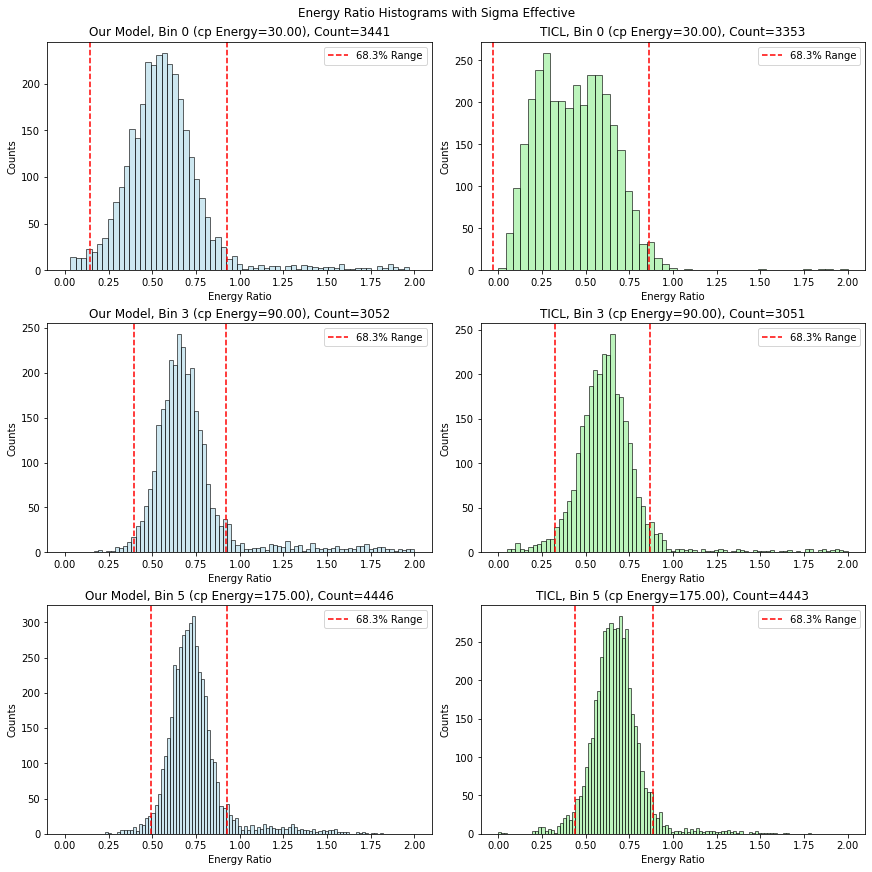

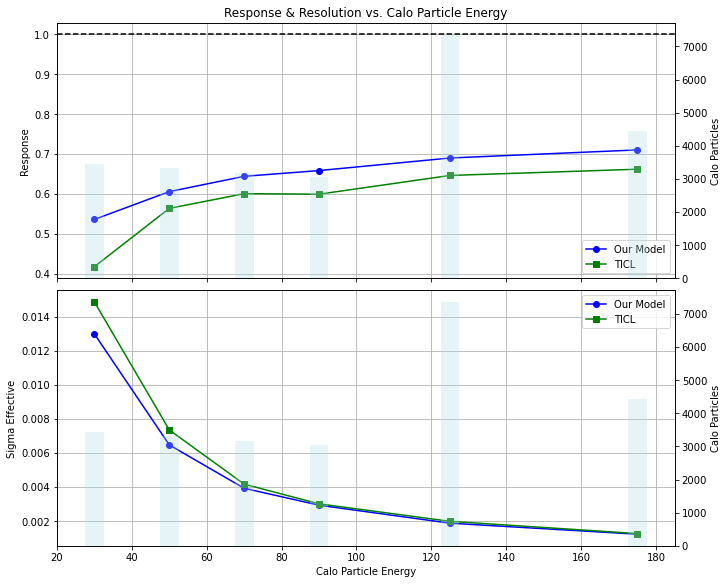

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ====================================================
# 1. Preprocessing and Association Selection for Calo Particles
# ====================================================
def process_cp_dataframe(df):
    df = df.copy()
    for col in ['cp_id', 'sim_to_reco_score', 'reco_to_sim_score', 'cp_energy', 'energy_ratio']:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    df_cp = df[df['sim_to_reco_score'] < 1]
    df_cp = df_cp.loc[df_cp.groupby(['event_index', 'cp_id'])['shared_energy'].idxmax()].reset_index(drop=True)
    return df_cp

df_CL_cp = process_cp_dataframe(df_CL)
df_TICL_cp = process_cp_dataframe(df_TICL)

# ====================================================
# 2. Binning by Calo Particle Energy (cp_energy)
# ====================================================
energy_bins = np.array([20, 40, 60, 80, 100, 150, 200])  # Manually defined bins
bin_centers = (energy_bins[:-1] + energy_bins[1:]) / 2  # Compute bin centers

df_CL_cp['energy_bin'] = np.digitize(df_CL_cp['cp_energy'], bins=energy_bins, right=True) - 1
df_TICL_cp['energy_bin'] = np.digitize(df_TICL_cp['cp_energy'], bins=energy_bins, right=True) - 1

# ====================================================
# 3. Compute Sigma Effective in Each Energy Bin
# ====================================================
def compute_sigma_effective(df, num_bins):
    fitted_mean, sigma_eff, counts = [], [], []
    
    for b in range(num_bins):
        bin_data = df.loc[df['energy_bin'] == b, 'energy_ratio'].dropna()
        counts.append(len(bin_data))
        
        sorted_data = np.sort(bin_data)
        n_points = len(sorted_data)
        
        if n_points > 0:
            window_size = int(0.683 * n_points)
            min_width = np.inf
            best_range = (None, None)
            
            for i in range(n_points - window_size):
                width = sorted_data[i + window_size] - sorted_data[i]
                if width < min_width:
                    min_width = width
                    best_range = (sorted_data[i], sorted_data[i + window_size])
                    
            mu_eff = (best_range[0] + best_range[1]) / 2
            sigma_eff_val = (best_range[1] - best_range[0])
        else:
            mu_eff, sigma_eff_val = np.nan, np.nan
        
        fitted_mean.append(mu_eff)
        sigma_eff.append(sigma_eff_val)
    
    return np.array(fitted_mean), np.array(sigma_eff), np.array(counts)

n_bins = len(energy_bins) - 1  # Update number of bins
fitted_mean_CL, sigma_eff_CL, counts_CL = compute_sigma_effective(df_CL_cp, n_bins)
fitted_mean_TICL, sigma_eff_TICL, counts_TICL = compute_sigma_effective(df_TICL_cp, n_bins)

# ====================================================
# 4. Plot Histograms with Sigma Effective
# ====================================================
selected_bins = [0, n_bins // 2, n_bins - 1]
fig_hist, axs = plt.subplots(len(selected_bins), 2, figsize=(12, 4 * len(selected_bins)), constrained_layout=True)

for i, b in enumerate(selected_bins):
    for j, (df, mean, sigma, label, color, ax) in enumerate(zip(
            [df_CL_cp, df_TICL_cp],
            [fitted_mean_CL, fitted_mean_TICL],
            [sigma_eff_CL, sigma_eff_TICL],
            ['Our Model', 'TICL'],
            ['lightblue', 'lightgreen'],
            axs[i] if len(selected_bins) > 1 else [axs])):
        
        data = df.loc[df['energy_bin'] == b, 'energy_ratio'].dropna()
        n, bins, _ = ax.hist(data, bins='auto', range=(0, 2), color=color, alpha=0.6, edgecolor='k')
        
        ax.axvline(mean[b] - sigma[b], color='r', linestyle='--', label=f'68.3% Range')
        ax.axvline(mean[b] + sigma[b], color='r', linestyle='--')
        
        ax.set_title(f'{label}, Bin {b} (cp Energy={bin_centers[b]:.2f}), Count={len(data)}')
        ax.set_xlabel('Energy Ratio')
        ax.set_ylabel('Counts')
        ax.legend()

plt.suptitle('Energy Ratio Histograms with Sigma Effective')
plt.show()

# ====================================================
# 5. Plot Response and Resolution vs. cp Energy Bin Centers
# ====================================================
fig_params, (ax_resp, ax_res) = plt.subplots(2, 1, figsize=(10, 8), sharex=True, constrained_layout=True)

ax_resp.plot(bin_centers, fitted_mean_CL, 'bo-', label='Our Model')
ax_resp.plot(bin_centers, fitted_mean_TICL, 'gs-', label='TICL')
ax_resp.axhline(1, color='k', linestyle='--')
ax_resp.set_ylabel('Response')
ax_resp.set_title('Response & Resolution vs. Calo Particle Energy')
ax_resp.legend()
ax_resp.grid()

ax_resp2 = ax_resp.twinx()
ax_resp2.bar(bin_centers, counts_CL, width=5, color='lightblue', alpha=0.3)
ax_resp2.set_ylabel('Calo Particles')

ax_res.plot(bin_centers, sigma_eff_CL / bin_centers, 'bo-', label='Our Model')
ax_res.plot(bin_centers, sigma_eff_TICL / bin_centers, 'gs-', label='TICL')
ax_res.set_xlabel('Calo Particle Energy')
ax_res.set_ylabel('Sigma Effective')
ax_res.legend()
ax_res.grid()

ax_res2 = ax_res.twinx()
ax_res2.bar(bin_centers, counts_CL, width=5, color='lightblue', alpha=0.3)
ax_res2.set_ylabel('Calo Particles')

plt.show()


# NExt

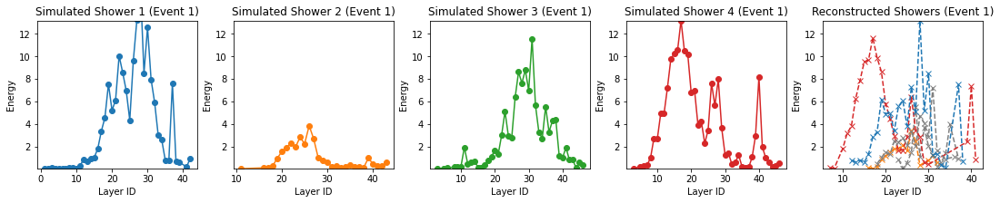

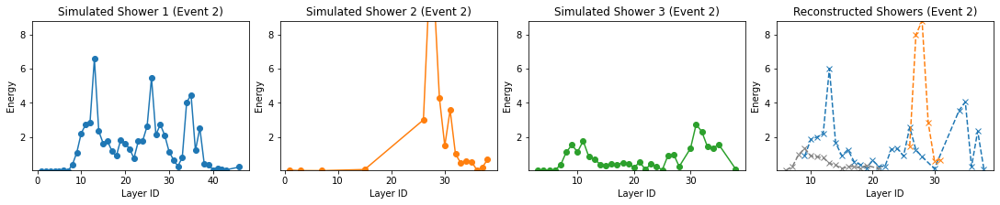

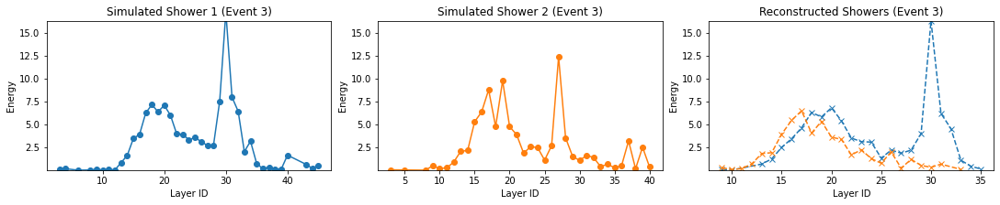

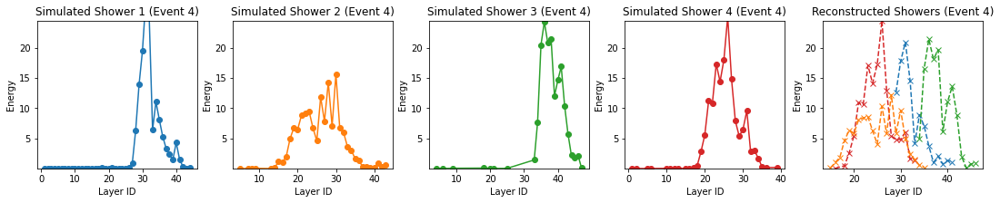

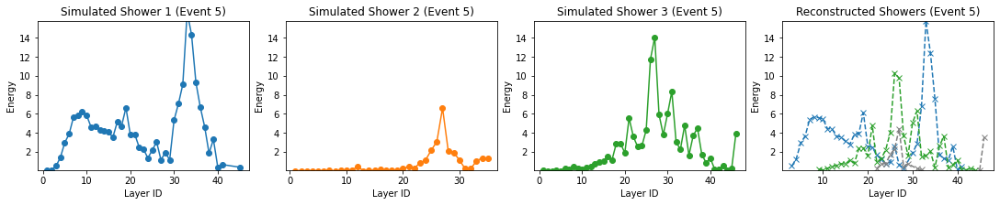

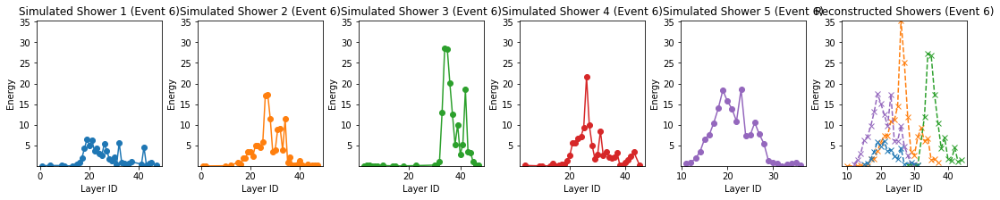

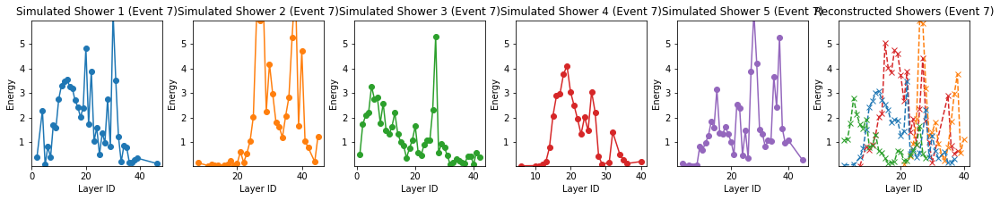

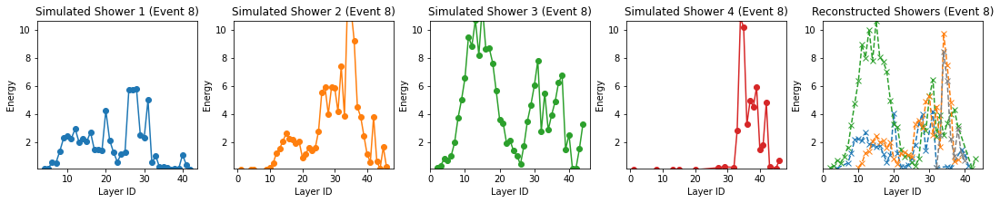

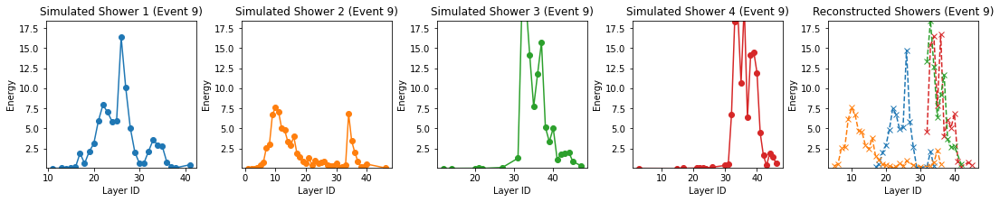

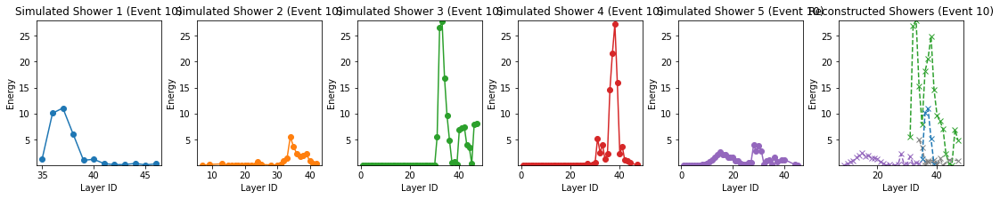

In [42]:
# Plotting longitudinal energy profiles of both simulated and reconstructed showers along with associated pairs.

import matplotlib.colors as mcolors

layer = data_file['clusters;4']['cluster_layer_id'].array()

def calculate_all_event_profile_data(GT_ind, energies, recon_ind, layer, multi, num_events=10):
    # Define unique colors for caloparticles
    colors = list(mcolors.TABLEAU_COLORS.values())

    # Loop over all events
    for event_index in range(num_events):
        # Get data for the current event
        caloparticles = GT_ind[event_index]  # Indices for all CaloParticles in the event
        tracksters = recon_ind[event_index]  # Indices for all ReconstructedTracksters in the event
        event_energies = energies[event_index]  # Energies for this event
        event_layer_id = layer[event_index]
        event_multi = multi[event_index]

        # Initialize lists for profiles and associations
        simulated_profiles = []
        reconstructed_profiles = []
        associations = {}  # To store caloparticle-trackster associations

        # Simulated particle shower
        for cp_idx, caloparticle in enumerate(caloparticles):
            cp_lc_layer_id = event_layer_id[caloparticle]
            cp_lc_energies = event_energies[caloparticle] / event_multi[cp_idx]
            df_cp = pd.DataFrame({'energy': cp_lc_energies, 'layer_id': cp_lc_layer_id})
            layer_energy_cp = df_cp.groupby('layer_id')['energy'].sum().reset_index()
            simulated_profiles.append(layer_energy_cp)

        # Reconstructed particle shower
        for trackster in tracksters:
            tst_lc_layer_id = event_layer_id[trackster]
            tst_lc_energies = event_energies[trackster]
            df_tst = pd.DataFrame({'energy': tst_lc_energies, 'layer_id': tst_lc_layer_id})
            layer_energy_tst = df_tst.groupby('layer_id')['energy'].sum().reset_index()
            reconstructed_profiles.append(layer_energy_tst)

        # Calculate sim_to_reco score and determine associations


        for calo_idx, caloparticle in enumerate(caloparticles):
            Calo_multi = event_multi[calo_idx]
            cp_energy = np.sum(event_energies[caloparticle] / Calo_multi)
            
            # Loop over all Tracksters
            max_shared_energy = 0.0
            best_tst_idx = None
            
            for trackster_idx, trackster in enumerate(tracksters):
                # Calculate sim-to-reco score
                
                
                shared_det_ids = set(calo_det_id for calo_det_id in caloparticle).intersection(set(trackster))
                if not shared_det_ids:
                    continue  # No shared det_ids

                # Calculate shared_energy
                shared_energy = np.sum(event_energies[list(shared_det_ids)])

                # Check if shared_energy meets the threshold
                if shared_energy >= 0.5 * cp_energy and shared_energy > max_shared_energy:
                    max_shared_energy = shared_energy
                    best_tst_idx = trackster_idx

            if best_tst_idx is not None:
                associations[calo_idx] = best_tst_idx
                    
        
        
        # Determine energy range from reconstructed showers for consistent y-axis
        min_energy = min(profile['energy'].min() for profile in reconstructed_profiles)
        max_energy = max(profile['energy'].max() for profile in reconstructed_profiles)
    
    
        # Plot simulated profiles
        fig, axes = plt.subplots(1, len(simulated_profiles) + 1, figsize=(15, 3), constrained_layout=True)

        for idx, profile in enumerate(simulated_profiles):
            ax = axes[idx]
            ax.plot(profile['layer_id'], profile['energy'], marker='o', linestyle='-', color=colors[idx % len(colors)])
            ax.set_ylim(min_energy, max_energy)
            ax.set_title(f'Simulated Shower {idx + 1} (Event {event_index + 1})')
            ax.set_xlabel('Layer ID')
            ax.set_ylabel('Energy')

        # Plot all reconstructed profiles in a single plot
        ax = axes[-1]
        for idx, profile in enumerate(reconstructed_profiles):
            # Determine color based on association
            associated_cp = [cp_idx for cp_idx, tst_idx in associations.items() if tst_idx == idx]
            color = colors[associated_cp[0] % len(colors)] if associated_cp else 'gray'
            ax.plot(profile['layer_id'], profile['energy'], marker='x', linestyle='--', color=color)
        ax.set_ylim(min_energy, max_energy)
        ax.set_title(f'Reconstructed Showers (Event {event_index + 1})')
        ax.set_xlabel('Layer ID')
        ax.set_ylabel('Energy')

        # Show the plots
        plt.show()

events_ours = calculate_all_event_profile_data(GT_ind, energies, recon_ind, layer, GT_mult)


In [ ]:
events_TICL = calculate_all_event_profile_data(GT_ind_filt, energies, MT_ind_filt, layer, GT_mult_filt)

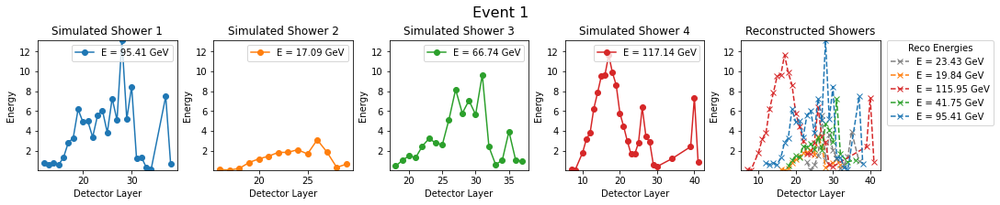

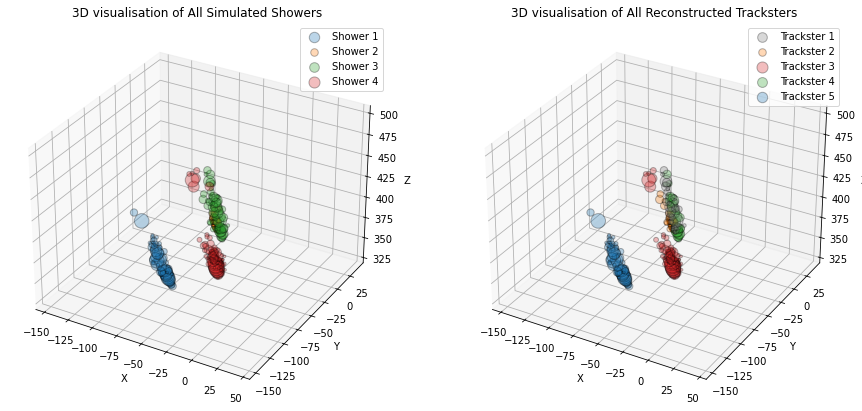

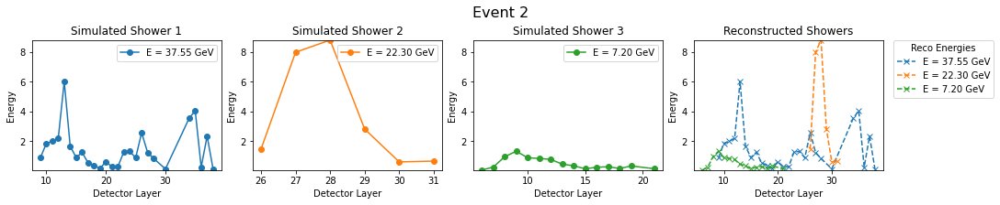

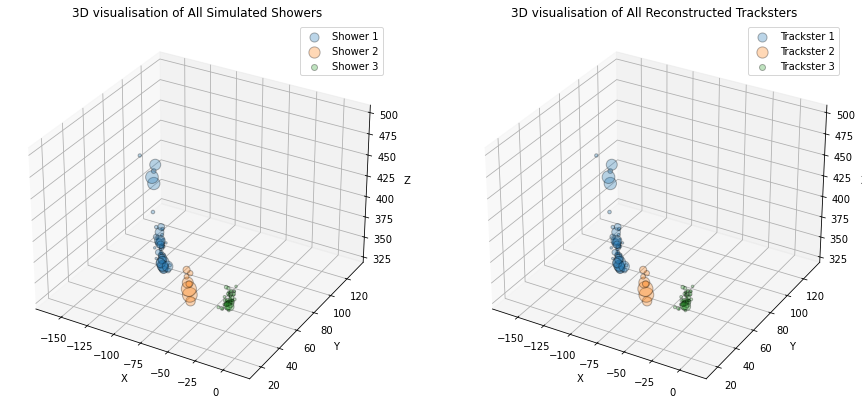

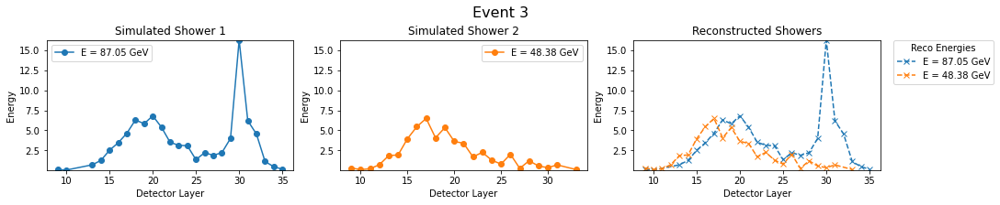

...

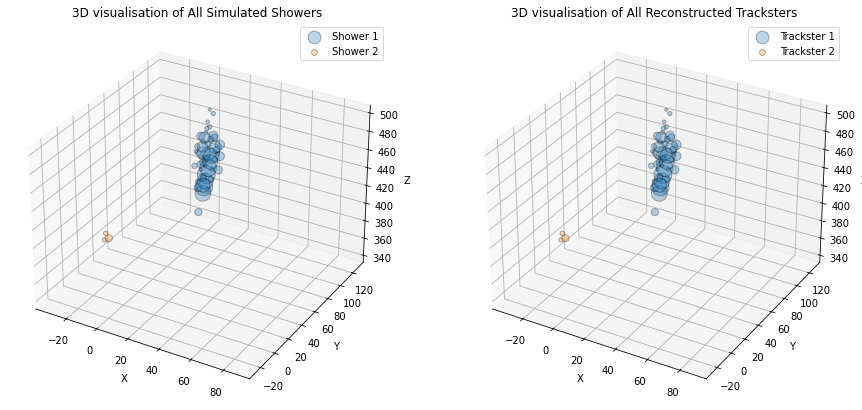

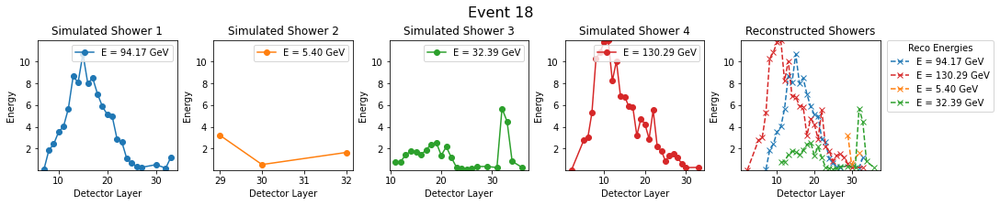

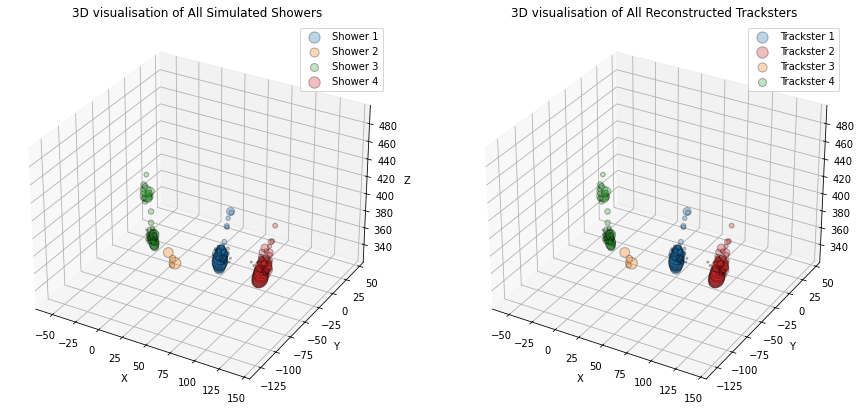

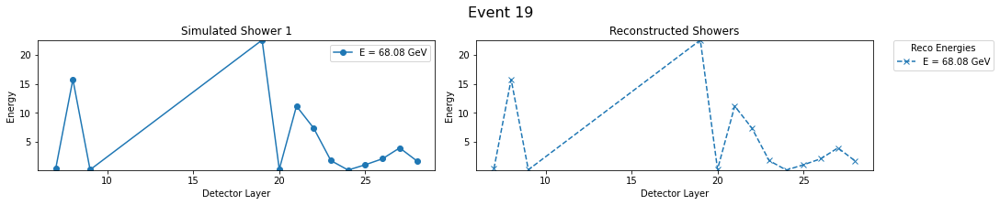

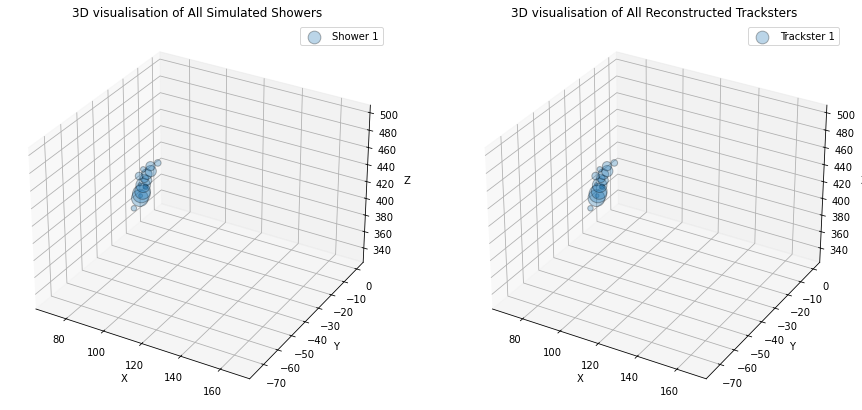

ValueError: in NumpyArray attempting to get 206, index out of range

(https://github.com/scikit-hep/awkward-1.0/blob/1.10.3/src/cpu-kernels/awkward_regularize_arrayslice.cpp#L14)

In [43]:
# Plotting longitudinal energy profiles of both simulated and reconstructed showers along with associated pairs.

import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D

# Define LC_x, LC_y, LC_z somewhere or import if needed.
# For example purposes, assume they are defined globally.

def calculate_all_event_profile_data(GT_ind, energies, recon_ind, layer, multi, num_events=5):
    # Define unique colors (using Tableau colors)
    colors = list(mcolors.TABLEAU_COLORS.values())

    # Loop over all events
    for event_index in range(num_events):
        # Get data for the current event
        caloparticles = GT_ind[event_index]  # Indices for all CaloParticles in the event
        tracksters = recon_ind[event_index]  # Indices for all ReconstructedTracksters in the event
        event_energies = energies[event_index]  # Energies for this event
        event_layer_id = layer[event_index]
        event_multi = multi[event_index]
        event_LC_x = LC_x[event_index]
        event_LC_y = LC_y[event_index]
        event_LC_z = LC_z[event_index]

        # Initialize lists for profiles and associations
        simulated_profiles = []
        reconstructed_profiles = []
        associations = {}  # To store caloparticle-trackster associations
        cp_lc_pos_all = []
        cp_lc_energies_all = []
        tst_lc_pos_all = []
        tst_lc_energies_all = []
        total_cp_energies = []
        total_tst_energies = []

        # --- Simulated particle shower ---
        for cp_idx, caloparticle in enumerate(caloparticles):
            cp_lc_layer_id = event_layer_id[caloparticle]
            # Divide energy by multi (assume event_multi[cp_idx] corresponds to this caloparticle)
            cp_lc_energies = event_energies[caloparticle] / event_multi[cp_idx]
            df_cp = pd.DataFrame({'energy': cp_lc_energies, 'layer_id': cp_lc_layer_id})
            layer_energy_cp = df_cp.groupby('layer_id')['energy'].sum().reset_index()
            simulated_profiles.append(layer_energy_cp)
            
            cp_lc_pos_all.append([event_LC_x[caloparticle], event_LC_y[caloparticle], event_LC_z[caloparticle]])
            cp_lc_energies_all.append(cp_lc_energies)
            total_cp_energies.append(layer_energy_cp['energy'].sum())

        # Build a dedicated color map for simulated showers
        cp_color_map = {cp_idx: colors[cp_idx % len(colors)] for cp_idx in range(len(simulated_profiles))}

        # --- Reconstructed particle shower ---
        for trackster in tracksters:
            tst_lc_layer_id = event_layer_id[trackster]
            tst_lc_energies = event_energies[trackster]
            df_tst = pd.DataFrame({'energy': tst_lc_energies, 'layer_id': tst_lc_layer_id})
            layer_energy_tst = df_tst.groupby('layer_id')['energy'].sum().reset_index()
            reconstructed_profiles.append(layer_energy_tst)
            
            tst_lc_pos_all.append([event_LC_x[trackster], event_LC_y[trackster], event_LC_z[trackster]])
            tst_lc_energies_all.append(tst_lc_energies)
            total_tst_energy = np.sum(tst_lc_energies)
            total_tst_energies.append(layer_energy_tst['energy'].sum())

        # --- Calculate sim_to_reco score and determine associations ---
        for calo_idx, caloparticle in enumerate(caloparticles):
            # Use corresponding multiplicity for this calo particle
            Calo_multi = event_multi[calo_idx]
            calo_det_ids = set(calo_id for calo_id in caloparticle)
            cp_energy = np.sum(event_energies[caloparticle] / Calo_multi)
            
            max_shared_energy = 0.0
            best_tst_idx = None
            trackster_det_id_sets = [set(trackster) for trackster in tracksters]
            # Loop over all Tracksters
            for trackster_idx, trackster in enumerate(tracksters):
                      
                trackster_det_ids = trackster_det_id_sets[trackster_idx]
                shared_det_ids = calo_det_ids.intersection(trackster_det_ids)

                if not shared_det_ids:
                    continue  # No shared detector IDs
                
                
                # Calculate shared_energy by summing energies of shared det_ids
                shared_indices = [i for i, calo_id in enumerate(calo_det_ids) if calo_id in shared_det_ids]
                Calo_multi_shared_indices = Calo_multi[shared_indices]
                
                shared_energy = np.sum(event_energies[list(shared_det_ids)] / Calo_multi_shared_indices) if shared_det_ids else 0.0
                

                # Check if shared_energy meets the threshold
                if shared_energy >= 0.5 * cp_energy and shared_energy > max_shared_energy:
                    max_shared_energy = shared_energy
                    best_tst_idx = trackster_idx
                    
            if best_tst_idx is not None:
                associations[calo_idx] = best_tst_idx

        # --- Determine energy range from reconstructed showers for consistent y-axis ---
        # (if there is at least one reconstructed profile)
        if reconstructed_profiles:
            min_energy = min(profile['energy'].min() for profile in reconstructed_profiles)
            max_energy = max(profile['energy'].max() for profile in reconstructed_profiles)
        else:
            min_energy, max_energy = 0, 1

        # --- Plot simulated profiles (2D) ---
        fig, axes = plt.subplots(1, len(simulated_profiles) + 1, figsize=(15, 3), constrained_layout=True)
        fig.suptitle(f'Event {event_index + 1}', fontsize=16)

        for idx, profile in enumerate(simulated_profiles):
            ax = axes[idx]
            ax.plot(profile['layer_id'], profile['energy'],
                    marker='o', linestyle='-', color=cp_color_map[idx],
                    label=f"E = {total_cp_energies[idx]:.2f} GeV")
            ax.set_ylim(min_energy, max_energy)
            ax.set_title(f'Simulated Shower {idx + 1}')
            ax.set_xlabel('Detector Layer')
            ax.set_ylabel('Energy')
            ax.legend()

        # --- Plot all reconstructed profiles in a single 2D plot ---
        ax = axes[-1]
        for idx, profile in enumerate(reconstructed_profiles):
            # Look up the corresponding calo (if any) using associations
            associated_cp = [cp_idx for cp_idx, tst_idx in associations.items() if tst_idx == idx]
            # Use the simulated shower color if there is an association; otherwise, default to gray
            color = cp_color_map[associated_cp[0]] if associated_cp else 'gray'
            ax.plot(profile['layer_id'], profile['energy'],
                    marker='x', linestyle='--', color=color,
                    label=f"E = {total_tst_energies[idx]:.2f} GeV")
            
        ax.set_ylim(min_energy, max_energy)
        ax.set_title('Reconstructed Showers')
        ax.set_xlabel('Detector Layer')
        ax.set_ylabel('Energy')
        ax.legend(title='Reco Energies', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

        # --- Determine global energy scale and axis limits for 3D plots ---
        all_energies = np.concatenate(cp_lc_energies_all + tst_lc_energies_all)
        global_min_energy, global_max_energy = np.min(all_energies), np.max(all_energies)
        x_lim = [min(event_LC_x), max(event_LC_x)]
        y_lim = [min(event_LC_y), max(event_LC_y)]
        z_lim = [min(event_LC_z), max(event_LC_z)]

        # --- 3D Scatter Plot for All Simulated Layer Clusters ---
        fig3d = plt.figure(figsize=(15, 7))
        ax_3d = fig3d.add_subplot(1, 2, 1, projection='3d')
        for idx, (pos, energies_) in enumerate(zip(cp_lc_pos_all, cp_lc_energies_all)):
            x, y, z = pos
            sizes = np.log1p(np.array(energies_)) * 100  # Scale sizes for visibility
            ax_3d.scatter(x, y, z, c=cp_color_map[idx], alpha=0.3, s=sizes, edgecolors='k', label=f'Shower {idx+1}')
        
        ax_3d.set_xlim(x_lim)
        ax_3d.set_ylim(y_lim)
        ax_3d.set_zlim(z_lim)
        ax_3d.set_title('3D visualisation of All Simulated Showers')
        ax_3d.set_xlabel('X')
        ax_3d.set_ylabel('Y')
        ax_3d.set_zlabel('Z')
        ax_3d.legend()

        # --- 3D Scatter Plot for All Reconstructed Tracksters ---
        ax_3d_reco = fig3d.add_subplot(1, 2, 2, projection='3d')
        for idx, (pos, energies_) in enumerate(zip(tst_lc_pos_all, tst_lc_energies_all)):
            x, y, z = pos
            sizes = np.log1p(np.array(energies_)) * 100  # Scale sizes for visibility
            # Look up association for the trackster to decide its color
            associated_cp = [cp_idx for cp_idx, tst_idx in associations.items() if tst_idx == idx]
            color = cp_color_map[associated_cp[0]] if associated_cp else 'gray'
            ax_3d_reco.scatter(x, y, z, c=color, alpha=0.3, s=sizes, edgecolors='k', label=f'Trackster {idx+1}')
        
        ax_3d_reco.set_xlim(x_lim)
        ax_3d_reco.set_ylim(y_lim)
        ax_3d_reco.set_zlim(z_lim)
        ax_3d_reco.set_title('3D visualisation of All Reconstructed Tracksters')
        ax_3d_reco.set_xlabel('X')
        ax_3d_reco.set_ylabel('Y')
        ax_3d_reco.set_zlabel('Z')
        ax_3d_reco.legend()

        plt.show()

        

events = calculate_all_event_profile_data(GT_ind_filt, energies, recon_ind, layer, GT_mult_filt, num_events = 20)

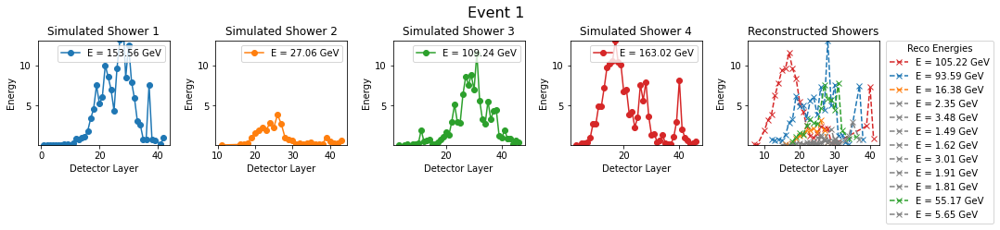

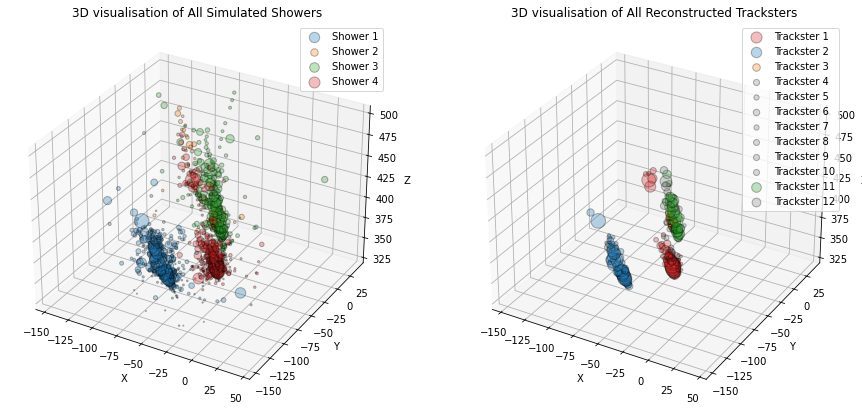

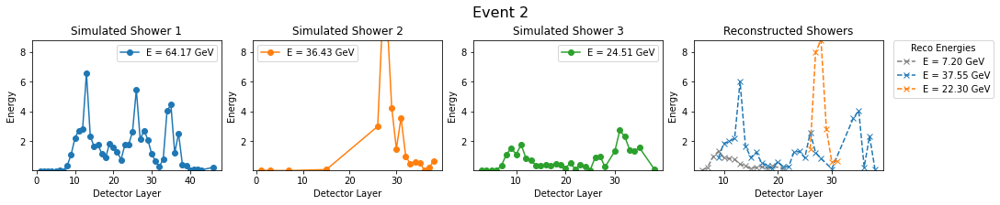

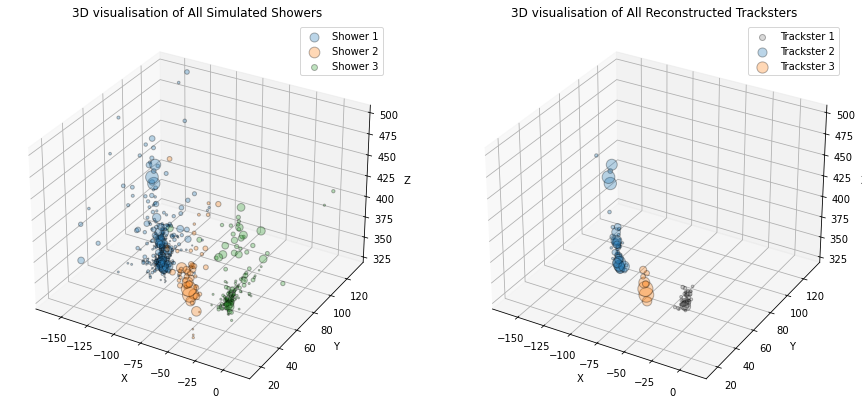

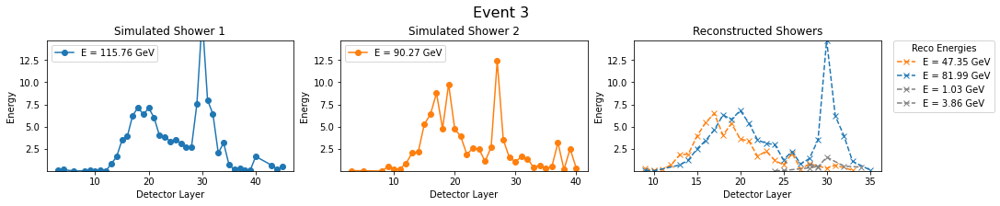

...

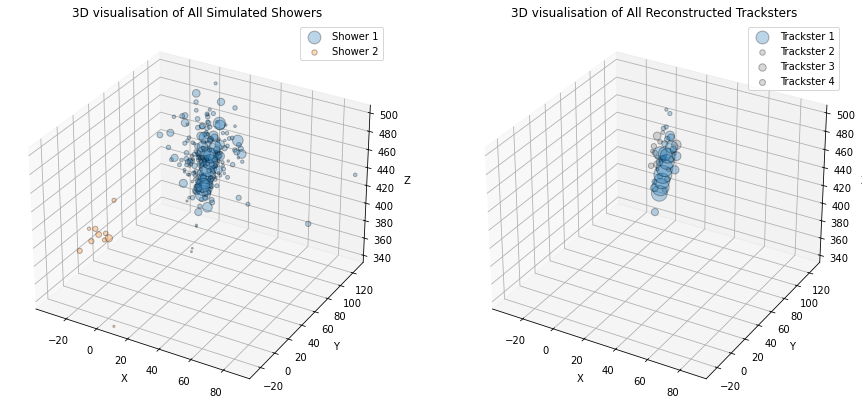

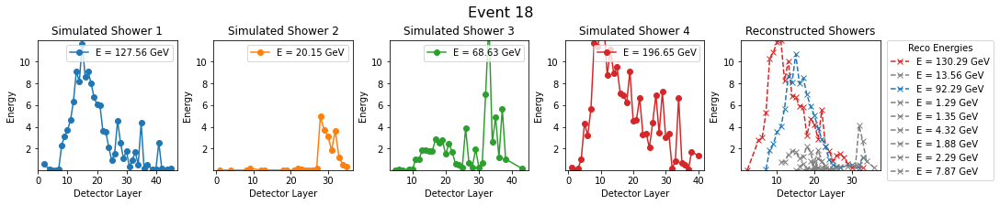

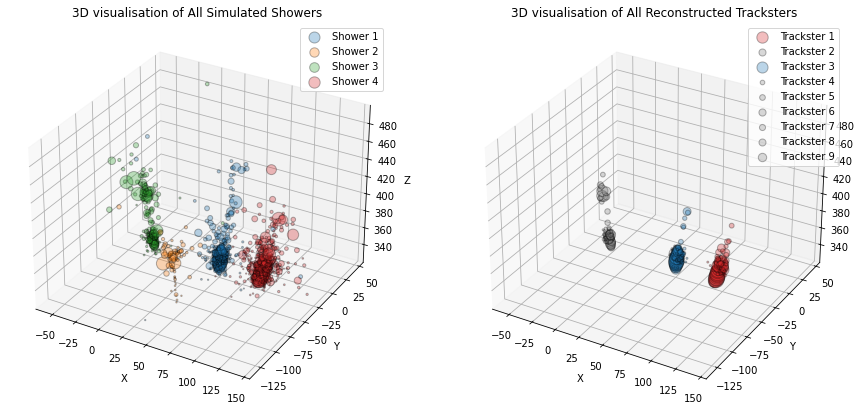

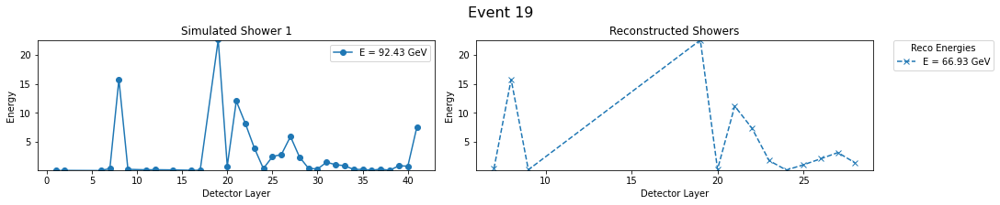

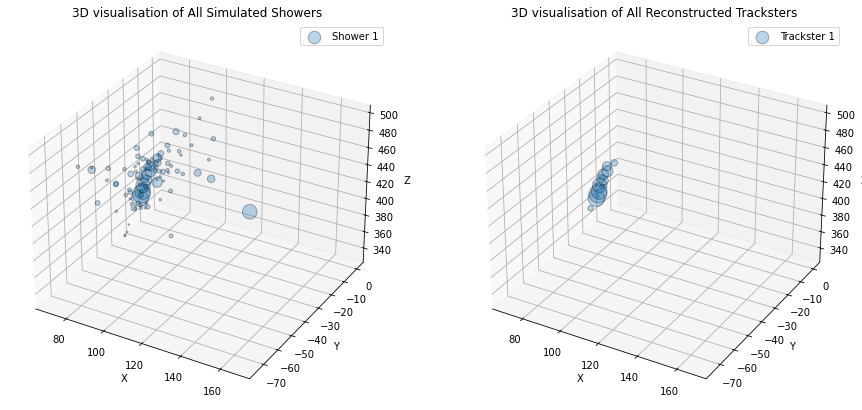

ValueError: in NumpyArray attempting to get 206, index out of range

(https://github.com/scikit-hep/awkward-1.0/blob/1.10.3/src/cpu-kernels/awkward_regularize_arrayslice.cpp#L14)

In [44]:
events = calculate_all_event_profile_data(GT_ind, energies, MT_ind_filt, layer, GT_mult, num_events = 20)